In [ ]:
from typing import Sequence
from dataclasses import dataclass

import jax
import jax.numpy as jnp
import flax.linen as nn
import numpy as np
import matplotlib.pyplot as plt
import optax
from flax.nnx import split, merge
import yaml
from pathlib import Path

from lhf import *

path = Path("../configs/config.yaml")
with path.open("r") as f:
    config = yaml.safe_load(f)

logger = Logger(
    log_dir="../logs/new_run",
    config=config
)

key = jax.random.PRNGKey(config["seed"])

In [ ]:
base_p = TaskParams(
    alpha = config["base_manifold"]["alpha"],
    beta = config["base_manifold"]["beta"],
    gamma = config["base_manifold"]["gamma"]
)

target_p = TaskParams(
    alpha = config["target_manifold"]["alpha"],
    beta = config["target_manifold"]["beta"],
    gamma = config["target_manifold"]["gamma"]
)

task_vis = ManifoldVisualizer(ylim=(-1,5))

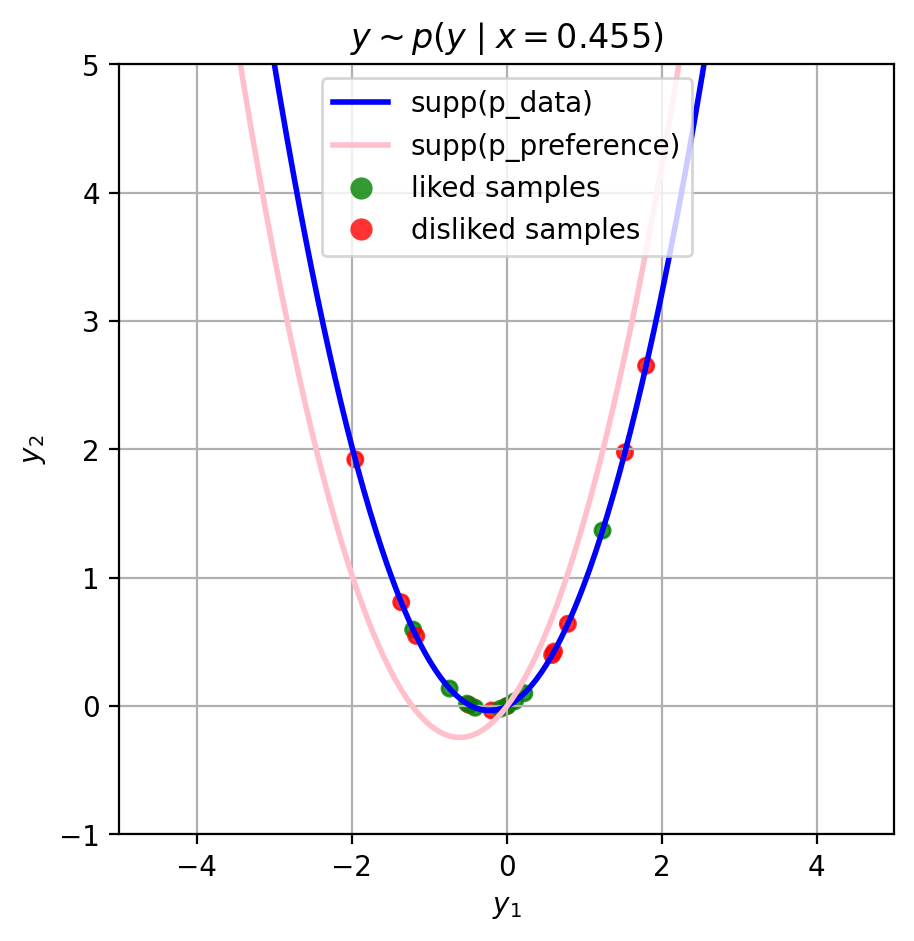

In [ ]:
n_queries = config["n_queries"]
n_internal = config["n_internal"]
m = config["m"]
tau = config["tau"]

(
    key,
    x_key,
    y_key,
    l_key
) = jax.random.split(key, 4)

x = jax.random.uniform(x_key, shape=(n_internal,1), minval=-1, maxval=1)
xs = jnp.broadcast_to(
    x[:,None,:],
    (n_internal, m, 1)
)   # (B,m,1)

logger.log_data(np.array(xs), "xs.npy")

vmapped_sample_manifold = jax.vmap(
    sample_manifold,
    in_axes=(0,1,None,None,None),
    out_axes=1
)
y_keys = jax.random.split(y_key, (m,))
ys = vmapped_sample_manifold(
    y_keys,
    xs,
    base_p.alpha,
    base_p.beta,
    base_p.gamma,
)   # (B,m,2)

gt_logits = logpdf_labels(
    xs,
    ys,
    alpha=target_p.alpha,
    beta=target_p.beta,
    gamma=target_p.gamma,
    tau=tau
)
# Sample labels
gt_labels = jax.random.categorical(
    l_key,
    gt_logits,
    axis=-1
)

fig = task_vis.visualize(
    xs[0,0,0],
    ys[0],
    base_manifold=base_p,
    target_manifold=target_p,
    labels=gt_labels[0]
)
logger.log_data(fig, Path("base") / "vis.png")

In [ ]:
num_iter = config["num_iter"]

# Logging:
gt_u_history = []
y_history = []
ys_tot = None
x_tot = None
l_tot = None
l_history = []

# Step 1: Pre-training
pre_train_epochs = config["pre_train_epochs"]
pre_train_lr = config["pre_train_lr"]
clip_norm = config["clip_norm"]
pre_train_batch_dim = config["pre_train_batch_dim"]
sigma_y_0 = config["sigma_y_0"]
sigma_y_T = config["sigma_y_T"]

(
    key,
    x_key,
    y_key,
    init_key,
    ys_key
) = jax.random.split(key, 5)

pre_train_features = config["pre_train_features"]
pre_train_n_features = len(pre_train_features)
d_z=config["d_z"]
d_y=config["d_y"]

encoder_mlp = MLP(
    features=pre_train_features,
    output_dim=d_z + (d_z*(d_z+1)) // 2,
    kernel_inits=[jax.nn.initializers.normal(1e-2)] * pre_train_n_features,
    bias_inits=[jax.nn.initializers.zeros] * pre_train_n_features
)
decoder_mlp = MLP(
    features=pre_train_features,
    output_dim=d_y,
    kernel_inits=[jax.nn.initializers.normal(1e-2)] * pre_train_n_features,
    bias_inits=[jax.nn.initializers.zeros] * pre_train_n_features
)

gen_model = ConditionalVAE(
    encoder=encoder_mlp,
    decoder=decoder_mlp,
    d_z=d_z,
    d_y=d_y
)
x_batch = xs[:pre_train_batch_dim,0]  # (B,1)
y_batch = ys[:pre_train_batch_dim,0]  # (B,2)

xz_batch = jnp.concatenate(
    [x_batch, jnp.zeros((pre_train_batch_dim,1))],
    axis=-1
)
xy_batch = jnp.concatenate(
    [x_batch, y_batch],
    axis=-1
)

vae_params = {
    "encoder": encoder_mlp.init(init_key, xy_batch),
    "decoder": decoder_mlp.init(init_key, xz_batch)
}
logger.log_data(vae_params, "base/vae_params.npz")

def pre_train_loss_fn(params, step, key, x, y):
        return -jnp.mean(
            gen_model.elbo(
                params,
                x,
                y,
                key,
                sigma_y=sigma_y_0 + (sigma_y_T - sigma_y_0)*(step+1)/pre_train_epochs,
            )
        )

@jax.jit
def pre_train_step(params, step, opt_state, key, x, y):
    loss, grads = jax.value_and_grad(pre_train_loss_fn)(params, step, key, x, y)
    updates, opt_state = opt.update(grads, opt_state)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss

def sample_many(params, key, x, m):
    keys = jax.random.split(key, m)
    return jax.vmap(
        lambda k: gen_model.sample(
            params,
            x,                     # (B, 1)
            k,
            sigma_y=sigma_y_T,
            deterministic=False,
        ),
        out_axes=1,
    )(keys)

# Step 2: Learn preference model
pref_lr = config["pref_lr"]
pref_batch_dim = config["pref_batch_dim"]
pref_train_epochs = config["pref_train_epochs"]

(
    key,
    init_key,
    l_key,
    gt_l_key
) = jax.random.split(key, 4)

mlp = MLP(
    features=config["pref_model_features"],
    output_dim=1
)

init_batch = jnp.zeros((pref_batch_dim, m, 2))
pref_params = {
    "y2_fn": mlp.init(init_key, init_batch),
}
logger.log_data(pref_params, "base/pref_params.npz")

y2_learned = lambda p, x, y1: mlp.apply(p, jnp.concatenate([x,y1], axis=2))

pref_model = PrefModel(
    y2_fn = y2_learned
)

def pref_nll(params, x, y, labels):
    logpdf = pref_model.logpdf(params, x, y, tau=tau)      # (B, m, 2)

    # Gather log-probabilities of the observed labels
    logp = jnp.take_along_axis(
        logpdf,
        labels[..., None],     # (B, m, 1)
        axis=-1,
    )[..., 0]                  # (B, m)

    return -jnp.mean(logp)

@jax.jit
def pref_train_step(params, opt_state, x, y, labels):
    loss, grads = jax.value_and_grad(pref_nll)(
        params,
        x,
        y,
        labels,
    )
    updates, opt_state = opt.update(grads, opt_state)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss

# Step 3: Improve VAE
align_lr = config["align_lr"]
align_batch_dim = config["align_batch_dim"]
align_epochs = config["align_epochs"]
beta = config["beta"]

def avg_u(params, key, y2_params, x, sigma_y):
    y = gen_model.sample(
        params,
        x,
        key,
        sigma_y=sigma_y,
        deterministic=False
    )      # (B, m, 2)

    y1 = y[:, None, 0][...,None]
    y2 = y[:, None, 1][...,None]
    y2_hat = y2_learned(y2_params, x[:, None, :], y1)
    u = -(y2 - y2_hat)**2

    return jnp.mean(u)

def kl_div(params, base_vae_params, key, x, sigma_y):
    kl = gen_model.d_kl(
        params,
        base_vae_params,
        x,
        key,
        sigma_y=sigma_y
    )

    return jnp.mean(kl)

def disp(params, x, key, n_z=8):
    d = gen_model.dispersion(
        params,
        x,
        key,
        n_z=n_z
    )
    return jnp.mean(d)

@jax.jit
def align_loss(params, base_vae_params, y2_params, key, x, sigma_y):
    u_bar = avg_u(
        params,
        key, 
        y2_params,
        x,
        sigma_y
    )
    kl = kl_div(
        params,
        base_vae_params,
        key,
        x,
        sigma_y
    )
    if config["use_dispersion_loss"]:
        gamma = config["gamma"]
        dispersion = disp(
            params,
            x,
            key,
            n_z=config["disp_samples"]
        )
        loss = -u_bar + beta * kl - gamma * jnp.log(dispersion)
    else:
        loss = -u_bar + beta * kl

    return loss

@jax.jit
def align_train_step(params, base_vae_params, y2_params, opt_state, key, x, sigma_y):
    loss, grads = jax.value_and_grad(align_loss)(
        params,
        base_vae_params,
        y2_params,
        key,
        x,
        sigma_y
    )
    updates, opt_state = opt.update(grads, opt_state)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss

vmapped_vae_sample = jax.vmap(
    gen_model.sample,
    in_axes=(None, 1, 0),
    out_axes=1
)

[1/4000] -ELBO = 3.1325700283050537
[2/4000] -ELBO = 3.132033586502075
[3/4000] -ELBO = 3.131451368331909
[4/4000] -ELBO = 3.130791187286377
[5/4000] -ELBO = 3.129995584487915
[6/4000] -ELBO = 3.1290056705474854
[7/4000] -ELBO = 3.1278607845306396
[8/4000] -ELBO = 3.126481771469116
[9/4000] -ELBO = 3.1248409748077393
[10/4000] -ELBO = 3.1229631900787354
[11/4000] -ELBO = 3.1207785606384277
[12/4000] -ELBO = 3.118242025375366
[13/4000] -ELBO = 3.1154046058654785
[14/4000] -ELBO = 3.1120619773864746
[15/4000] -ELBO = 3.1084835529327393
[16/4000] -ELBO = 3.104551076889038
[17/4000] -ELBO = 3.1001369953155518
[18/4000] -ELBO = 3.0953526496887207
[19/4000] -ELBO = 3.0902795791625977
[20/4000] -ELBO = 3.084679126739502
[21/4000] -ELBO = 3.0789389610290527
[22/4000] -ELBO = 3.0730457305908203
[23/4000] -ELBO = 3.0674617290496826
[24/4000] -ELBO = 3.061933994293213
[25/4000] -ELBO = 3.056514024734497
[26/4000] -ELBO = 3.0518951416015625
[27/4000] -ELBO = 3.048356533050537
[28/4000] -ELBO = 3.0

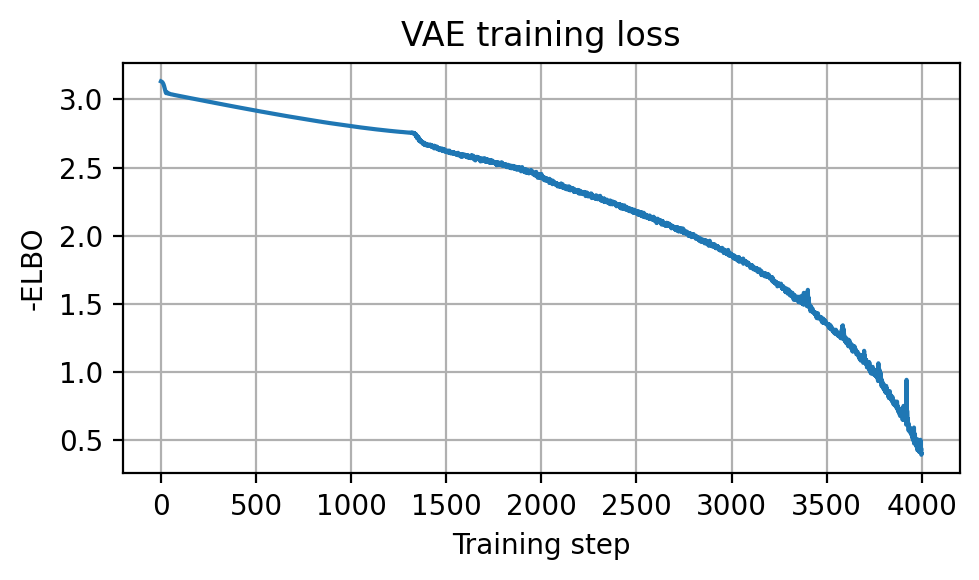

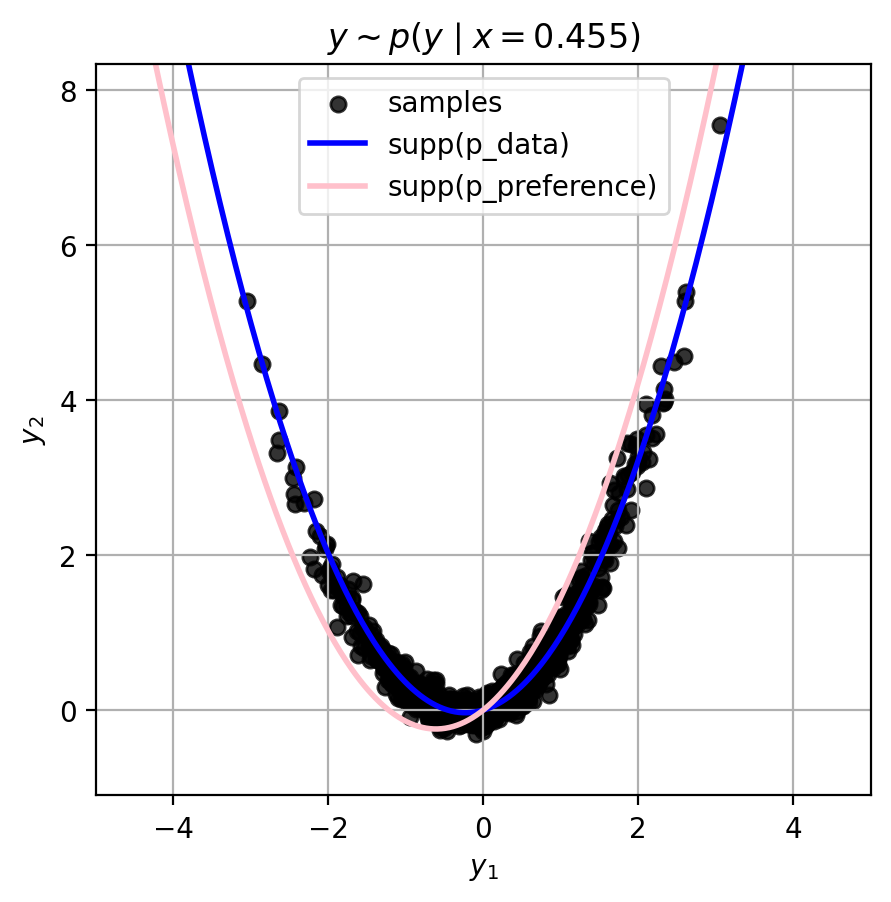

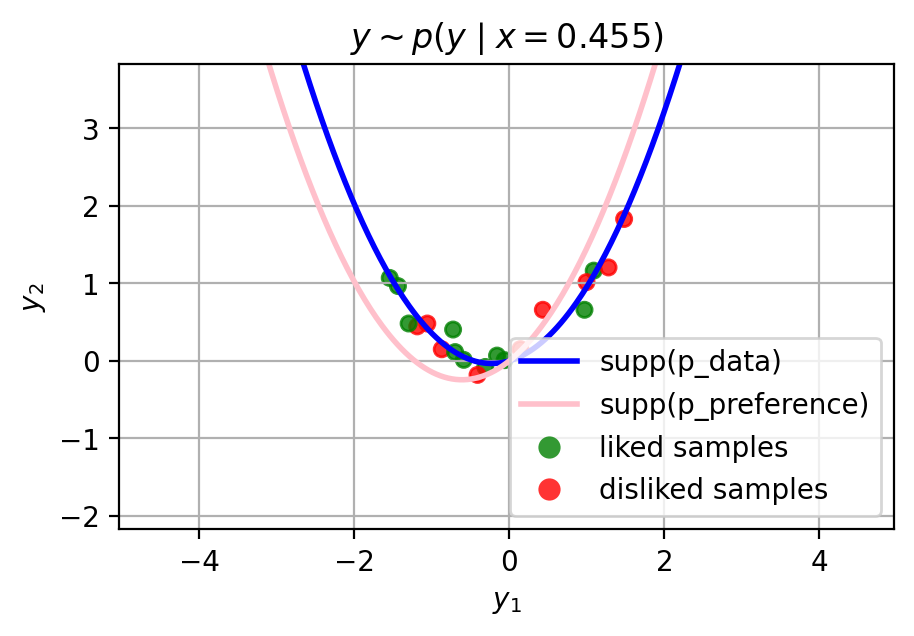

[1/2000] NLL = 1.0023
[2/2000] NLL = 0.8180
[3/2000] NLL = 0.7873
[4/2000] NLL = 0.7681
[5/2000] NLL = 0.7326
[6/2000] NLL = 0.7262
[7/2000] NLL = 0.7265
[8/2000] NLL = 0.7135
[9/2000] NLL = 0.7332
[10/2000] NLL = 0.7207
[11/2000] NLL = 0.7259
[12/2000] NLL = 0.7206
[13/2000] NLL = 0.7141
[14/2000] NLL = 0.7038
[15/2000] NLL = 0.7109
[16/2000] NLL = 0.7055
[17/2000] NLL = 0.7082
[18/2000] NLL = 0.7028
[19/2000] NLL = 0.6988
[20/2000] NLL = 0.7018
[21/2000] NLL = 0.6966
[22/2000] NLL = 0.7024
[23/2000] NLL = 0.7093
[24/2000] NLL = 0.6966
[25/2000] NLL = 0.7040
[26/2000] NLL = 0.7021
[27/2000] NLL = 0.7070
[28/2000] NLL = 0.7031
[29/2000] NLL = 0.6976
[30/2000] NLL = 0.6916
[31/2000] NLL = 0.6916
[32/2000] NLL = 0.6963
[33/2000] NLL = 0.6994
[34/2000] NLL = 0.6989
[35/2000] NLL = 0.6980
[36/2000] NLL = 0.6969
[37/2000] NLL = 0.6949
[38/2000] NLL = 0.6945
[39/2000] NLL = 0.6947
[40/2000] NLL = 0.6972
[41/2000] NLL = 0.6918
[42/2000] NLL = 0.6967
[43/2000] NLL = 0.6927
[44/2000] NLL = 0.69

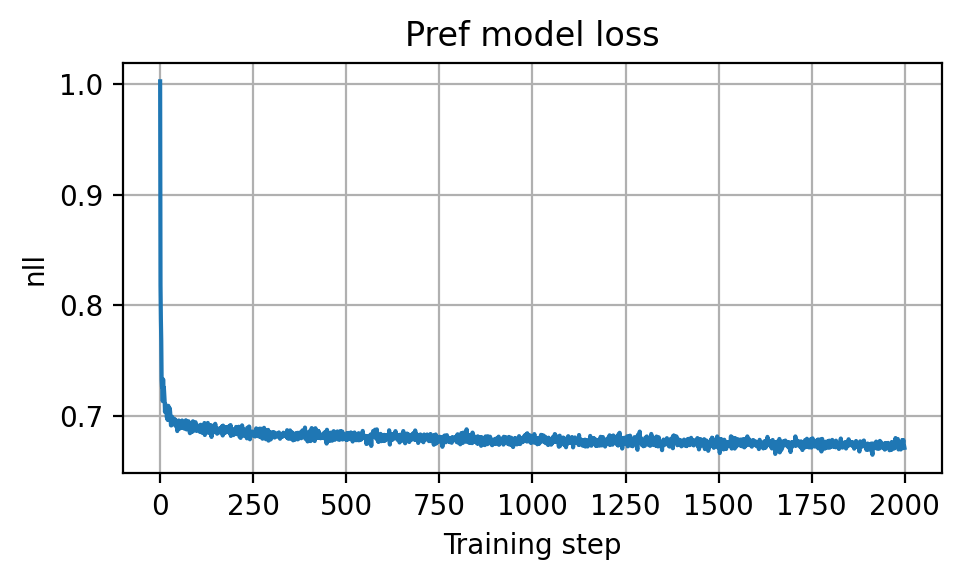

Dataset composition (likes/dislikes):   0.5038449764251709 / 0.4961550235748291
ACC(learned vs GT):   0.9416149854660034 / 0.514989972114563


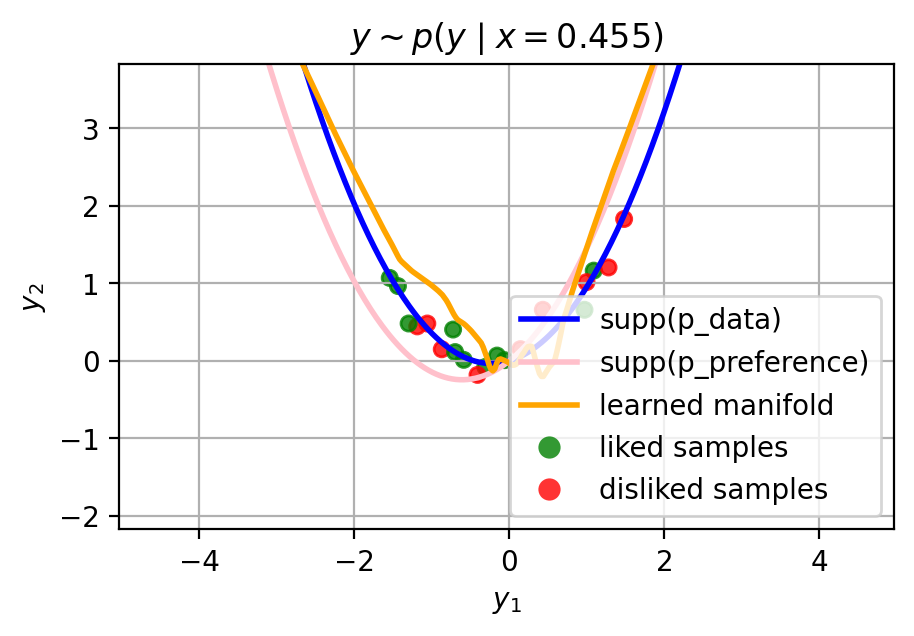

[1/1000] loss = -6.1614
[2/1000] loss = -8.6232
[3/1000] loss = -10.8379
[4/1000] loss = -13.1087
[5/1000] loss = -15.2166
[6/1000] loss = -17.1891
[7/1000] loss = -19.0075
[8/1000] loss = -20.7346
[9/1000] loss = -22.3794
[10/1000] loss = -24.0327
[11/1000] loss = -25.6288
[12/1000] loss = -26.5409
[13/1000] loss = -27.5859
[14/1000] loss = -28.7783
[15/1000] loss = -29.5900
[16/1000] loss = -30.0316
[17/1000] loss = -30.8663
[18/1000] loss = -30.9968
[19/1000] loss = -31.6652
[20/1000] loss = -31.7893
[21/1000] loss = -31.7276
[22/1000] loss = -32.6875
[23/1000] loss = -32.4514
[24/1000] loss = -32.5556
[25/1000] loss = -32.8365
[26/1000] loss = -33.4831
[27/1000] loss = -33.7362
[28/1000] loss = -33.8564
[29/1000] loss = -34.0423
[30/1000] loss = -34.8968
[31/1000] loss = -34.7882
[32/1000] loss = -35.1052
[33/1000] loss = -35.1379
[34/1000] loss = -35.5274
[35/1000] loss = -36.3729
[36/1000] loss = -35.6481
[37/1000] loss = -35.9496
[38/1000] loss = -36.1531
[39/1000] loss = -35.74

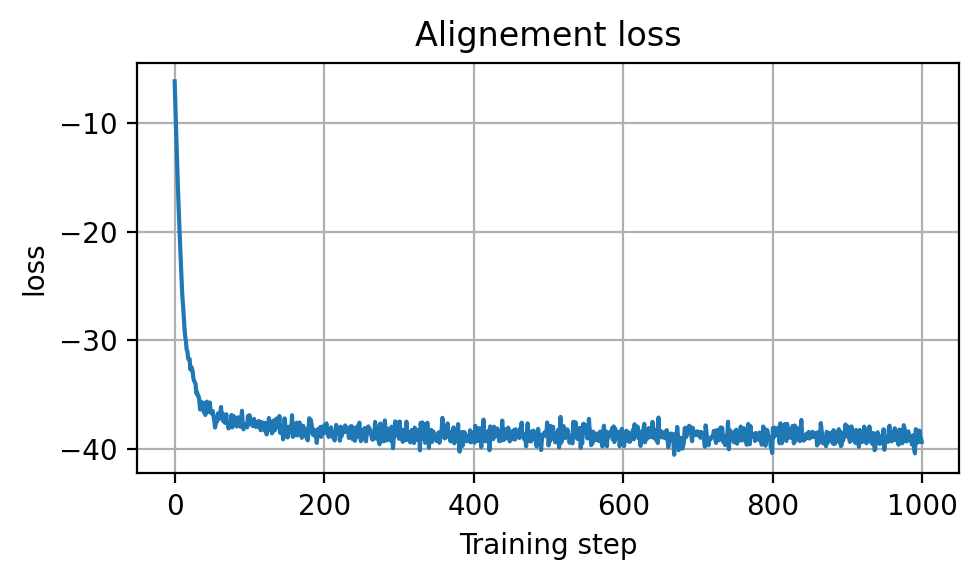

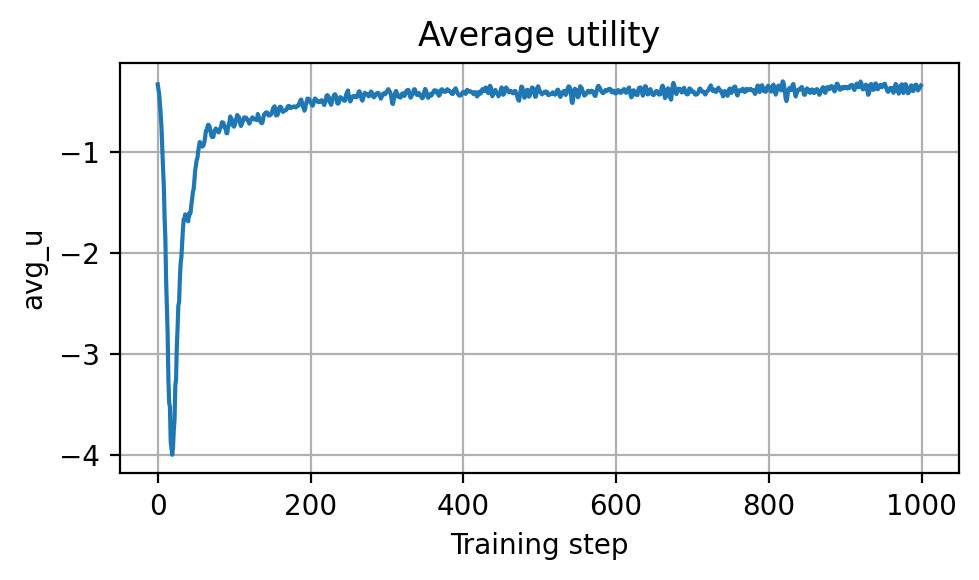

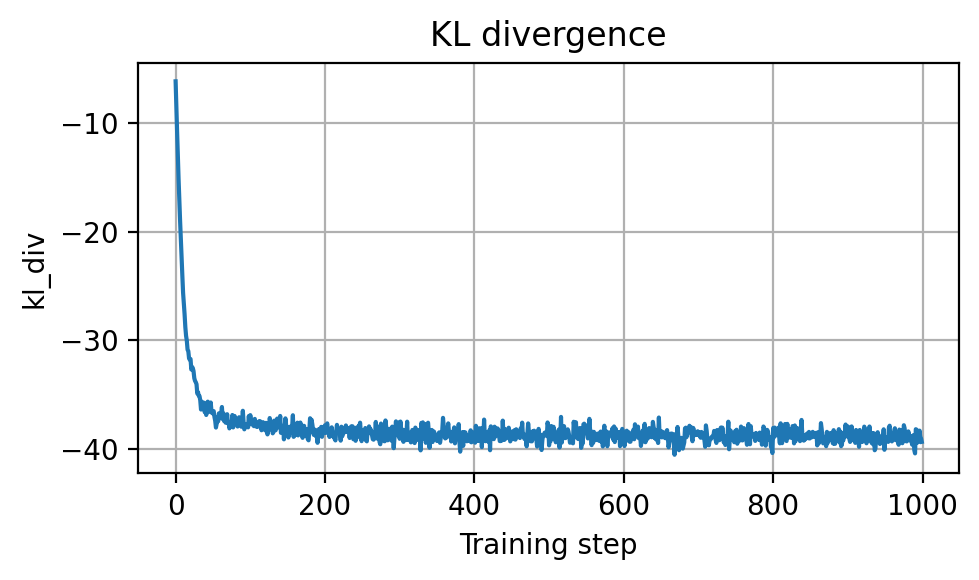

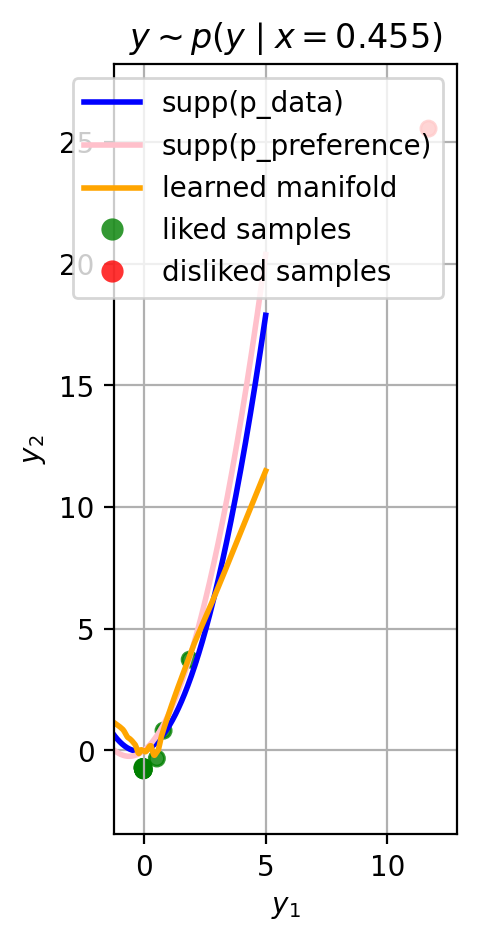

[1/4000] -ELBO = 352.7244873046875
[2/4000] -ELBO = 269.6705627441406
[3/4000] -ELBO = 204.106689453125
[4/4000] -ELBO = 152.9065399169922
[5/4000] -ELBO = 113.80547332763672
[6/4000] -ELBO = 84.49665069580078
[7/4000] -ELBO = 62.9584846496582
[8/4000] -ELBO = 47.390018463134766
[9/4000] -ELBO = 36.200897216796875
[10/4000] -ELBO = 28.091705322265625
[11/4000] -ELBO = 22.286468505859375
[12/4000] -ELBO = 18.131803512573242
[13/4000] -ELBO = 14.989684104919434
[14/4000] -ELBO = 12.660653114318848
[15/4000] -ELBO = 11.00070571899414
[16/4000] -ELBO = 9.895628929138184
[17/4000] -ELBO = 9.209089279174805
[18/4000] -ELBO = 8.755779266357422
[19/4000] -ELBO = 8.434127807617188
[20/4000] -ELBO = 8.258338928222656
[21/4000] -ELBO = 8.203933715820312
[22/4000] -ELBO = 8.20126724243164
[23/4000] -ELBO = 8.131611824035645
[24/4000] -ELBO = 7.873528003692627
[25/4000] -ELBO = 7.551481246948242
[26/4000] -ELBO = 7.207370281219482
[27/4000] -ELBO = 6.952571868896484
[28/4000] -ELBO = 6.756884098052

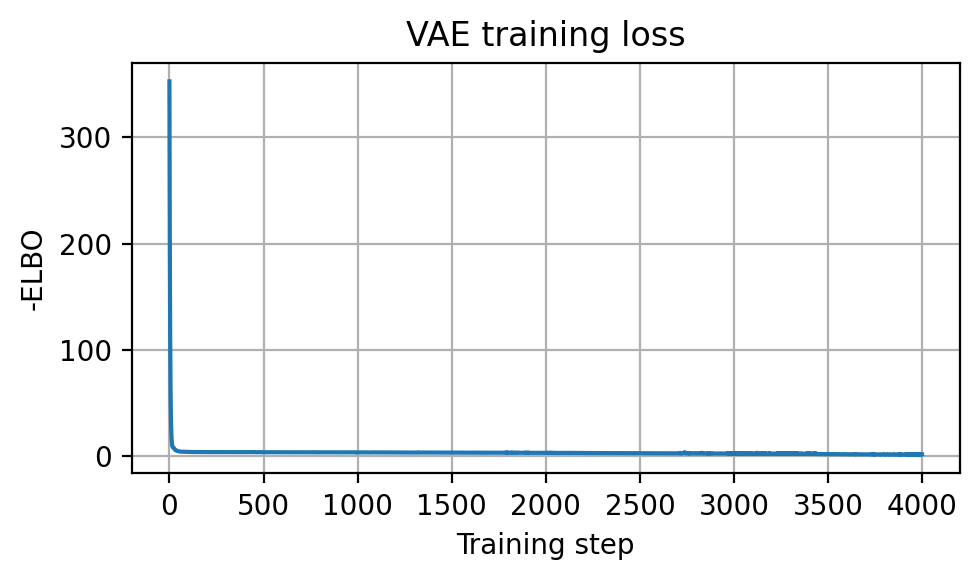

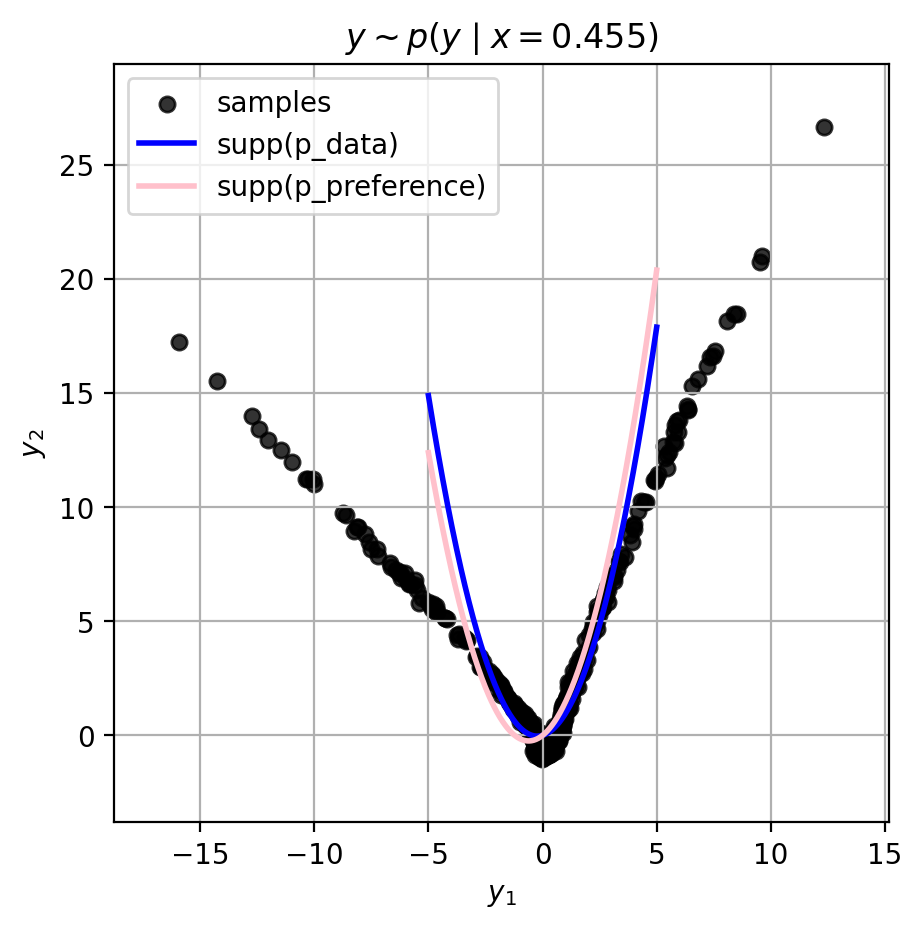

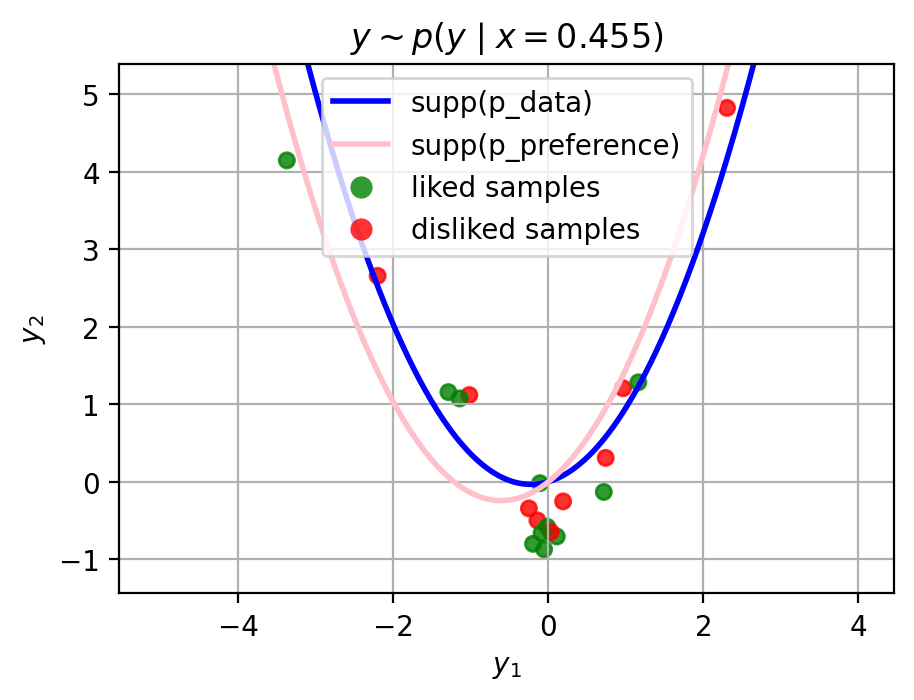

[1/2000] NLL = 0.6867
[2/2000] NLL = 0.6119
[3/2000] NLL = 0.7126
[4/2000] NLL = 0.6316
[5/2000] NLL = 0.5508
[6/2000] NLL = 0.6044
[7/2000] NLL = 0.6201
[8/2000] NLL = 0.6090
[9/2000] NLL = 0.5468
[10/2000] NLL = 0.5442
[11/2000] NLL = 0.5649
[12/2000] NLL = 0.5931
[13/2000] NLL = 0.5574
[14/2000] NLL = 0.5725
[15/2000] NLL = 0.5592
[16/2000] NLL = 0.5332
[17/2000] NLL = 0.5555
[18/2000] NLL = 0.5548
[19/2000] NLL = 0.5526
[20/2000] NLL = 0.5245
[21/2000] NLL = 0.5203
[22/2000] NLL = 0.5389
[23/2000] NLL = 0.5608
[24/2000] NLL = 0.5493
[25/2000] NLL = 0.5544
[26/2000] NLL = 0.5474
[27/2000] NLL = 0.5250
[28/2000] NLL = 0.5063
[29/2000] NLL = 0.5505
[30/2000] NLL = 0.5229
[31/2000] NLL = 0.5197
[32/2000] NLL = 0.5015
[33/2000] NLL = 0.5244
[34/2000] NLL = 0.4961
[35/2000] NLL = 0.5602
[36/2000] NLL = 0.5291
[37/2000] NLL = 0.5038
[38/2000] NLL = 0.5298
[39/2000] NLL = 0.5126
[40/2000] NLL = 0.5061
[41/2000] NLL = 0.5440
[42/2000] NLL = 0.5144
[43/2000] NLL = 0.5251
[44/2000] NLL = 0.53

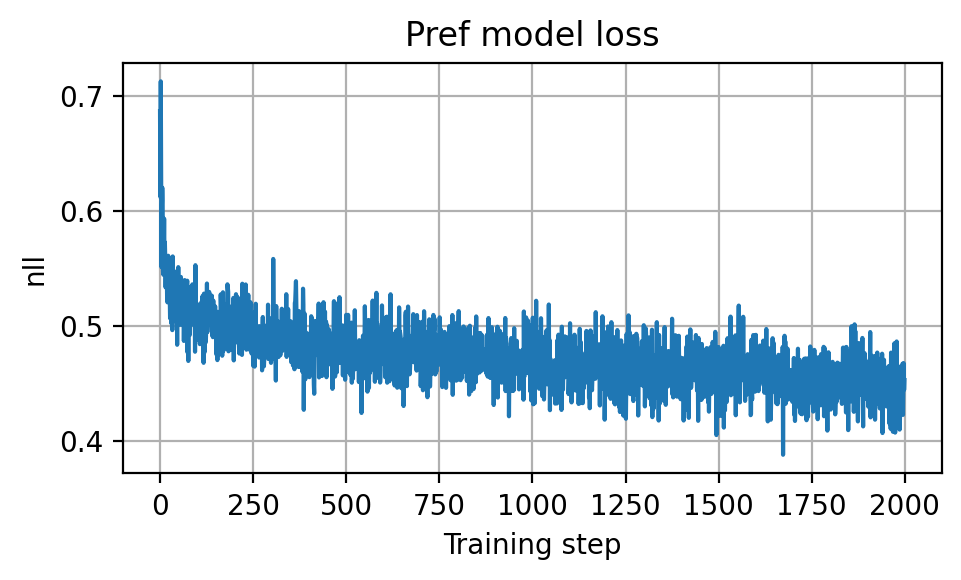

Dataset composition (likes/dislikes):   0.7765849828720093 / 0.22341501712799072
ACC(learned vs GT):   0.9471849799156189 / 0.8946699500083923


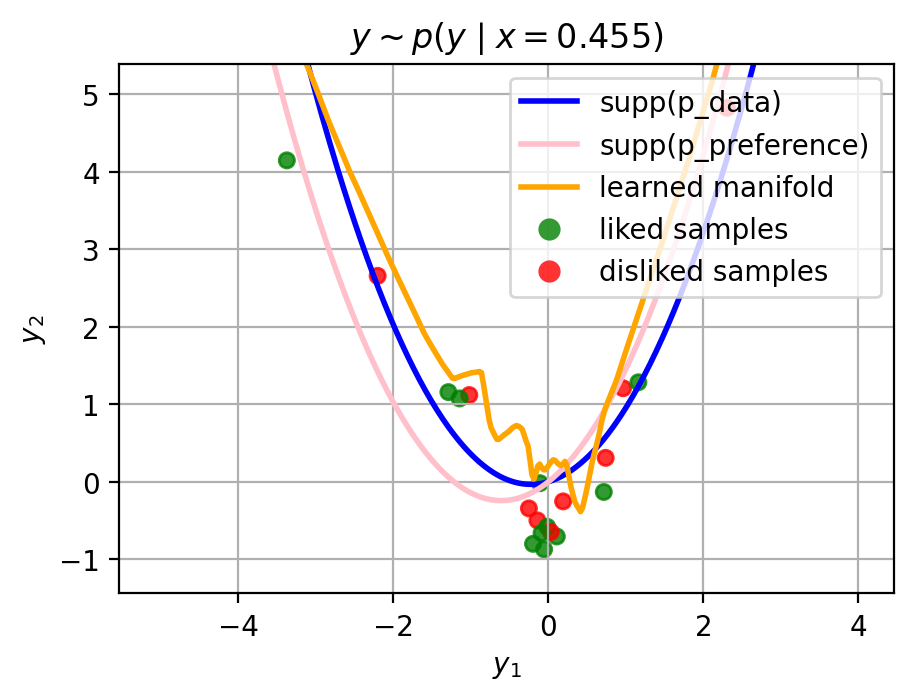

[1/1000] loss = -27.4681
[2/1000] loss = -30.4911
[3/1000] loss = -33.4186
[4/1000] loss = -34.5735
[5/1000] loss = -36.4330
[6/1000] loss = -37.2499
[7/1000] loss = -38.6621
[8/1000] loss = -39.6386
[9/1000] loss = -39.8528
[10/1000] loss = -40.8068
[11/1000] loss = -41.4757
[12/1000] loss = -42.2430
[13/1000] loss = -42.7822
[14/1000] loss = -43.0368
[15/1000] loss = -43.6791
[16/1000] loss = -43.8037
[17/1000] loss = -44.3444
[18/1000] loss = -44.3367
[19/1000] loss = -44.7888
[20/1000] loss = -44.7001
[21/1000] loss = -45.0742
[22/1000] loss = -45.0864
[23/1000] loss = -45.9384
[24/1000] loss = -45.8165
[25/1000] loss = -45.6915
[26/1000] loss = -45.8498
[27/1000] loss = -46.2205
[28/1000] loss = -46.6251
[29/1000] loss = -45.9714
[30/1000] loss = -46.9616
[31/1000] loss = -46.5974
[32/1000] loss = -46.7252
[33/1000] loss = -46.7966
[34/1000] loss = -47.2104
[35/1000] loss = -46.9397
[36/1000] loss = -47.2467
[37/1000] loss = -47.3132
[38/1000] loss = -46.9955
[39/1000] loss = -47.

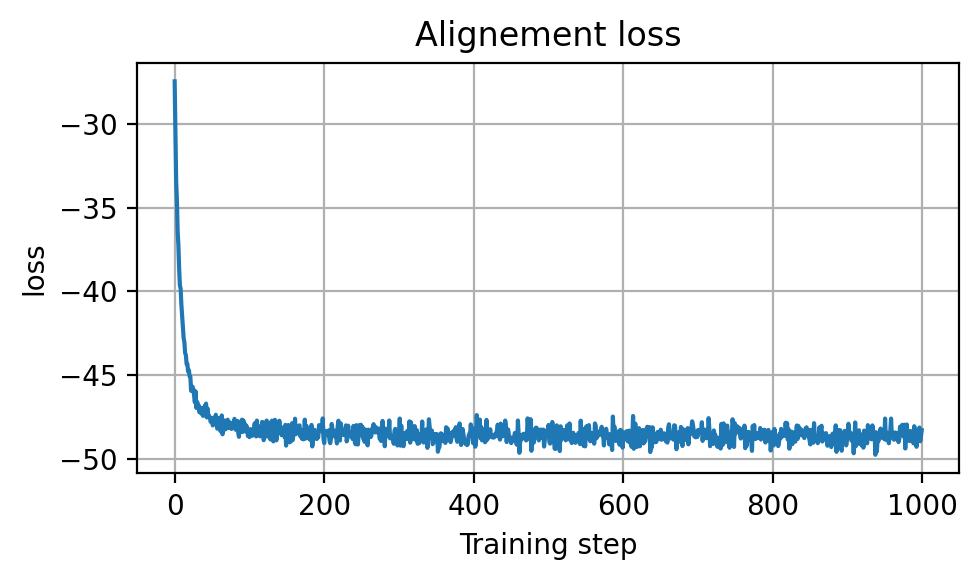

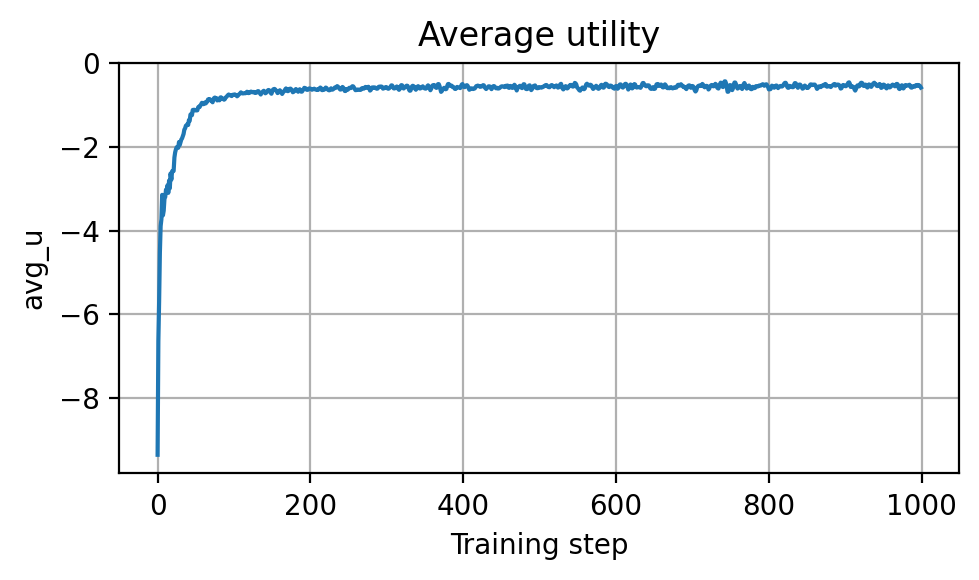

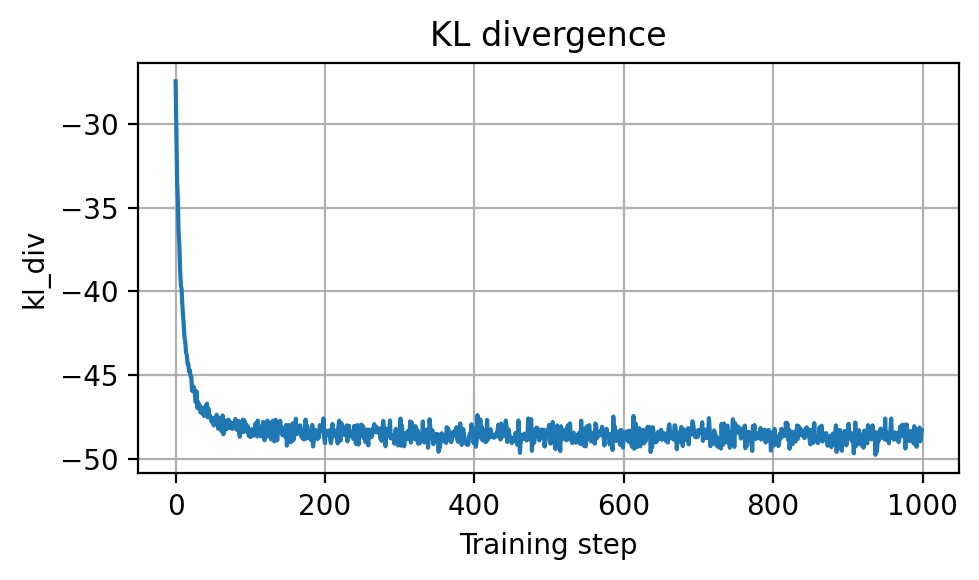

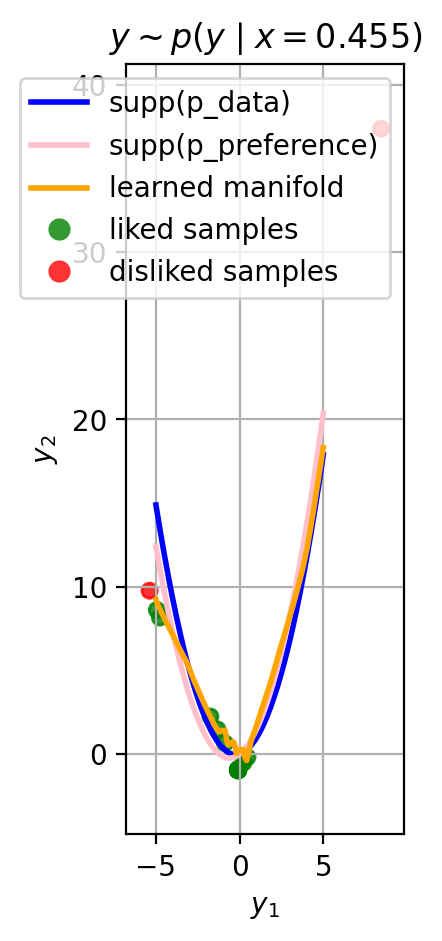

[1/4000] -ELBO = 259.903076171875
[2/4000] -ELBO = 200.6263427734375
[3/4000] -ELBO = 156.0498046875
[4/4000] -ELBO = 121.71263122558594
[5/4000] -ELBO = 94.33885192871094
[6/4000] -ELBO = 71.93736267089844
[7/4000] -ELBO = 60.27574920654297
[8/4000] -ELBO = 43.12997817993164
[9/4000] -ELBO = 34.410213470458984
[10/4000] -ELBO = 27.6624813079834
[11/4000] -ELBO = 22.62058448791504
[12/4000] -ELBO = 19.52341079711914
[13/4000] -ELBO = 21.815109252929688
[14/4000] -ELBO = 24.35015869140625
[15/4000] -ELBO = 19.23773765563965
[16/4000] -ELBO = 16.560457229614258
[17/4000] -ELBO = 16.080371856689453
[18/4000] -ELBO = 15.420077323913574
[19/4000] -ELBO = 15.355559349060059
[20/4000] -ELBO = 15.041240692138672
[21/4000] -ELBO = 14.491718292236328
[22/4000] -ELBO = 13.85934066772461
[23/4000] -ELBO = 13.074559211730957
[24/4000] -ELBO = 12.286666870117188
[25/4000] -ELBO = 11.53626823425293
[26/4000] -ELBO = 10.887120246887207
[27/4000] -ELBO = 10.349502563476562
[28/4000] -ELBO = 10.11753082

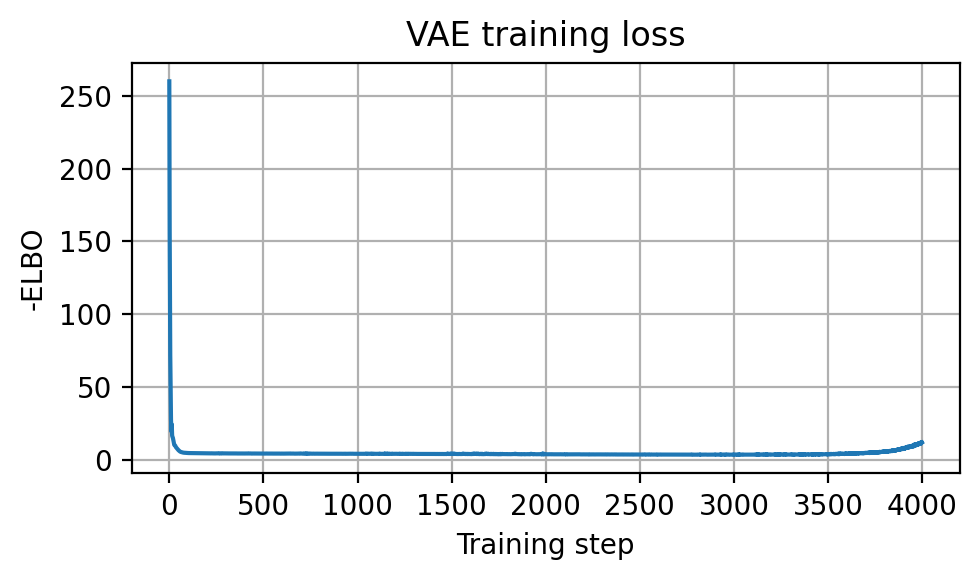

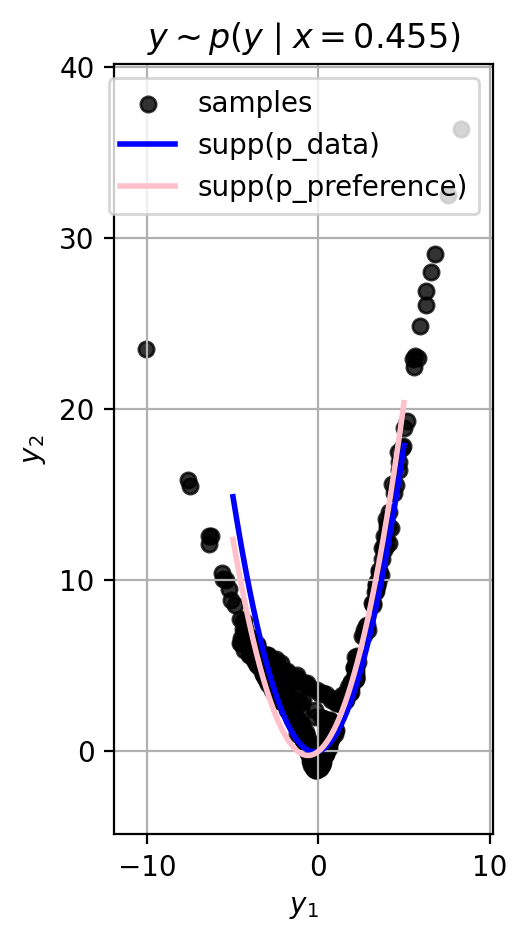

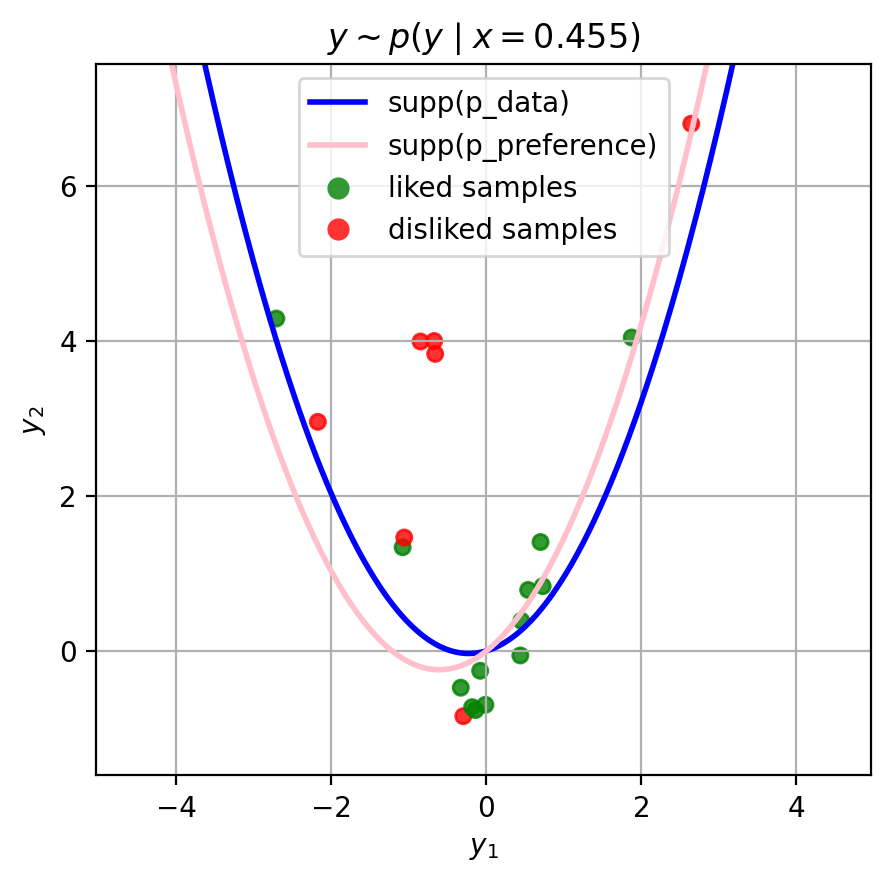

[1/2000] NLL = 0.5890
[2/2000] NLL = 0.6263
[3/2000] NLL = 0.5190
[4/2000] NLL = 0.5394
[5/2000] NLL = 0.5381
[6/2000] NLL = 0.5470
[7/2000] NLL = 0.5293
[8/2000] NLL = 0.5012
[9/2000] NLL = 0.4772
[10/2000] NLL = 0.5136
[11/2000] NLL = 0.5715
[12/2000] NLL = 0.5075
[13/2000] NLL = 0.4829
[14/2000] NLL = 0.5077
[15/2000] NLL = 0.5334
[16/2000] NLL = 0.5087
[17/2000] NLL = 0.5232
[18/2000] NLL = 0.5285
[19/2000] NLL = 0.5428
[20/2000] NLL = 0.5456
[21/2000] NLL = 0.4854
[22/2000] NLL = 0.4877
[23/2000] NLL = 0.5590
[24/2000] NLL = 0.5376
[25/2000] NLL = 0.5002
[26/2000] NLL = 0.5069
[27/2000] NLL = 0.5172
[28/2000] NLL = 0.5062
[29/2000] NLL = 0.5580
[30/2000] NLL = 0.5060
[31/2000] NLL = 0.5473
[32/2000] NLL = 0.4594
[33/2000] NLL = 0.5135
[34/2000] NLL = 0.4790
[35/2000] NLL = 0.5194
[36/2000] NLL = 0.5323
[37/2000] NLL = 0.4897
[38/2000] NLL = 0.5381
[39/2000] NLL = 0.5025
[40/2000] NLL = 0.5237
[41/2000] NLL = 0.4896
[42/2000] NLL = 0.4969
[43/2000] NLL = 0.5189
[44/2000] NLL = 0.50

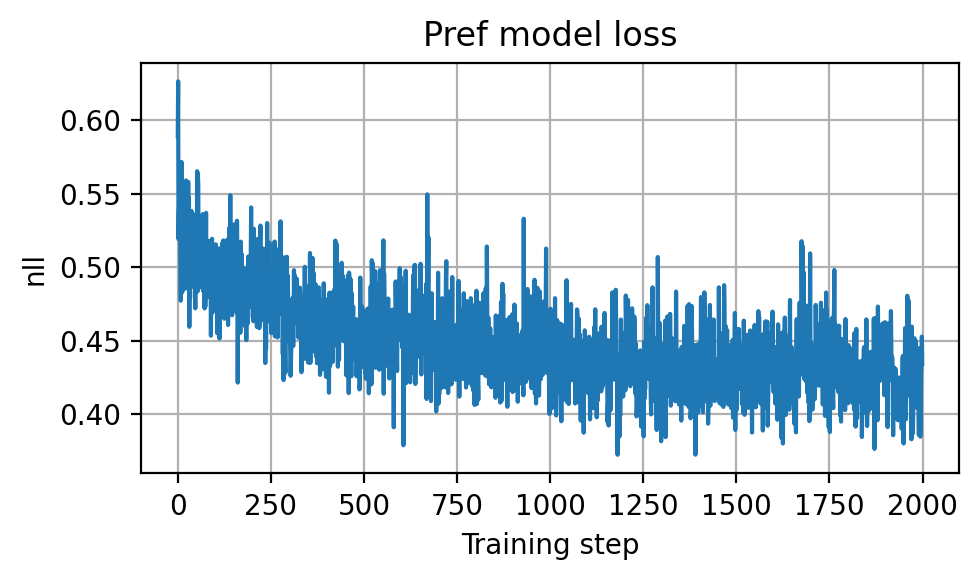

Dataset composition (likes/dislikes):   0.7479899525642395 / 0.2520100474357605
ACC(learned vs GT):   0.9046599864959717 / 0.8771399855613708


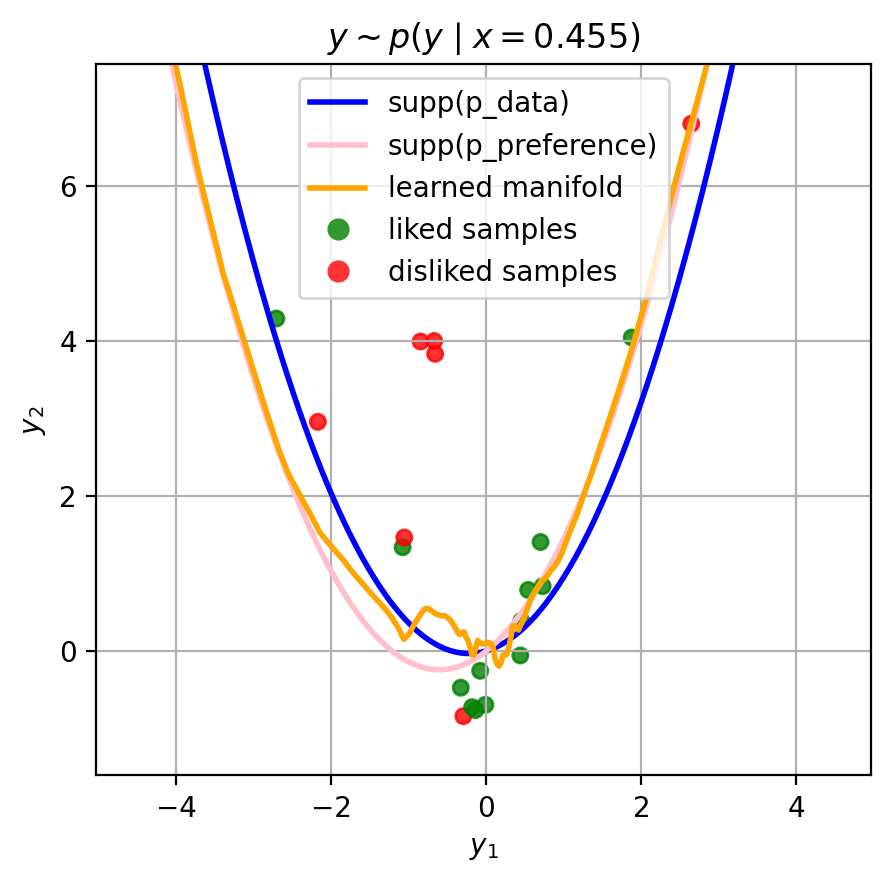

[1/1000] loss = -37.1770
[2/1000] loss = -39.6611
[3/1000] loss = -41.3193
[4/1000] loss = -42.2862
[5/1000] loss = -42.8752
[6/1000] loss = -43.8702
[7/1000] loss = -43.8158
[8/1000] loss = -44.9877
[9/1000] loss = -45.0907
[10/1000] loss = -45.7208
[11/1000] loss = -45.8775
[12/1000] loss = -46.3531
[13/1000] loss = -46.4382
[14/1000] loss = -46.5736
[15/1000] loss = -47.2103
[16/1000] loss = -46.9017
[17/1000] loss = -47.2370
[18/1000] loss = -47.4557
[19/1000] loss = -48.0889
[20/1000] loss = -48.0407
[21/1000] loss = -47.4086
[22/1000] loss = -47.8417
[23/1000] loss = -48.1813
[24/1000] loss = -47.7696
[25/1000] loss = -48.1729
[26/1000] loss = -48.5953
[27/1000] loss = -48.3238
[28/1000] loss = -48.6010
[29/1000] loss = -48.8192
[30/1000] loss = -48.3248
[31/1000] loss = -48.6538
[32/1000] loss = -48.9304
[33/1000] loss = -48.4100
[34/1000] loss = -48.9507
[35/1000] loss = -48.6143
[36/1000] loss = -48.9810
[37/1000] loss = -49.0017
[38/1000] loss = -49.3364
[39/1000] loss = -48.

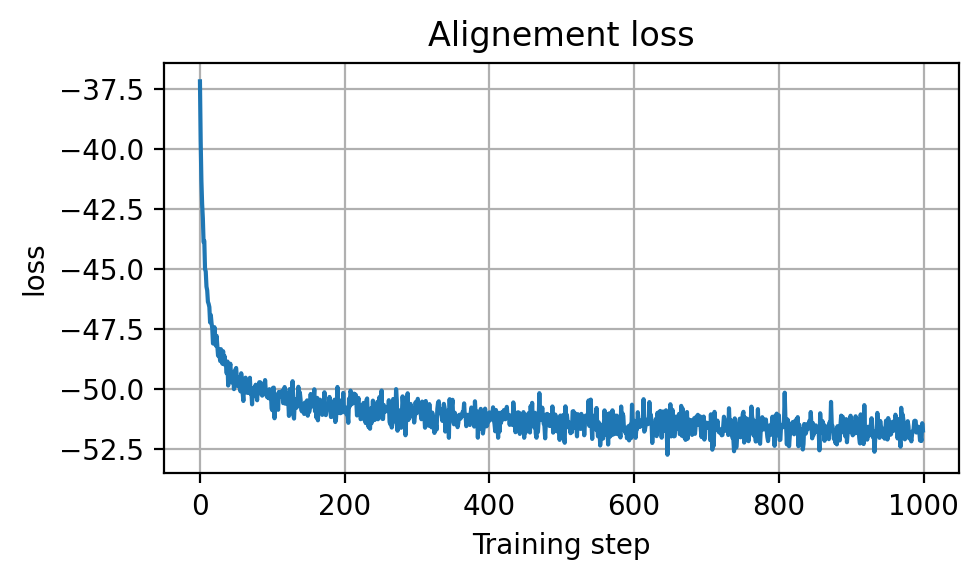

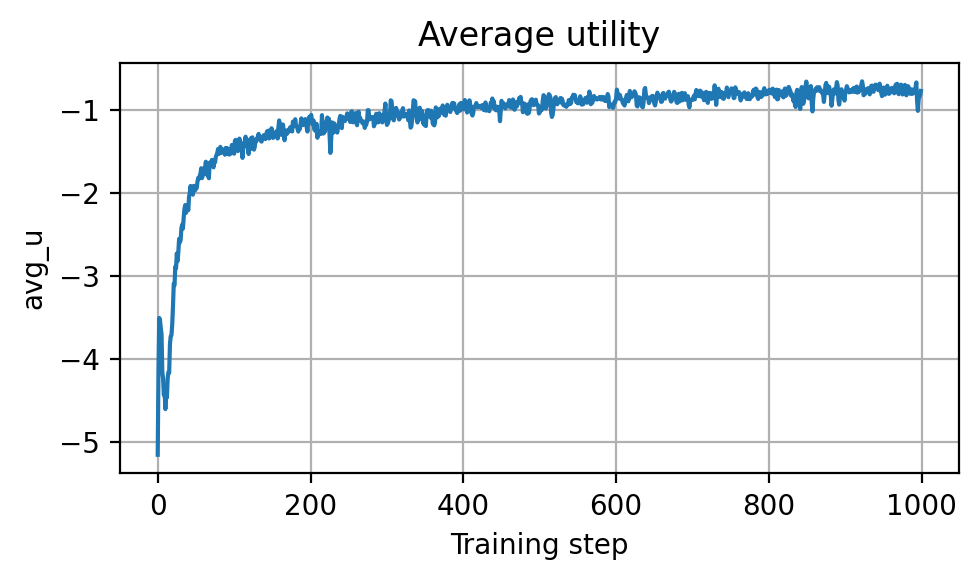

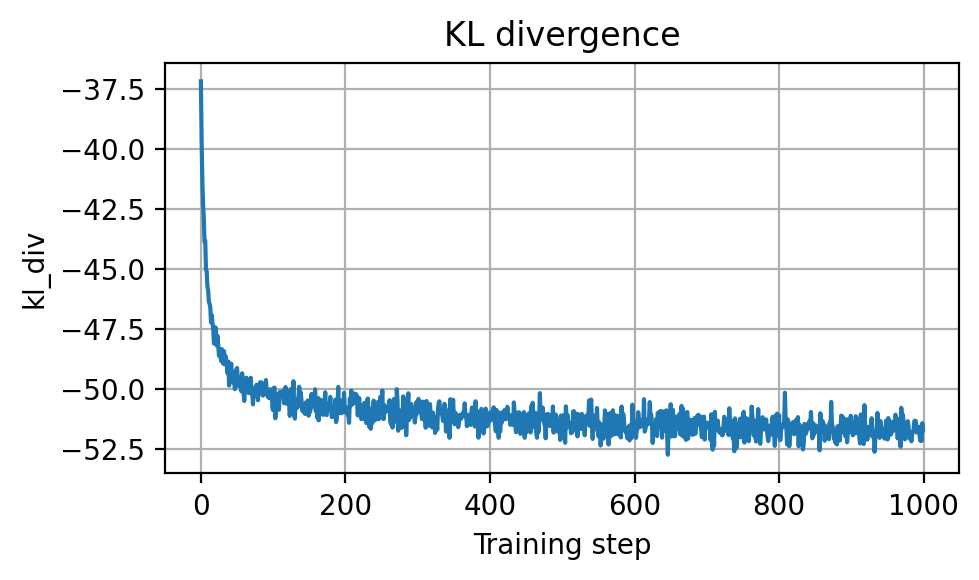

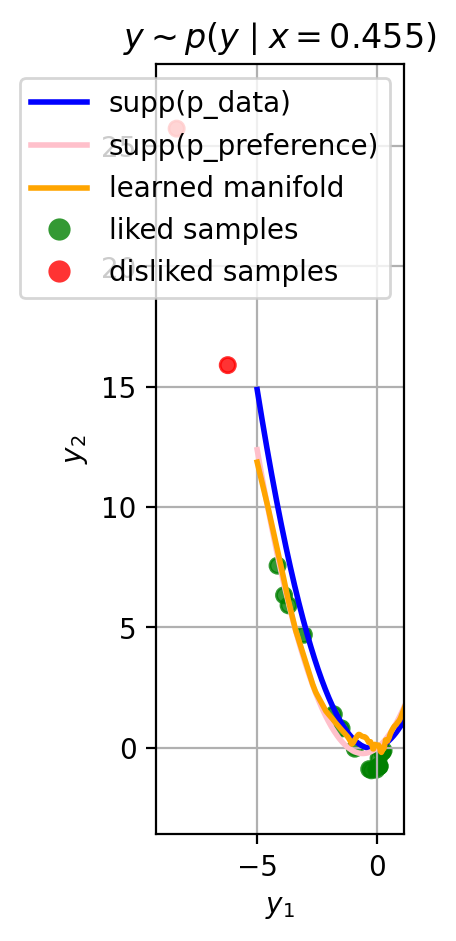

[1/4000] -ELBO = 16.79997444152832
[2/4000] -ELBO = 9.780768394470215
[3/4000] -ELBO = 8.653078079223633
[4/4000] -ELBO = 8.741669654846191
[5/4000] -ELBO = 8.028299331665039
[6/4000] -ELBO = 7.226733207702637
[7/4000] -ELBO = 7.114373207092285
[8/4000] -ELBO = 7.156672477722168
[9/4000] -ELBO = 6.838441371917725
[10/4000] -ELBO = 6.3137640953063965
[11/4000] -ELBO = 5.98693323135376
[12/4000] -ELBO = 5.94442081451416
[13/4000] -ELBO = 5.922760963439941
[14/4000] -ELBO = 5.820116996765137
[15/4000] -ELBO = 5.692450046539307
[16/4000] -ELBO = 5.546396732330322
[17/4000] -ELBO = 5.460762977600098
[18/4000] -ELBO = 5.327009677886963
[19/4000] -ELBO = 5.365382194519043
[20/4000] -ELBO = 5.267210960388184
[21/4000] -ELBO = 5.214622974395752
[22/4000] -ELBO = 5.180708408355713
[23/4000] -ELBO = 5.178182125091553
[24/4000] -ELBO = 5.0873918533325195
[25/4000] -ELBO = 5.0566253662109375
[26/4000] -ELBO = 5.010369777679443
[27/4000] -ELBO = 5.017313003540039
[28/4000] -ELBO = 4.983584880828857


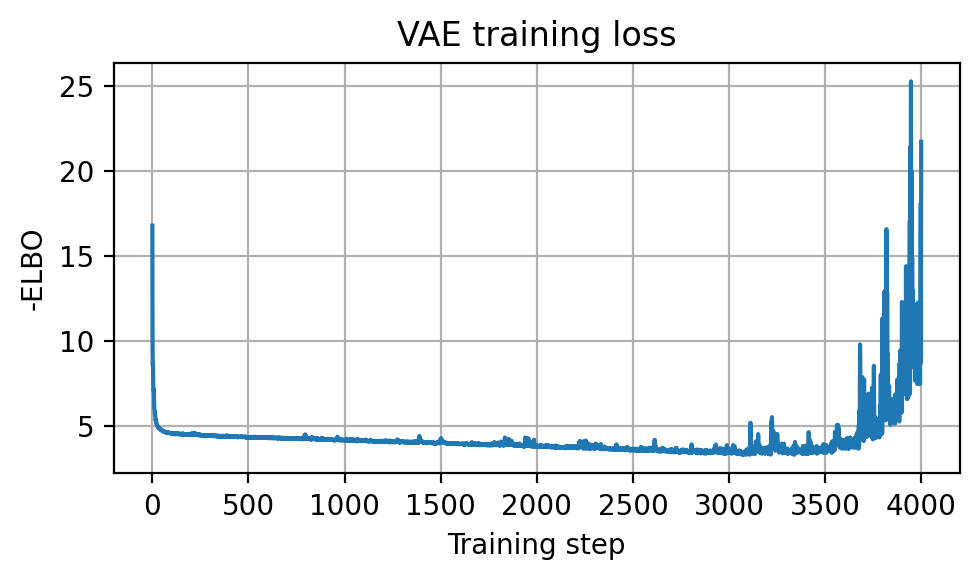

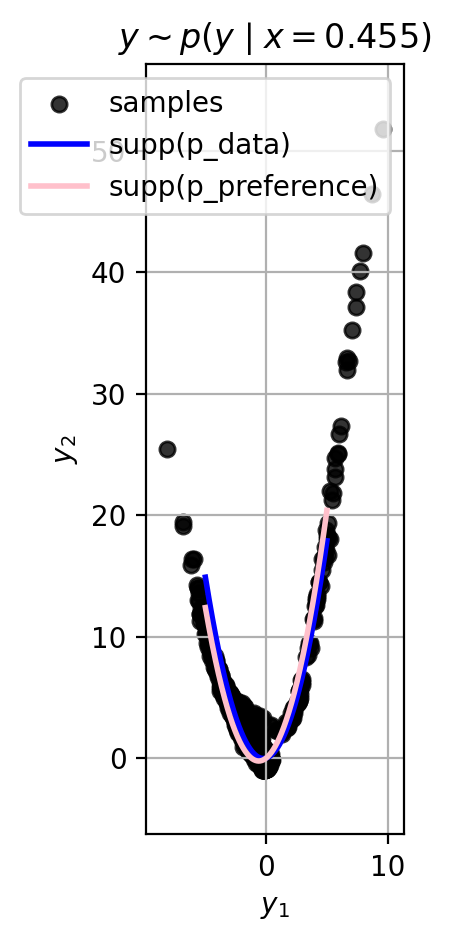

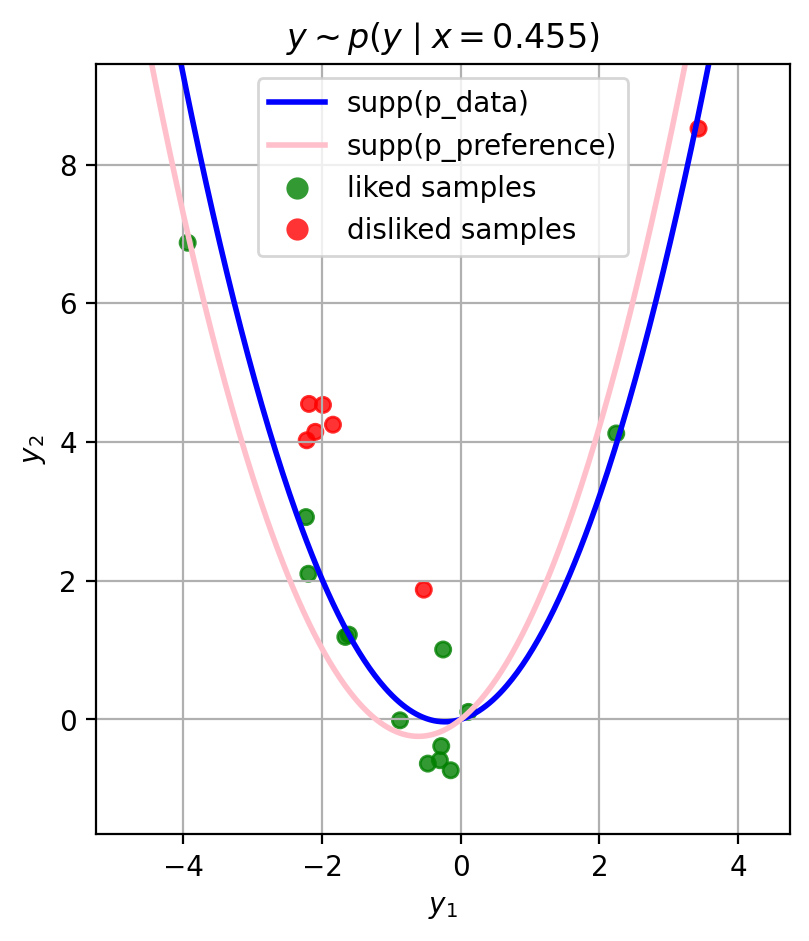

[1/2000] NLL = 0.4894
[2/2000] NLL = 1.0102
[3/2000] NLL = 0.5157
[4/2000] NLL = 0.6843
[5/2000] NLL = 0.6762
[6/2000] NLL = 0.6564
[7/2000] NLL = 0.5860
[8/2000] NLL = 0.5890
[9/2000] NLL = 0.5240
[10/2000] NLL = 0.5635
[11/2000] NLL = 0.5410
[12/2000] NLL = 0.5824
[13/2000] NLL = 0.4933
[14/2000] NLL = 0.4799
[15/2000] NLL = 0.4528
[16/2000] NLL = 0.4628
[17/2000] NLL = 0.5560
[18/2000] NLL = 0.4817
[19/2000] NLL = 0.4713
[20/2000] NLL = 0.4735
[21/2000] NLL = 0.5047
[22/2000] NLL = 0.4695
[23/2000] NLL = 0.4542
[24/2000] NLL = 0.4796
[25/2000] NLL = 0.4776
[26/2000] NLL = 0.4790
[27/2000] NLL = 0.5235
[28/2000] NLL = 0.4528
[29/2000] NLL = 0.4794
[30/2000] NLL = 0.4516
[31/2000] NLL = 0.4615
[32/2000] NLL = 0.4379
[33/2000] NLL = 0.4908
[34/2000] NLL = 0.4666
[35/2000] NLL = 0.4547
[36/2000] NLL = 0.4273
[37/2000] NLL = 0.4650
[38/2000] NLL = 0.4364
[39/2000] NLL = 0.4904
[40/2000] NLL = 0.4960
[41/2000] NLL = 0.4620
[42/2000] NLL = 0.4189
[43/2000] NLL = 0.4629
[44/2000] NLL = 0.47

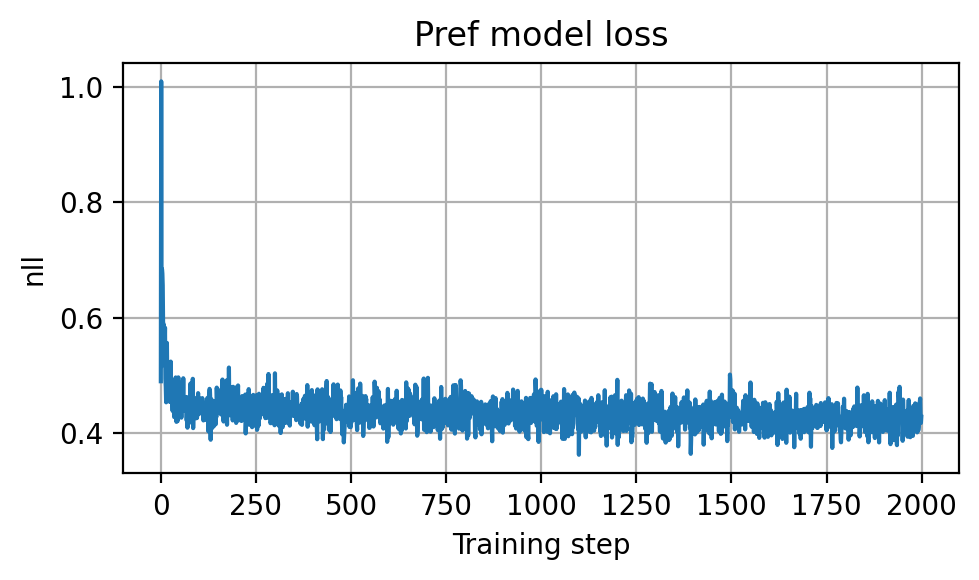

Dataset composition (likes/dislikes):   0.7170699834823608 / 0.28293001651763916
ACC(learned vs GT):   0.8646049499511719 / 0.8702749609947205


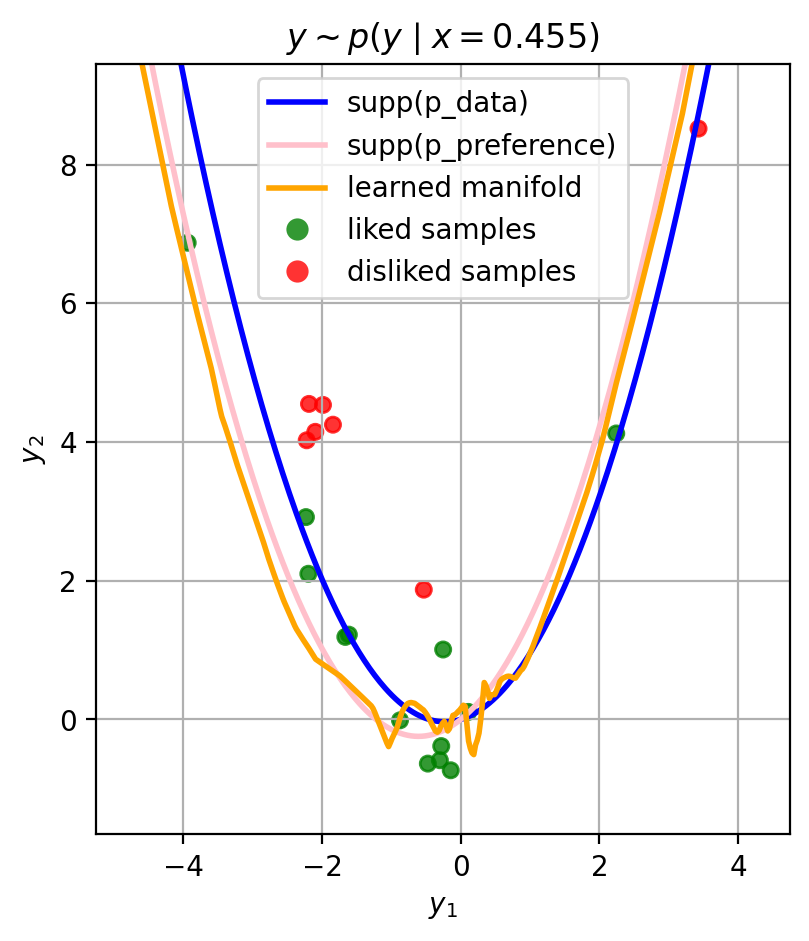

[1/1000] loss = -46.5697
[2/1000] loss = -45.9991
[3/1000] loss = -48.0225
[4/1000] loss = -50.2064
[5/1000] loss = -50.0109
[6/1000] loss = -50.6094
[7/1000] loss = -51.3371
[8/1000] loss = -52.2319
[9/1000] loss = -52.2568
[10/1000] loss = -52.5042
[11/1000] loss = -53.1060
[12/1000] loss = -53.2598
[13/1000] loss = -53.3953
[14/1000] loss = -53.5822
[15/1000] loss = -53.7968
[16/1000] loss = -53.8176
[17/1000] loss = -53.8988
[18/1000] loss = -54.4761
[19/1000] loss = -54.2694
[20/1000] loss = -54.6486
[21/1000] loss = -54.4807
[22/1000] loss = -54.7131
[23/1000] loss = -55.0714
[24/1000] loss = -55.1027
[25/1000] loss = -54.7543
[26/1000] loss = -54.9371
[27/1000] loss = -55.4241
[28/1000] loss = -54.9993
[29/1000] loss = -55.3103
[30/1000] loss = -55.3166
[31/1000] loss = -55.7883
[32/1000] loss = -55.6559
[33/1000] loss = -55.3942
[34/1000] loss = -55.4016
[35/1000] loss = -55.5146
[36/1000] loss = -55.1964
[37/1000] loss = -55.6238
[38/1000] loss = -55.7329
[39/1000] loss = -55.

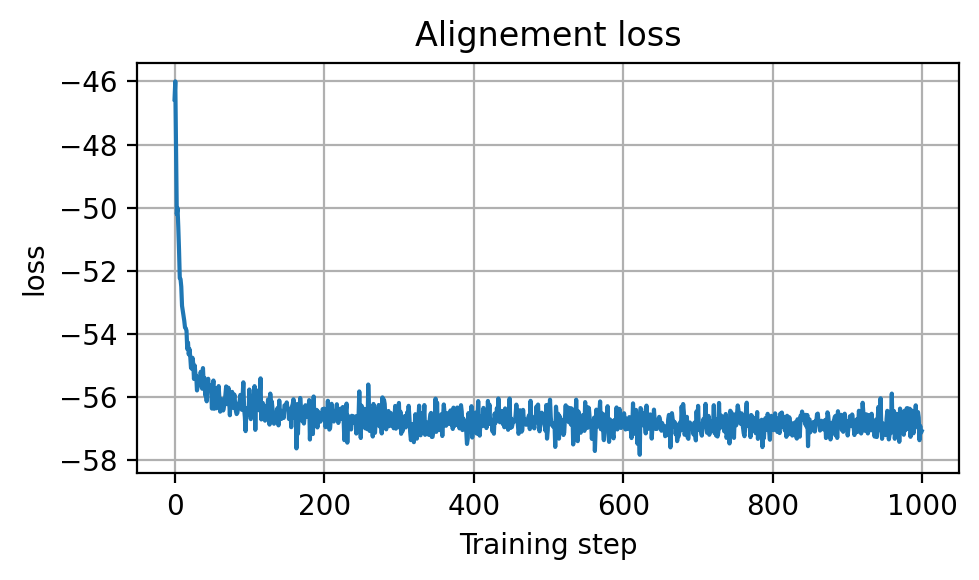

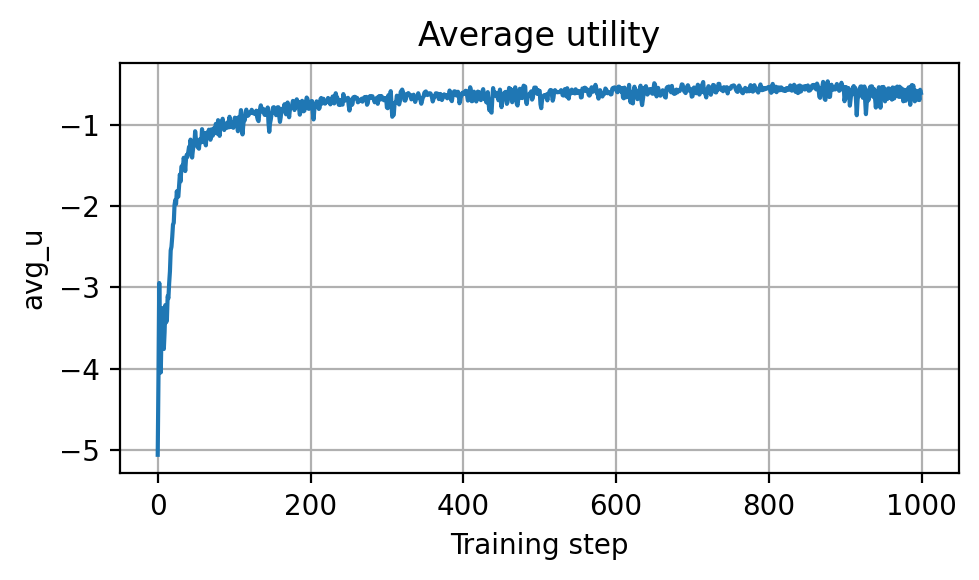

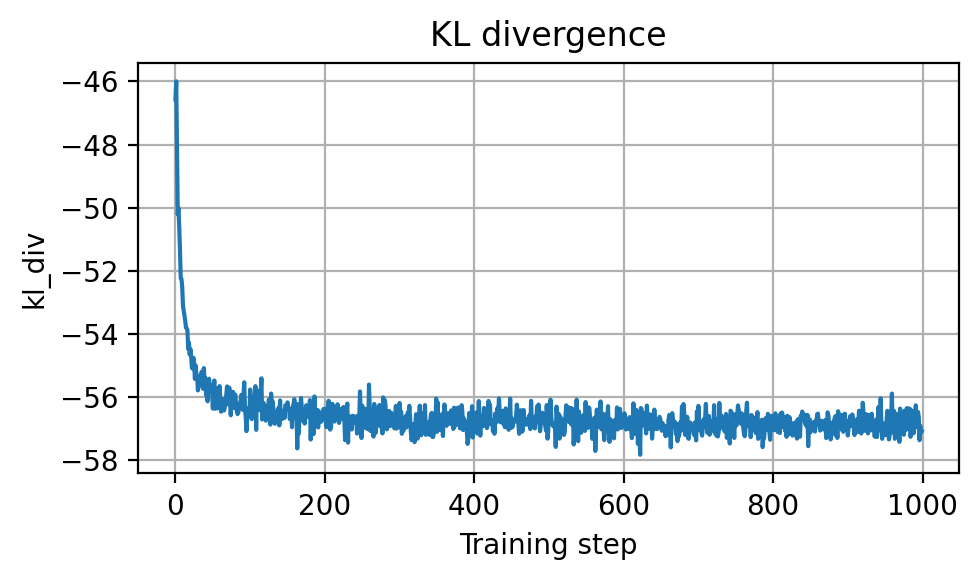

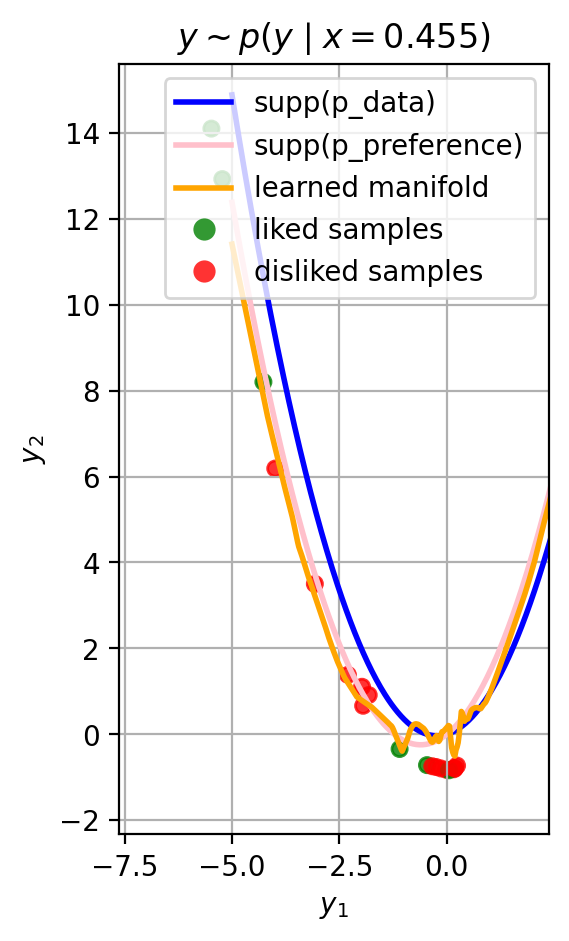

[1/4000] -ELBO = 10.255437850952148
[2/4000] -ELBO = 6.859055519104004
[3/4000] -ELBO = 6.6051716804504395
[4/4000] -ELBO = 6.251882076263428
[5/4000] -ELBO = 5.994739055633545
[6/4000] -ELBO = 5.8448920249938965
[7/4000] -ELBO = 5.674912929534912
[8/4000] -ELBO = 5.480103969573975
[9/4000] -ELBO = 5.355581283569336
[10/4000] -ELBO = 5.238393783569336
[11/4000] -ELBO = 5.153242111206055
[12/4000] -ELBO = 5.095486640930176
[13/4000] -ELBO = 5.093070030212402
[14/4000] -ELBO = 5.069418430328369
[15/4000] -ELBO = 5.013433456420898
[16/4000] -ELBO = 4.994921684265137
[17/4000] -ELBO = 4.953761577606201
[18/4000] -ELBO = 5.009154796600342
[19/4000] -ELBO = 4.915153980255127
[20/4000] -ELBO = 4.937005519866943
[21/4000] -ELBO = 4.895052909851074
[22/4000] -ELBO = 4.894521713256836
[23/4000] -ELBO = 4.85391092300415
[24/4000] -ELBO = 4.845444202423096
[25/4000] -ELBO = 4.8184661865234375
[26/4000] -ELBO = 4.817434310913086
[27/4000] -ELBO = 4.810609340667725
[28/4000] -ELBO = 4.80503368377685

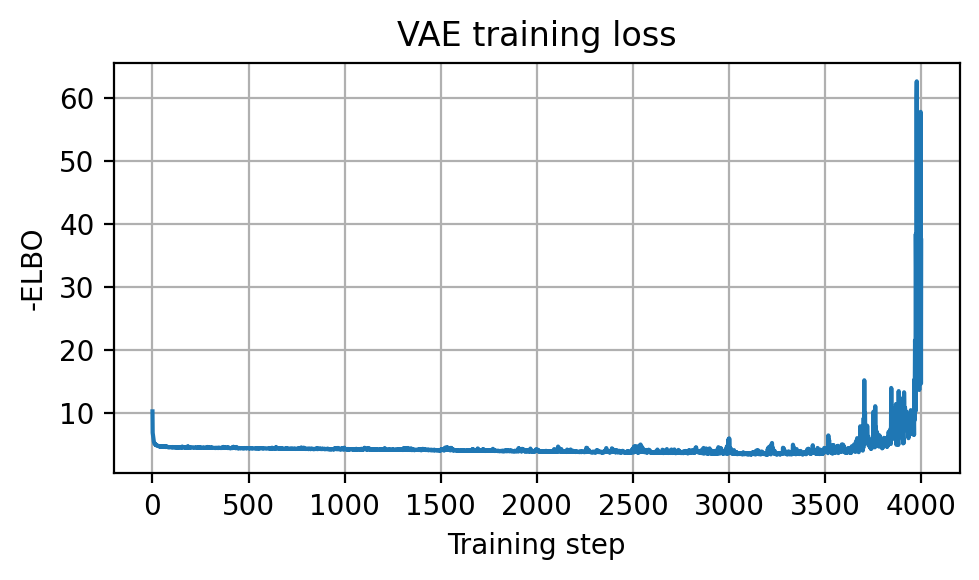

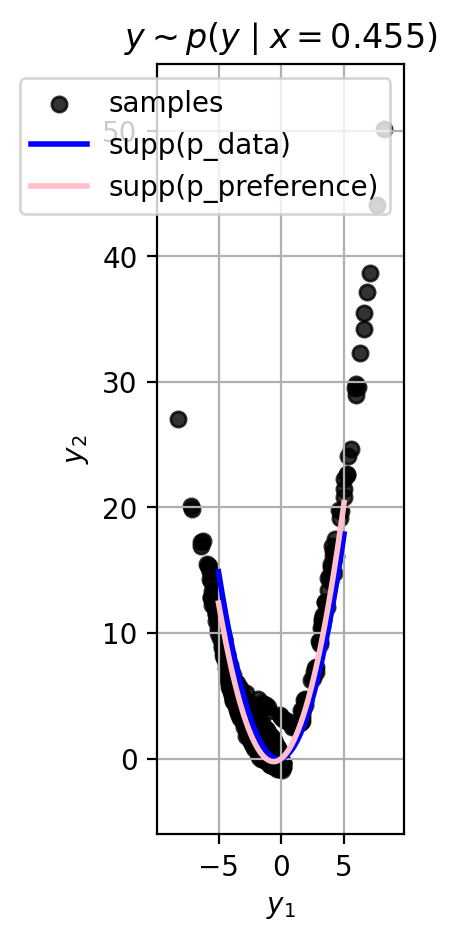

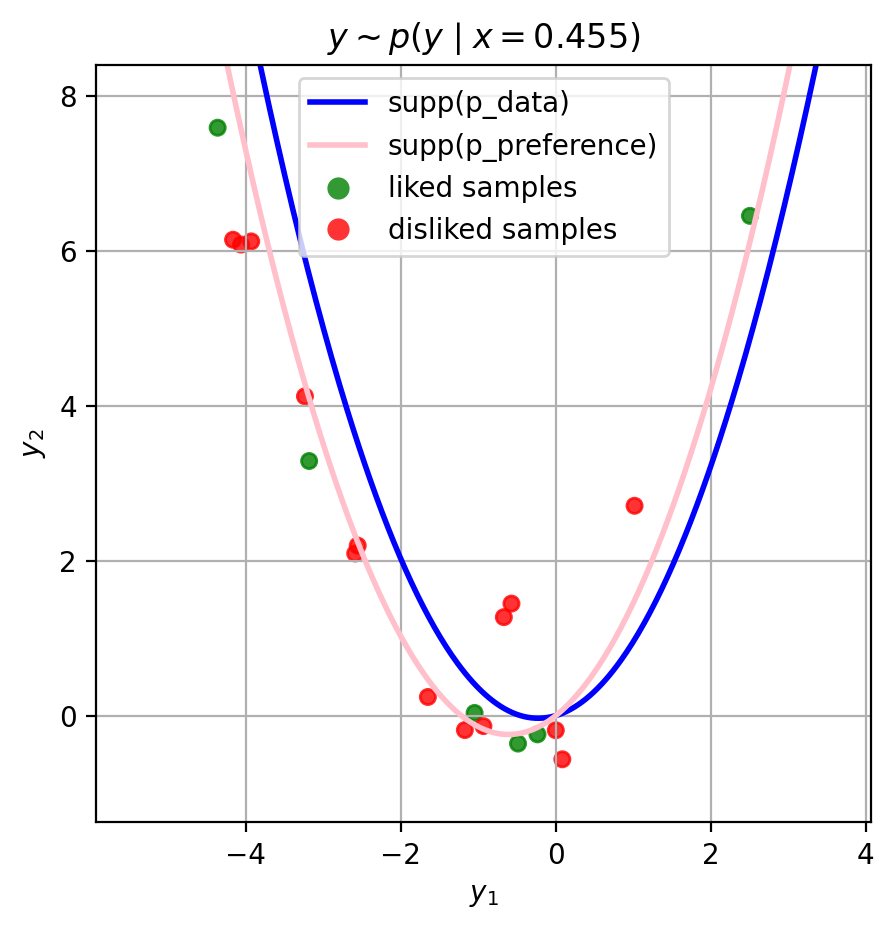

[1/2000] NLL = 0.5574
[2/2000] NLL = 1.2726
[3/2000] NLL = 0.8784
[4/2000] NLL = 0.4908
[5/2000] NLL = 0.6362
[6/2000] NLL = 0.5954
[7/2000] NLL = 0.5641
[8/2000] NLL = 0.4939
[9/2000] NLL = 0.5481
[10/2000] NLL = 0.5647
[11/2000] NLL = 0.5883
[12/2000] NLL = 0.5116
[13/2000] NLL = 0.4961
[14/2000] NLL = 0.5493
[15/2000] NLL = 0.5639
[16/2000] NLL = 0.4970
[17/2000] NLL = 0.5462
[18/2000] NLL = 0.5107
[19/2000] NLL = 0.4763
[20/2000] NLL = 0.5767
[21/2000] NLL = 0.5296
[22/2000] NLL = 0.4928
[23/2000] NLL = 0.4939
[24/2000] NLL = 0.5341
[25/2000] NLL = 0.5058
[26/2000] NLL = 0.4643
[27/2000] NLL = 0.4708
[28/2000] NLL = 0.5203
[29/2000] NLL = 0.4824
[30/2000] NLL = 0.4883
[31/2000] NLL = 0.5028
[32/2000] NLL = 0.4693
[33/2000] NLL = 0.4687
[34/2000] NLL = 0.4771
[35/2000] NLL = 0.4844
[36/2000] NLL = 0.4825
[37/2000] NLL = 0.4936
[38/2000] NLL = 0.4802
[39/2000] NLL = 0.4651
[40/2000] NLL = 0.5068
[41/2000] NLL = 0.4996
[42/2000] NLL = 0.4447
[43/2000] NLL = 0.4875
[44/2000] NLL = 0.46

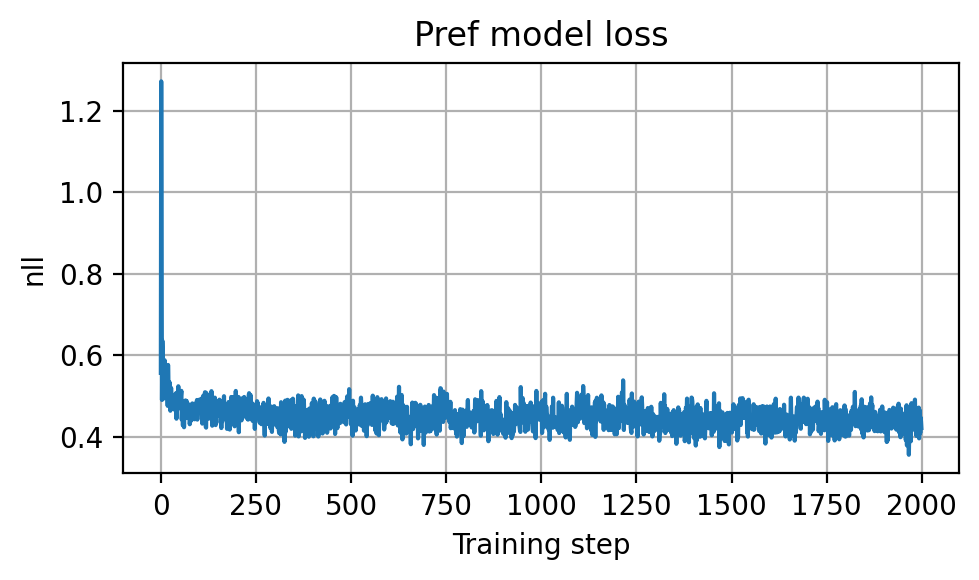

Dataset composition (likes/dislikes):   0.685920000076294 / 0.31407999992370605
ACC(learned vs GT):   0.9148799777030945 / 0.8179349899291992


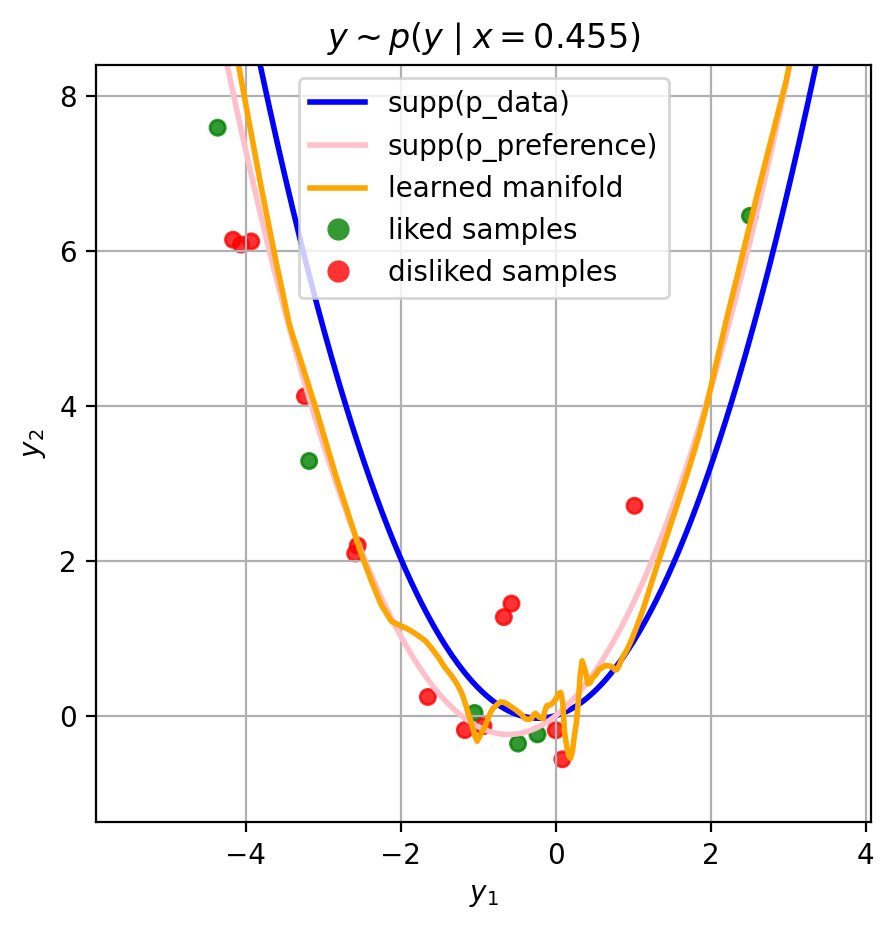

[1/1000] loss = -44.4717
[2/1000] loss = -46.1825
[3/1000] loss = -48.9723
[4/1000] loss = -49.6062
[5/1000] loss = -51.1379
[6/1000] loss = -51.6883
[7/1000] loss = -52.0266
[8/1000] loss = -52.7399
[9/1000] loss = -53.3963
[10/1000] loss = -53.6269
[11/1000] loss = -53.7088
[12/1000] loss = -53.8819
[13/1000] loss = -54.1496
[14/1000] loss = -54.3471
[15/1000] loss = -54.4812
[16/1000] loss = -54.5427
[17/1000] loss = -54.5414
[18/1000] loss = -54.9676
[19/1000] loss = -55.3094
[20/1000] loss = -54.8983
[21/1000] loss = -55.2363
[22/1000] loss = -55.1854
[23/1000] loss = -55.2581
[24/1000] loss = -55.4514
[25/1000] loss = -55.1860
[26/1000] loss = -55.5662
[27/1000] loss = -55.2492
[28/1000] loss = -55.4337
[29/1000] loss = -55.6731
[30/1000] loss = -55.7186
[31/1000] loss = -55.1744
[32/1000] loss = -55.4795
[33/1000] loss = -55.9315
[34/1000] loss = -56.2680
[35/1000] loss = -56.4070
[36/1000] loss = -55.5291
[37/1000] loss = -55.8413
[38/1000] loss = -55.5338
[39/1000] loss = -56.

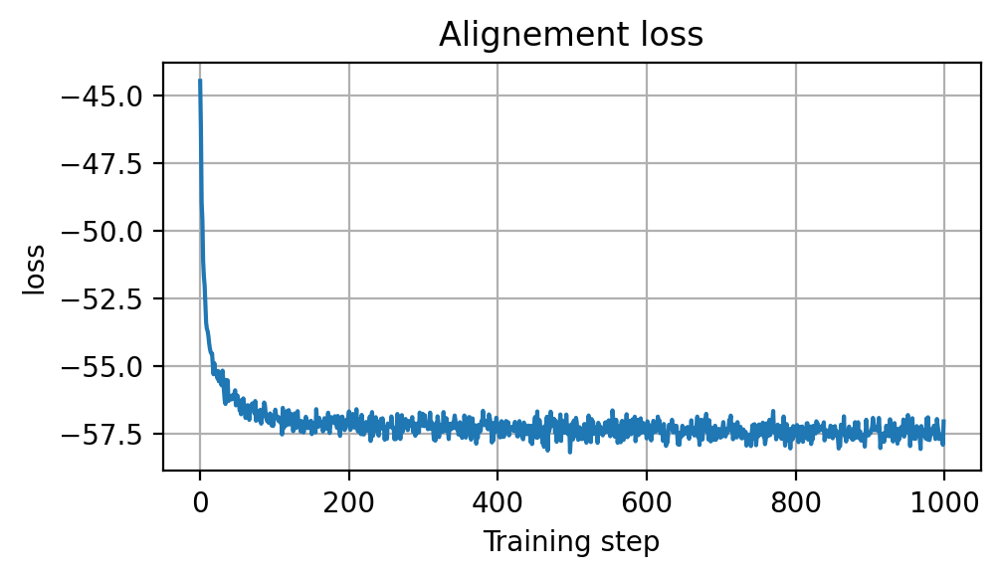

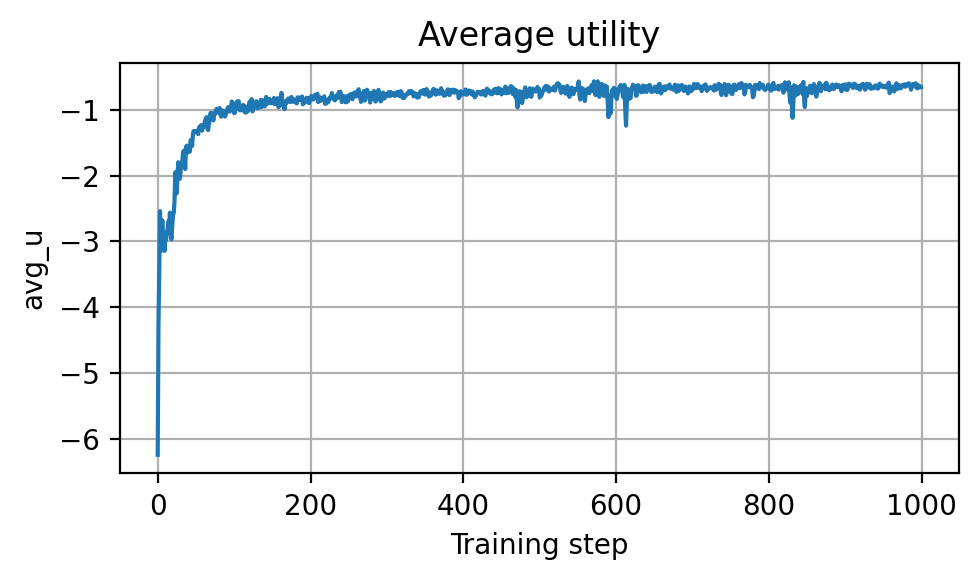

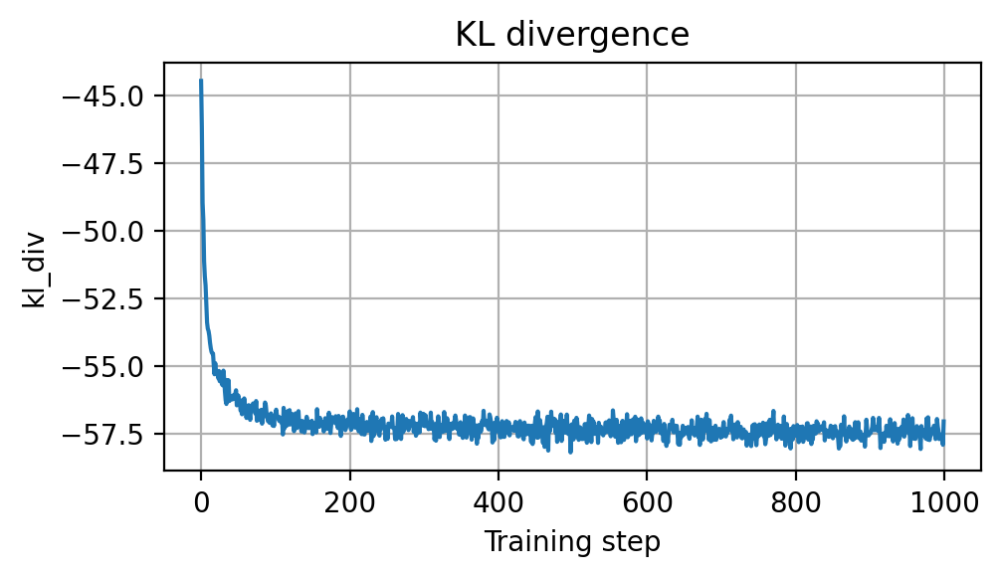

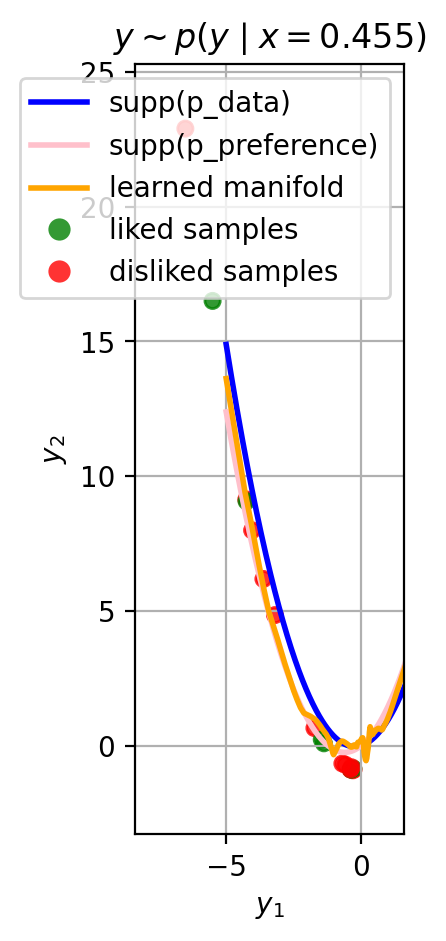

[1/4000] -ELBO = 12.61627197265625
[2/4000] -ELBO = 10.152593612670898
[3/4000] -ELBO = 9.327974319458008
[4/4000] -ELBO = 7.98579740524292
[5/4000] -ELBO = 7.710940361022949
[6/4000] -ELBO = 7.191226959228516
[7/4000] -ELBO = 6.650312900543213
[8/4000] -ELBO = 6.357790470123291
[9/4000] -ELBO = 6.228099346160889
[10/4000] -ELBO = 6.15077018737793
[11/4000] -ELBO = 5.920797824859619
[12/4000] -ELBO = 5.801177978515625
[13/4000] -ELBO = 5.603067874908447
[14/4000] -ELBO = 5.5089569091796875
[15/4000] -ELBO = 5.557135581970215
[16/4000] -ELBO = 5.436441421508789
[17/4000] -ELBO = 5.255079746246338
[18/4000] -ELBO = 5.236959934234619
[19/4000] -ELBO = 5.304234504699707
[20/4000] -ELBO = 5.2380876541137695
[21/4000] -ELBO = 5.146653175354004
[22/4000] -ELBO = 5.1660685539245605
[23/4000] -ELBO = 5.145001411437988
[24/4000] -ELBO = 5.031172752380371
[25/4000] -ELBO = 5.009459972381592
[26/4000] -ELBO = 5.055371284484863
[27/4000] -ELBO = 5.010585308074951
[28/4000] -ELBO = 4.938024997711182

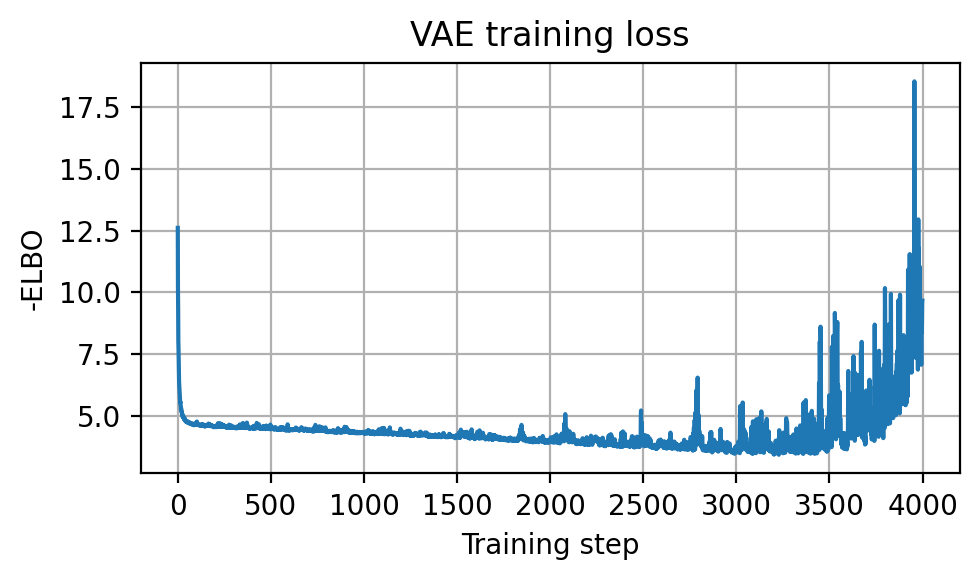

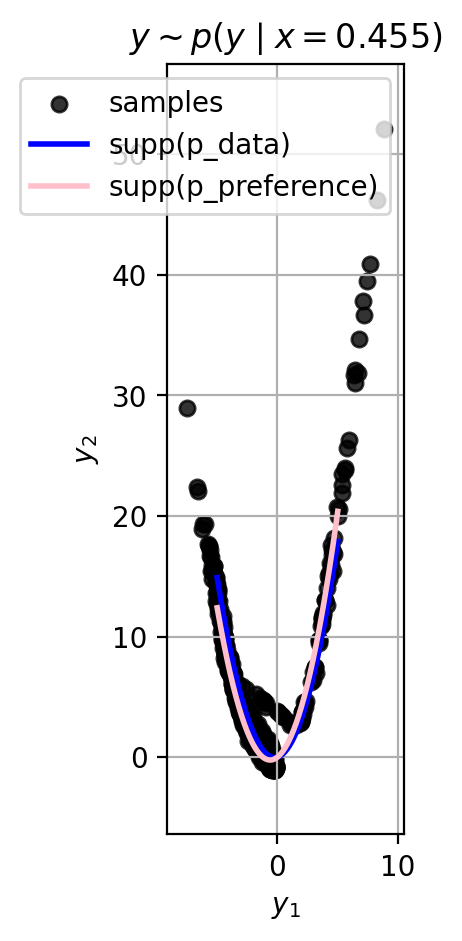

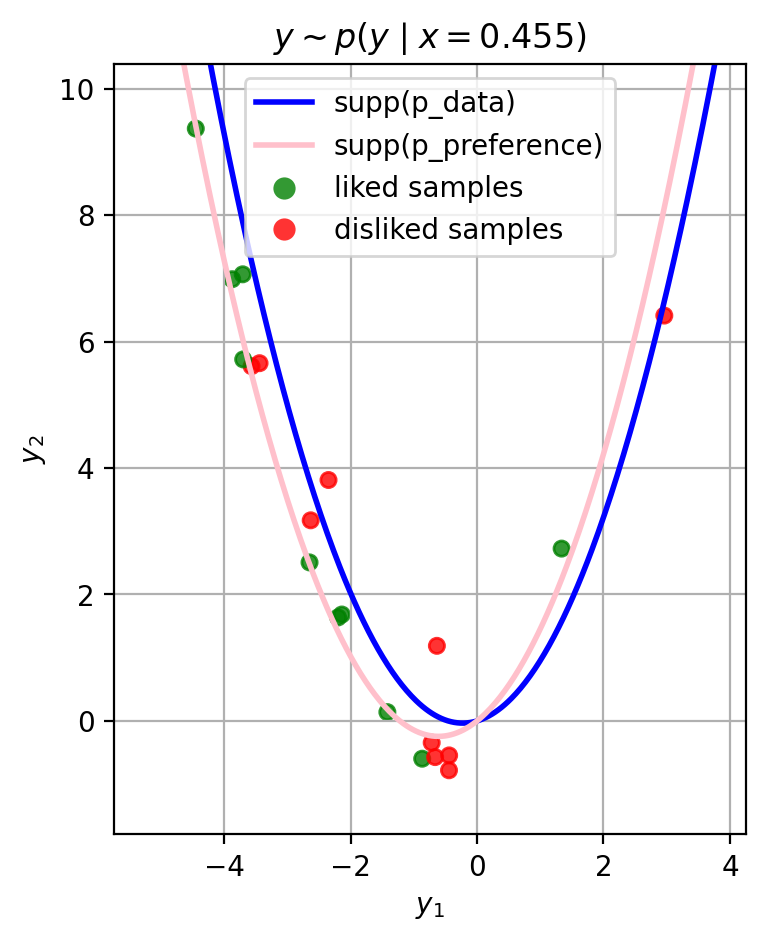

[1/2000] NLL = 0.5513
[2/2000] NLL = 0.6881
[3/2000] NLL = 0.5697
[4/2000] NLL = 0.5810
[5/2000] NLL = 0.6042
[6/2000] NLL = 0.4437
[7/2000] NLL = 0.5592
[8/2000] NLL = 0.5106
[9/2000] NLL = 0.5601
[10/2000] NLL = 0.4562
[11/2000] NLL = 0.5498
[12/2000] NLL = 0.5648
[13/2000] NLL = 0.4932
[14/2000] NLL = 0.5197
[15/2000] NLL = 0.5246
[16/2000] NLL = 0.5721
[17/2000] NLL = 0.4320
[18/2000] NLL = 0.5065
[19/2000] NLL = 0.5248
[20/2000] NLL = 0.4547
[21/2000] NLL = 0.4759
[22/2000] NLL = 0.5301
[23/2000] NLL = 0.5153
[24/2000] NLL = 0.4865
[25/2000] NLL = 0.5378
[26/2000] NLL = 0.5227
[27/2000] NLL = 0.4855
[28/2000] NLL = 0.5091
[29/2000] NLL = 0.4989
[30/2000] NLL = 0.4738
[31/2000] NLL = 0.5078
[32/2000] NLL = 0.5135
[33/2000] NLL = 0.5049
[34/2000] NLL = 0.4797
[35/2000] NLL = 0.5328
[36/2000] NLL = 0.5122
[37/2000] NLL = 0.4749
[38/2000] NLL = 0.4951
[39/2000] NLL = 0.5029
[40/2000] NLL = 0.5041
[41/2000] NLL = 0.4727
[42/2000] NLL = 0.4734
[43/2000] NLL = 0.5037
[44/2000] NLL = 0.48

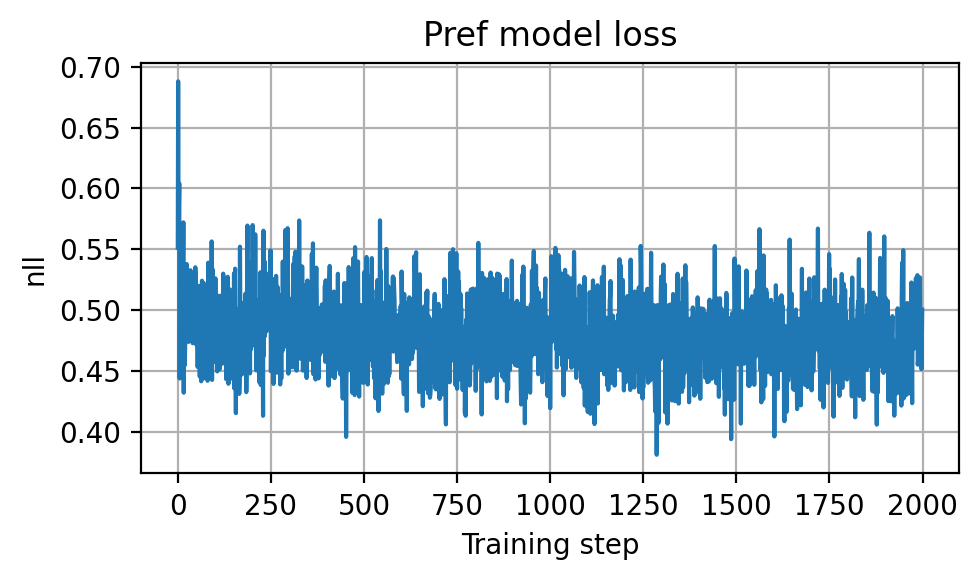

Dataset composition (likes/dislikes):   0.6700849533081055 / 0.32991504669189453
ACC(learned vs GT):   0.8111699819564819 / 0.8135150074958801


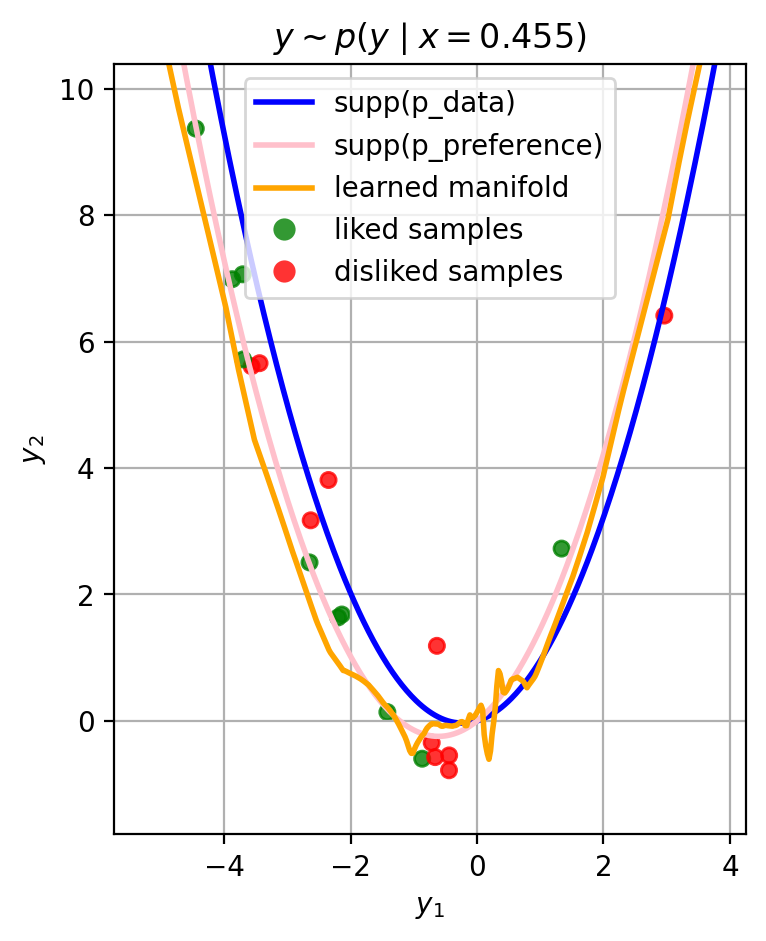

[1/1000] loss = -49.3022
[2/1000] loss = -46.5602
[3/1000] loss = -49.5677
[4/1000] loss = -50.8984
[5/1000] loss = -51.4594
[6/1000] loss = -52.7243
[7/1000] loss = -54.0721
[8/1000] loss = -53.8148
[9/1000] loss = -54.1124
[10/1000] loss = -54.7100
[11/1000] loss = -55.4069
[12/1000] loss = -55.2215
[13/1000] loss = -55.4003
[14/1000] loss = -55.8163
[15/1000] loss = -55.9813
[16/1000] loss = -55.9947
[17/1000] loss = -56.4044
[18/1000] loss = -56.9829
[19/1000] loss = -56.4150
[20/1000] loss = -57.1759
[21/1000] loss = -56.8845
[22/1000] loss = -56.7417
[23/1000] loss = -57.5301
[24/1000] loss = -57.1902
[25/1000] loss = -56.9077
[26/1000] loss = -57.4544
[27/1000] loss = -57.5288
[28/1000] loss = -57.7069
[29/1000] loss = -58.0289
[30/1000] loss = -57.8415
[31/1000] loss = -57.8884
[32/1000] loss = -57.7020
[33/1000] loss = -58.1626
[34/1000] loss = -57.9423
[35/1000] loss = -57.8535
[36/1000] loss = -57.8729
[37/1000] loss = -57.9062
[38/1000] loss = -58.2908
[39/1000] loss = -57.

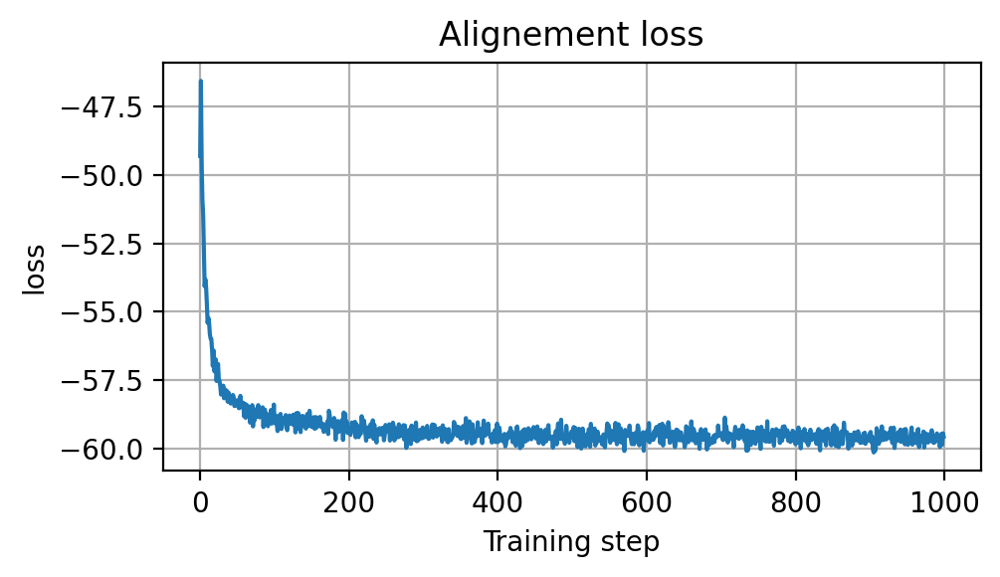

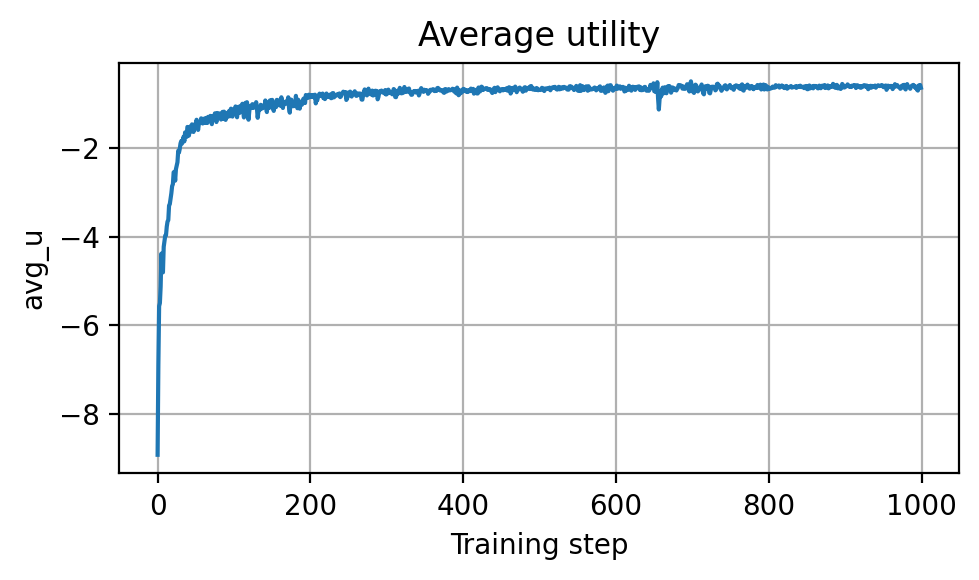

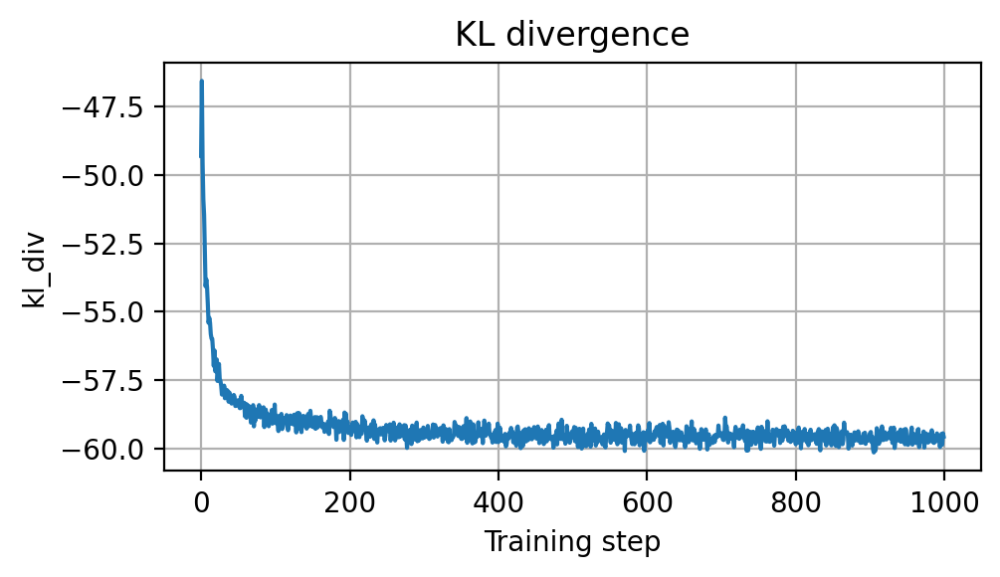

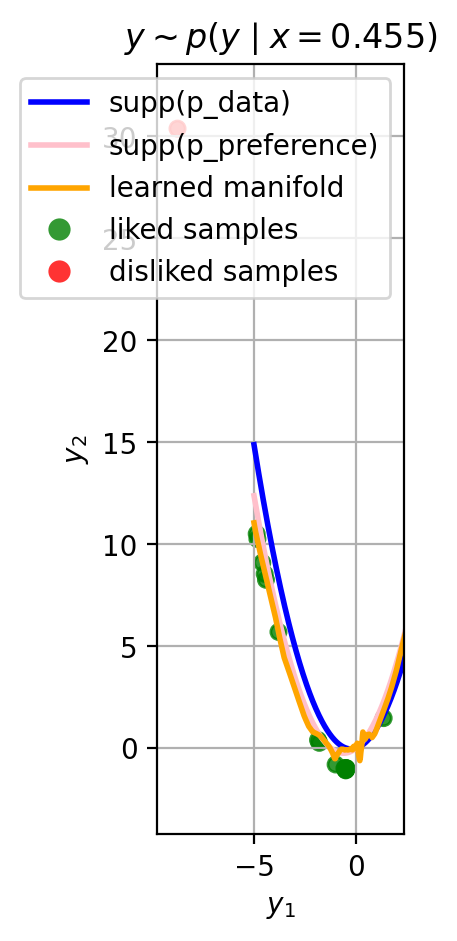

[1/4000] -ELBO = 10.225606918334961
[2/4000] -ELBO = 7.7386980056762695
[3/4000] -ELBO = 7.153275012969971
[4/4000] -ELBO = 6.773452281951904
[5/4000] -ELBO = 6.255433082580566
[6/4000] -ELBO = 6.158323764801025
[7/4000] -ELBO = 5.9717326164245605
[8/4000] -ELBO = 5.734020233154297
[9/4000] -ELBO = 5.562977313995361
[10/4000] -ELBO = 5.471904754638672
[11/4000] -ELBO = 5.367839336395264
[12/4000] -ELBO = 5.3394083976745605
[13/4000] -ELBO = 5.388810157775879
[14/4000] -ELBO = 5.378885269165039
[15/4000] -ELBO = 5.336937427520752
[16/4000] -ELBO = 5.295309066772461
[17/4000] -ELBO = 5.231795787811279
[18/4000] -ELBO = 5.147763729095459
[19/4000] -ELBO = 5.176285743713379
[20/4000] -ELBO = 5.144155502319336
[21/4000] -ELBO = 5.105618476867676
[22/4000] -ELBO = 5.07328987121582
[23/4000] -ELBO = 5.039968490600586
[24/4000] -ELBO = 5.012772560119629
[25/4000] -ELBO = 4.995348930358887
[26/4000] -ELBO = 4.992468357086182
[27/4000] -ELBO = 4.987089157104492
[28/4000] -ELBO = 4.94683647155761

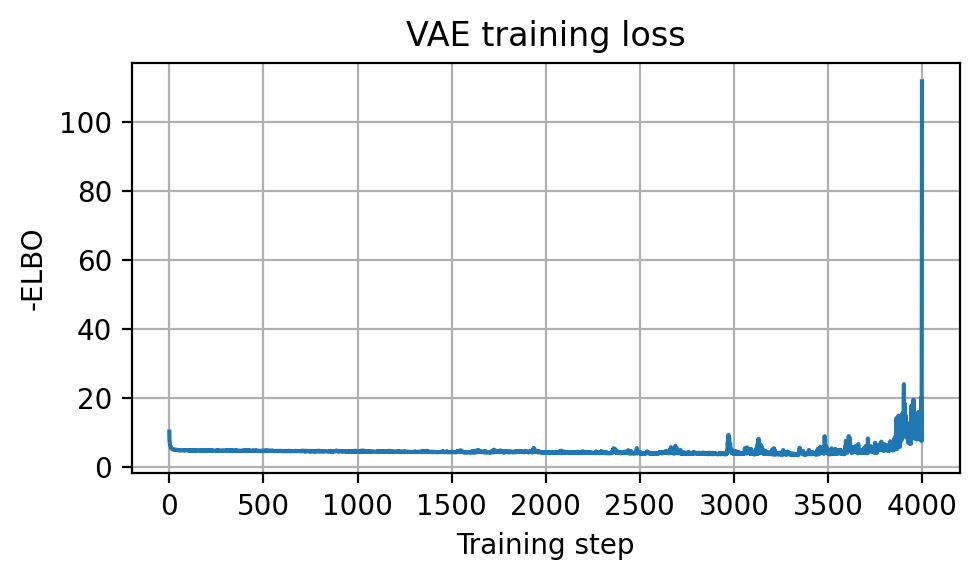

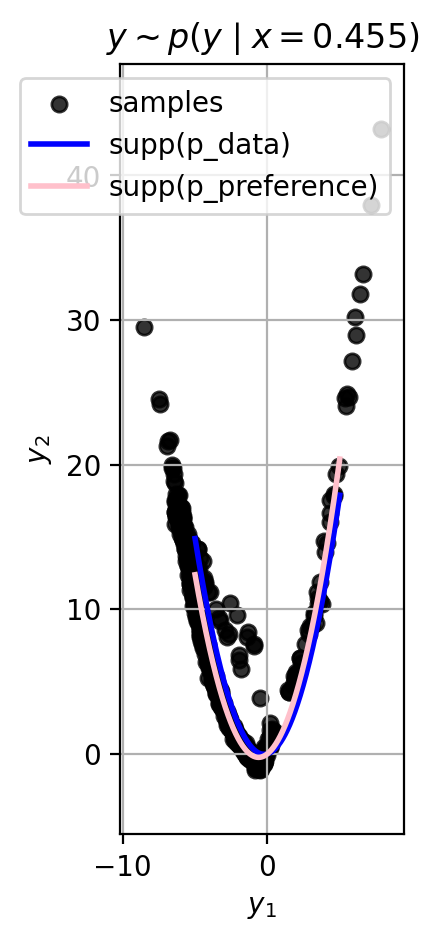

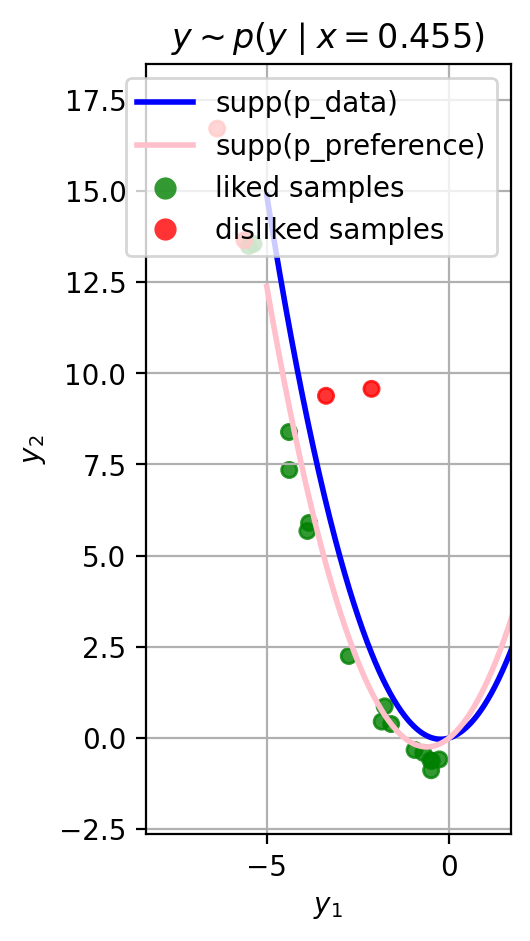

[1/2000] NLL = 0.7052
[2/2000] NLL = 1.1044
[3/2000] NLL = 1.2333
[4/2000] NLL = 0.5483
[5/2000] NLL = 0.6211
[6/2000] NLL = 0.6752
[7/2000] NLL = 0.6206
[8/2000] NLL = 0.4934
[9/2000] NLL = 0.5223
[10/2000] NLL = 0.6512
[11/2000] NLL = 0.5959
[12/2000] NLL = 0.5285
[13/2000] NLL = 0.5267
[14/2000] NLL = 0.5307
[15/2000] NLL = 0.5791
[16/2000] NLL = 0.4741
[17/2000] NLL = 0.5407
[18/2000] NLL = 0.5534
[19/2000] NLL = 0.4815
[20/2000] NLL = 0.4925
[21/2000] NLL = 0.5570
[22/2000] NLL = 0.4878
[23/2000] NLL = 0.5273
[24/2000] NLL = 0.5324
[25/2000] NLL = 0.5745
[26/2000] NLL = 0.5401
[27/2000] NLL = 0.4838
[28/2000] NLL = 0.5736
[29/2000] NLL = 0.4467
[30/2000] NLL = 0.5698
[31/2000] NLL = 0.5931
[32/2000] NLL = 0.5018
[33/2000] NLL = 0.4929
[34/2000] NLL = 0.5632
[35/2000] NLL = 0.5066
[36/2000] NLL = 0.5405
[37/2000] NLL = 0.5921
[38/2000] NLL = 0.6133
[39/2000] NLL = 0.6131
[40/2000] NLL = 0.4587
[41/2000] NLL = 0.5305
[42/2000] NLL = 0.5429
[43/2000] NLL = 0.4961
[44/2000] NLL = 0.57

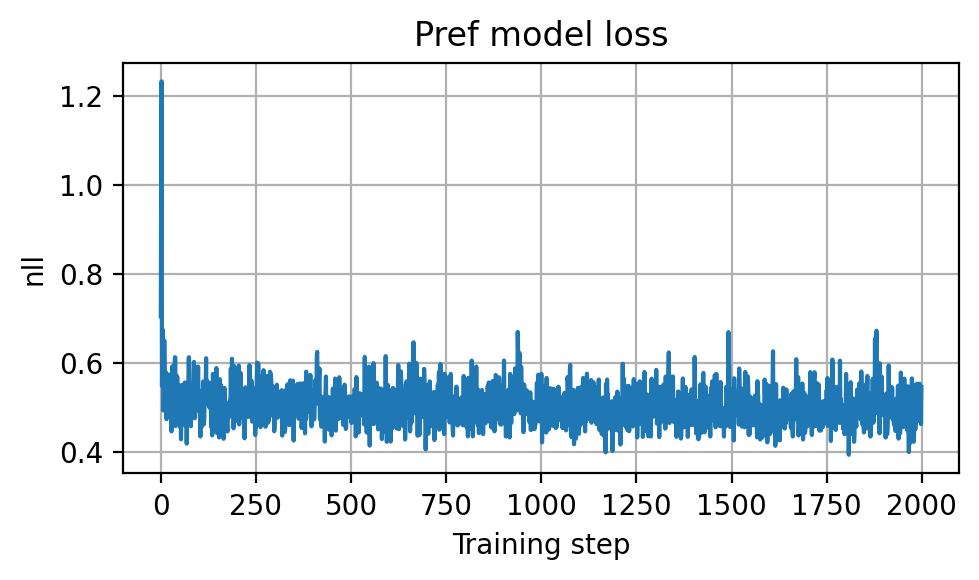

Dataset composition (likes/dislikes):   0.7003249526023865 / 0.2996750473976135
ACC(learned vs GT):   0.9229599833488464 / 0.8968549966812134


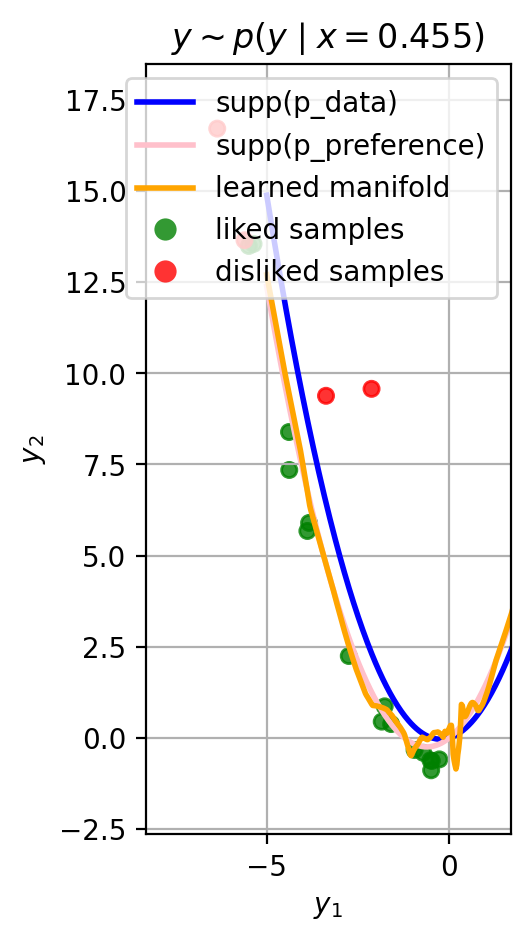

[1/1000] loss = -52.1160
[2/1000] loss = -51.4065
[3/1000] loss = -53.1017
[4/1000] loss = -56.1497
[5/1000] loss = -56.4148
[6/1000] loss = -56.5329
[7/1000] loss = -57.2748
[8/1000] loss = -57.7417
[9/1000] loss = -57.9330
[10/1000] loss = -58.3977
[11/1000] loss = -58.8377
[12/1000] loss = -58.9401
[13/1000] loss = -59.5819
[14/1000] loss = -59.8157
[15/1000] loss = -59.4767
[16/1000] loss = -59.7541
[17/1000] loss = -60.0429
[18/1000] loss = -59.9420
[19/1000] loss = -59.9382
[20/1000] loss = -60.2812
[21/1000] loss = -60.3728
[22/1000] loss = -60.3196
[23/1000] loss = -60.6355
[24/1000] loss = -60.6158
[25/1000] loss = -60.6047
[26/1000] loss = -61.0015
[27/1000] loss = -60.8365
[28/1000] loss = -60.9094
[29/1000] loss = -61.1510
[30/1000] loss = -61.2021
[31/1000] loss = -61.2113
[32/1000] loss = -61.3203
[33/1000] loss = -61.4064
[34/1000] loss = -61.3280
[35/1000] loss = -61.2532
[36/1000] loss = -61.4413
[37/1000] loss = -61.4582
[38/1000] loss = -61.5228
[39/1000] loss = -61.

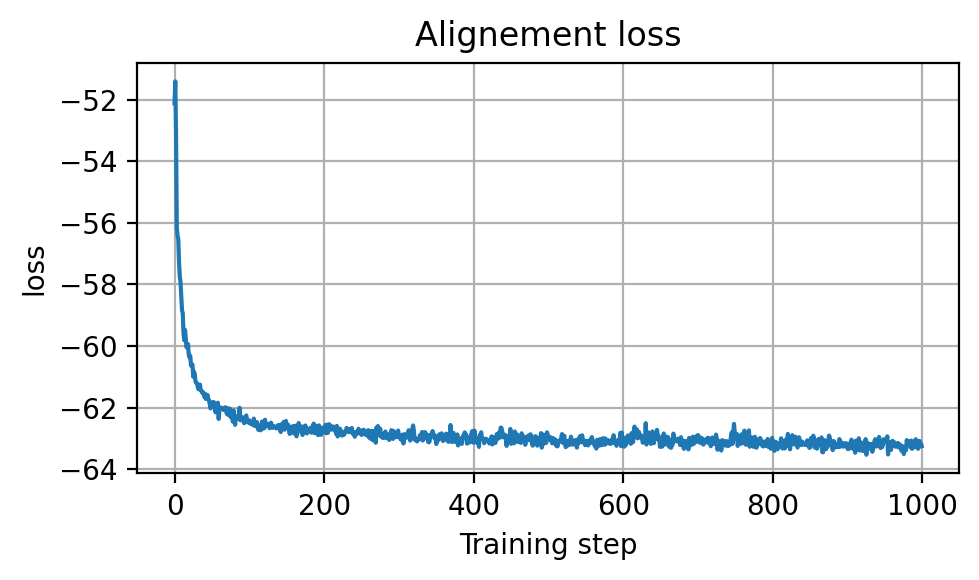

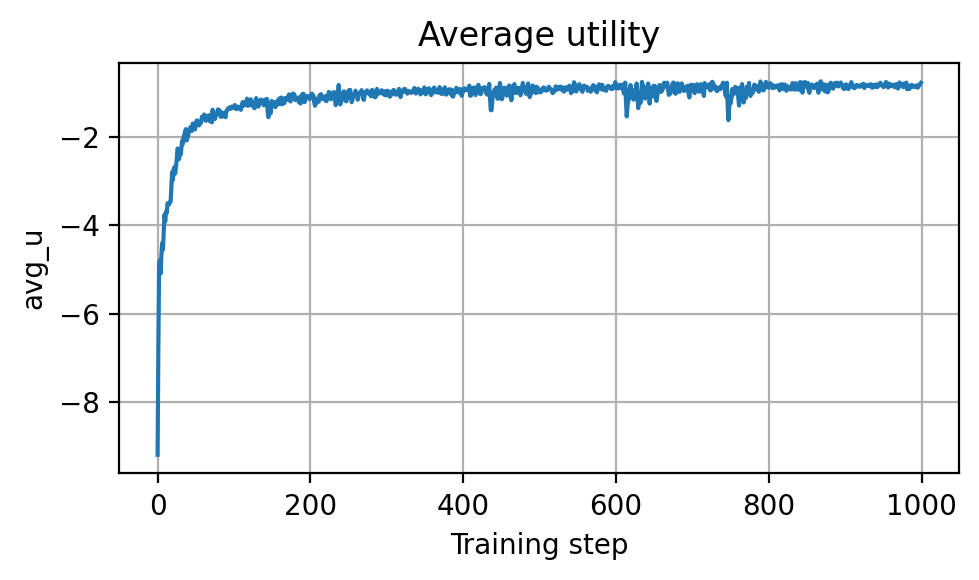

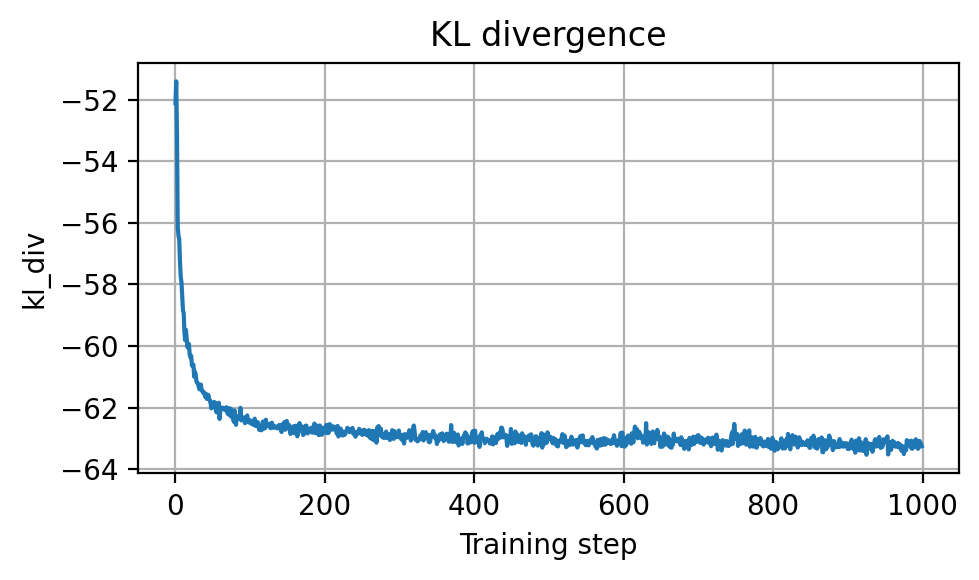

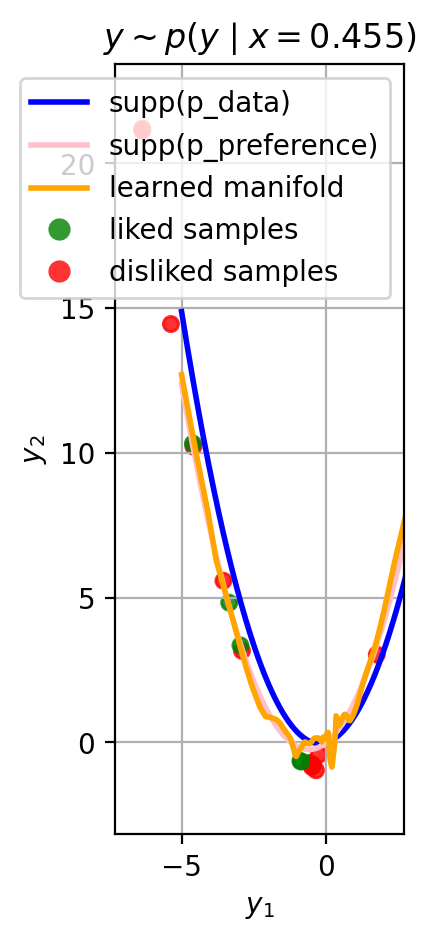

[1/4000] -ELBO = 11.218474388122559
[2/4000] -ELBO = 11.143180847167969
[3/4000] -ELBO = 9.645464897155762
[4/4000] -ELBO = 8.519828796386719
[5/4000] -ELBO = 7.2305121421813965
[6/4000] -ELBO = 6.9089250564575195
[7/4000] -ELBO = 7.269287109375
[8/4000] -ELBO = 6.992947578430176
[9/4000] -ELBO = 6.5968546867370605
[10/4000] -ELBO = 6.258706092834473
[11/4000] -ELBO = 6.036190509796143
[12/4000] -ELBO = 6.115695476531982
[13/4000] -ELBO = 6.094356060028076
[14/4000] -ELBO = 5.994320392608643
[15/4000] -ELBO = 5.727239608764648
[16/4000] -ELBO = 5.69324254989624
[17/4000] -ELBO = 5.625661373138428
[18/4000] -ELBO = 5.502389907836914
[19/4000] -ELBO = 5.493768215179443
[20/4000] -ELBO = 5.530273914337158
[21/4000] -ELBO = 5.463136672973633
[22/4000] -ELBO = 5.4469685554504395
[23/4000] -ELBO = 5.481362819671631
[24/4000] -ELBO = 5.526486873626709
[25/4000] -ELBO = 5.473264217376709
[26/4000] -ELBO = 5.276976585388184
[27/4000] -ELBO = 5.305481910705566
[28/4000] -ELBO = 5.404781341552734

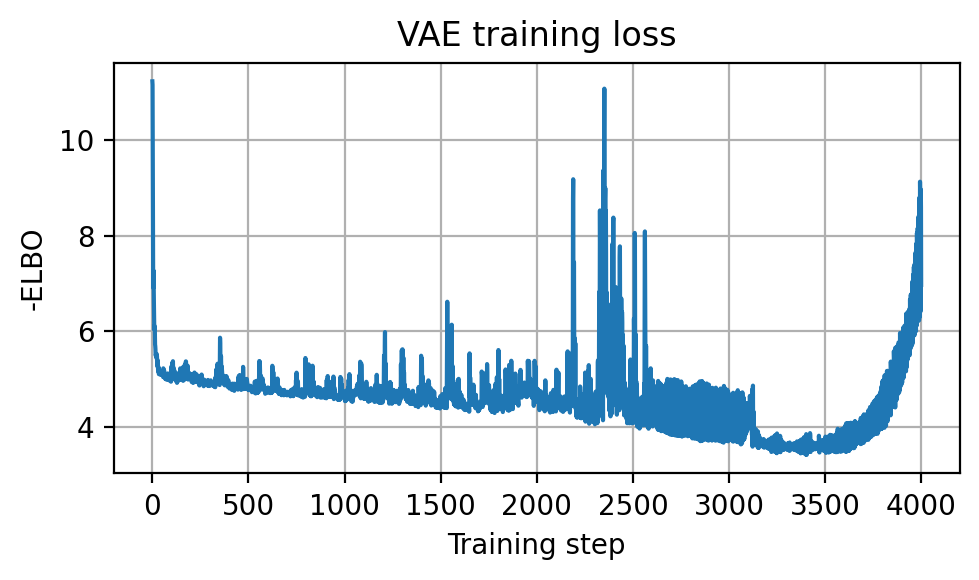

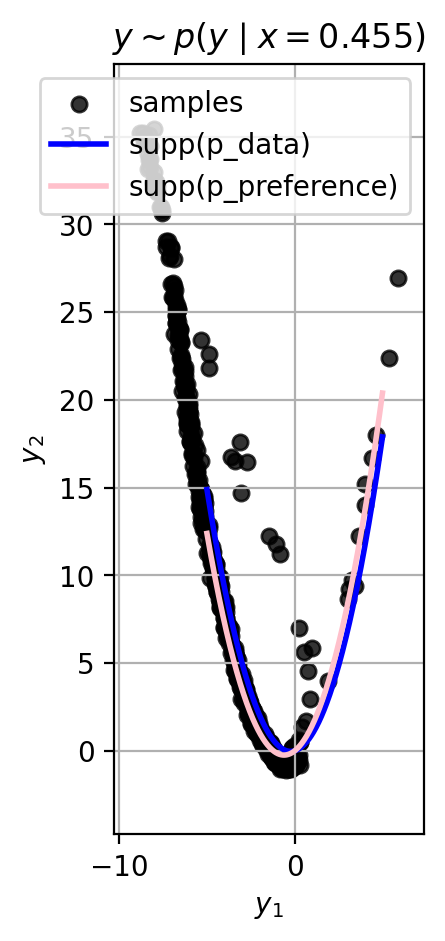

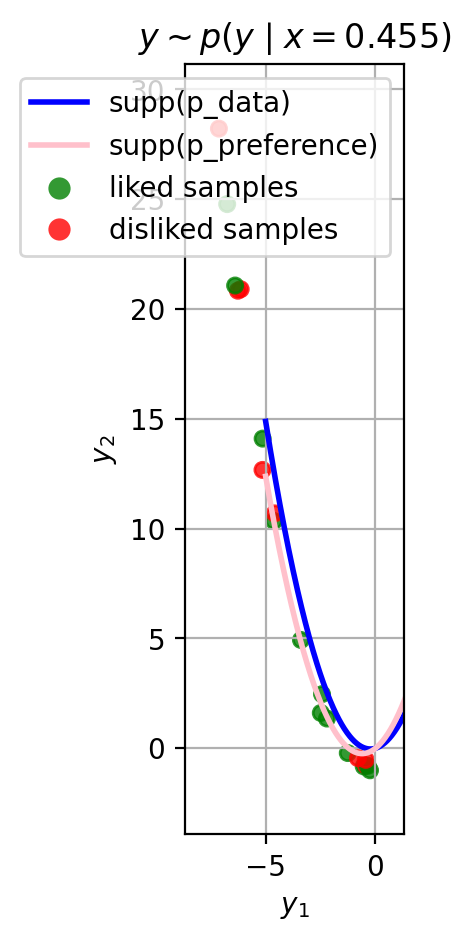

[1/2000] NLL = 0.6524
[2/2000] NLL = 1.1651
[3/2000] NLL = 0.8288
[4/2000] NLL = 0.8269
[5/2000] NLL = 0.7739
[6/2000] NLL = 0.6129
[7/2000] NLL = 0.6970
[8/2000] NLL = 0.6448
[9/2000] NLL = 0.5736
[10/2000] NLL = 0.7034
[11/2000] NLL = 0.7593
[12/2000] NLL = 0.5931
[13/2000] NLL = 0.6233
[14/2000] NLL = 0.6615
[15/2000] NLL = 0.6764
[16/2000] NLL = 0.7853
[17/2000] NLL = 0.7417
[18/2000] NLL = 0.5917
[19/2000] NLL = 0.6240
[20/2000] NLL = 0.6099
[21/2000] NLL = 0.5982
[22/2000] NLL = 0.6208
[23/2000] NLL = 0.5864
[24/2000] NLL = 0.5747
[25/2000] NLL = 0.5554
[26/2000] NLL = 0.5884
[27/2000] NLL = 0.6021
[28/2000] NLL = 0.5723
[29/2000] NLL = 0.5564
[30/2000] NLL = 0.5955
[31/2000] NLL = 0.6069
[32/2000] NLL = 0.5219
[33/2000] NLL = 0.5331
[34/2000] NLL = 0.4963
[35/2000] NLL = 0.5194
[36/2000] NLL = 0.4557
[37/2000] NLL = 0.4997
[38/2000] NLL = 0.5444
[39/2000] NLL = 0.4641
[40/2000] NLL = 0.4809
[41/2000] NLL = 0.4791
[42/2000] NLL = 0.4336
[43/2000] NLL = 0.5412
[44/2000] NLL = 0.43

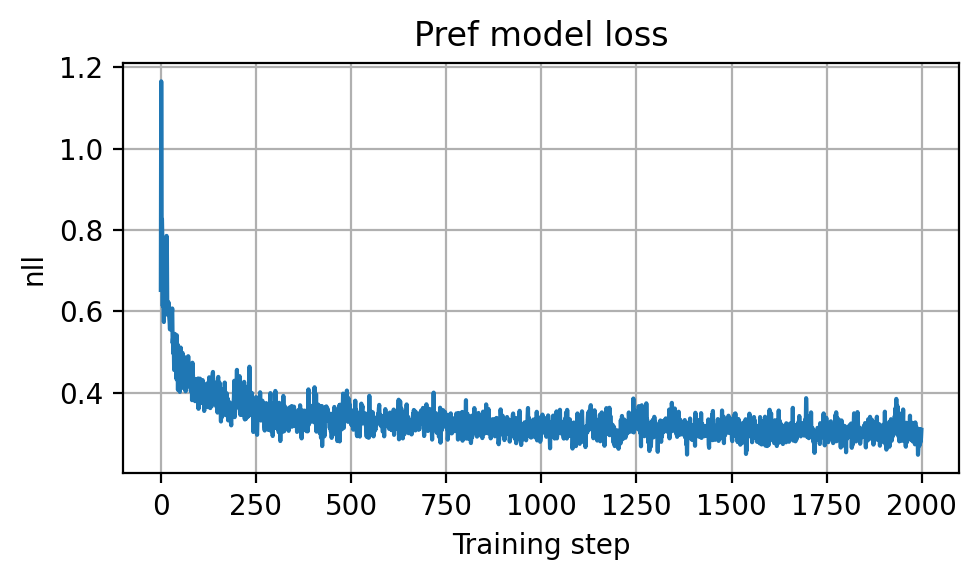

Dataset composition (likes/dislikes):   0.7088449597358704 / 0.29115504026412964
ACC(learned vs GT):   0.9662950038909912 / 0.8556249737739563


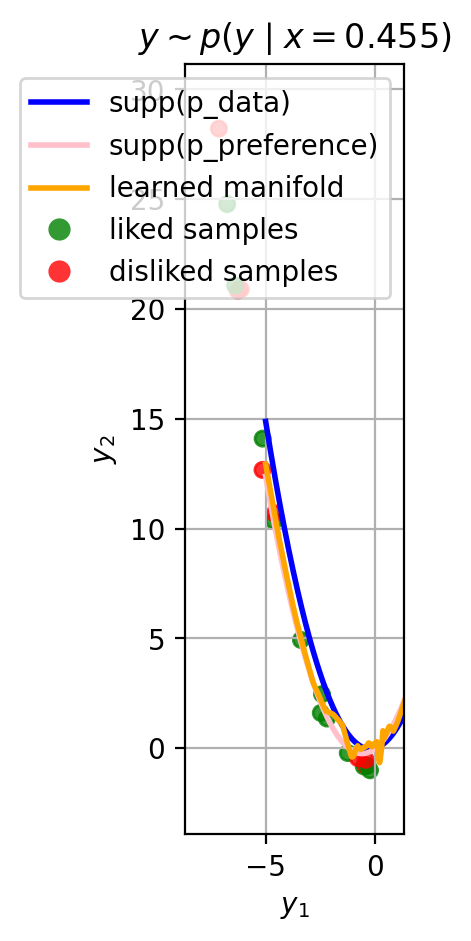

[1/1000] loss = 21.9891
[2/1000] loss = 5.6480
[3/1000] loss = -4.1833
[4/1000] loss = -9.6759
[5/1000] loss = -13.6100
[6/1000] loss = -16.6730
[7/1000] loss = -18.2964
[8/1000] loss = -22.5279
[9/1000] loss = -20.8246
[10/1000] loss = -22.9055
[11/1000] loss = -23.6518
[12/1000] loss = -25.2091
[13/1000] loss = -24.9100
[14/1000] loss = -26.3036
[15/1000] loss = -26.6393
[16/1000] loss = -28.4485
[17/1000] loss = -27.9921
[18/1000] loss = -27.9736
[19/1000] loss = -29.8311
[20/1000] loss = -29.9789
[21/1000] loss = -30.9999
[22/1000] loss = -29.8422
[23/1000] loss = -30.8063
[24/1000] loss = -30.6635
[25/1000] loss = -32.0273
[26/1000] loss = -31.7305
[27/1000] loss = -32.9795
[28/1000] loss = -33.0526
[29/1000] loss = -33.5398
[30/1000] loss = -34.1024
[31/1000] loss = -33.7613
[32/1000] loss = -34.9922
[33/1000] loss = -34.8624
[34/1000] loss = -35.2338
[35/1000] loss = -35.4288
[36/1000] loss = -34.5075
[37/1000] loss = -34.5897
[38/1000] loss = -35.3321
[39/1000] loss = -35.4129


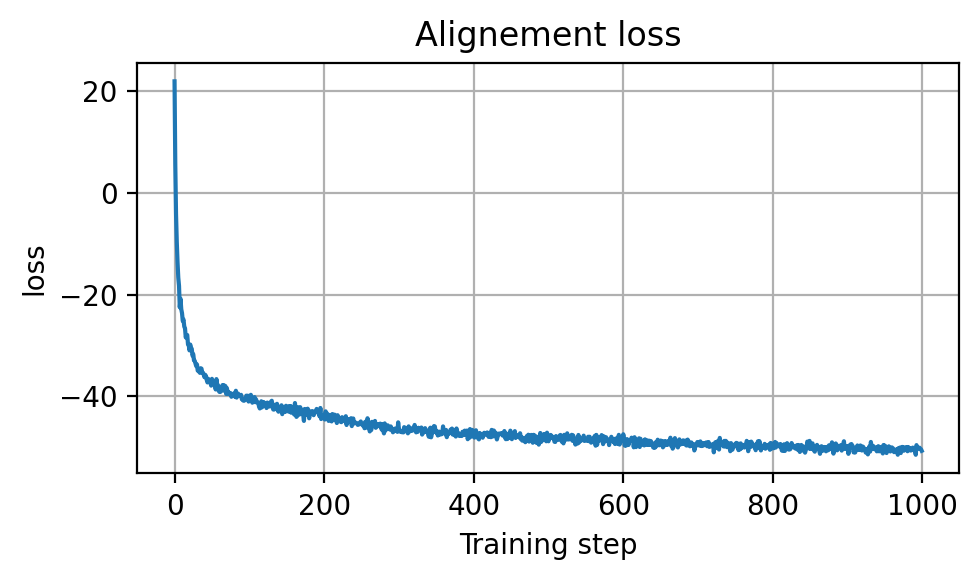

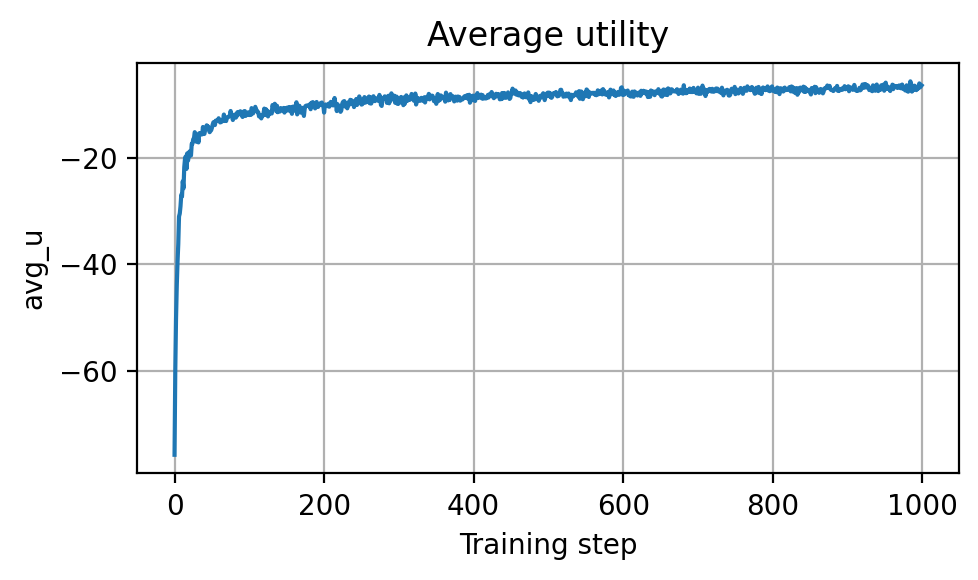

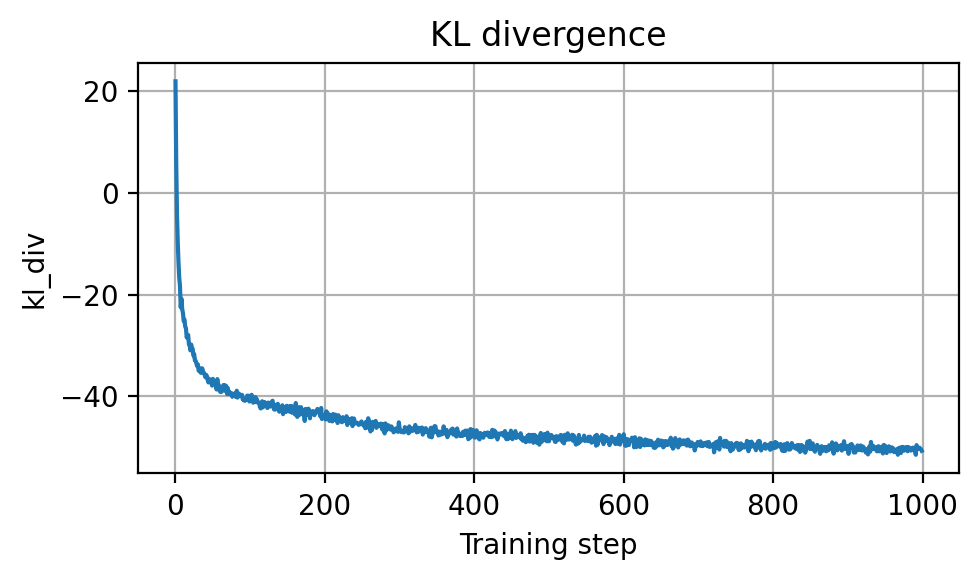

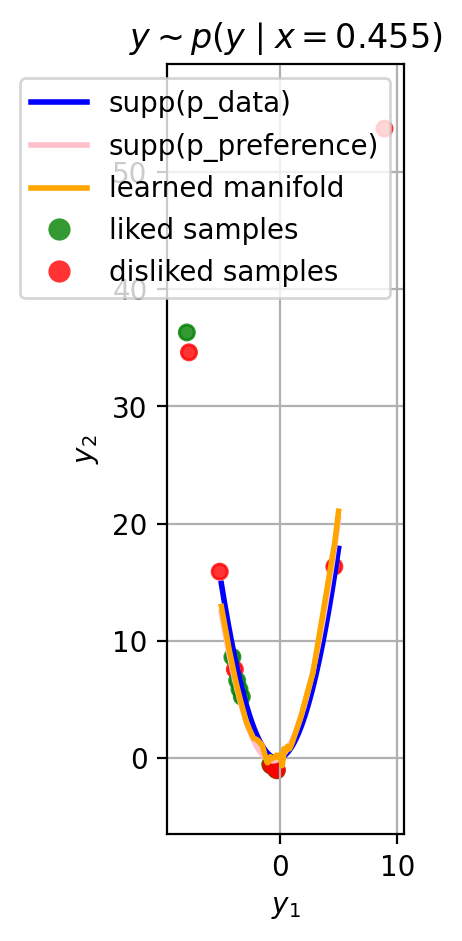

[1/4000] -ELBO = 11.270179748535156
[2/4000] -ELBO = 10.660493850708008
[3/4000] -ELBO = 9.461199760437012
[4/4000] -ELBO = 9.498544692993164
[5/4000] -ELBO = 8.866689682006836
[6/4000] -ELBO = 7.890452861785889
[7/4000] -ELBO = 7.735208988189697
[8/4000] -ELBO = 7.559217929840088
[9/4000] -ELBO = 7.374581813812256
[10/4000] -ELBO = 7.155661582946777
[11/4000] -ELBO = 6.889490604400635
[12/4000] -ELBO = 6.782004356384277
[13/4000] -ELBO = 6.857396602630615
[14/4000] -ELBO = 6.781245231628418
[15/4000] -ELBO = 6.7520599365234375
[16/4000] -ELBO = 6.600317001342773
[17/4000] -ELBO = 6.5288214683532715
[18/4000] -ELBO = 6.443267345428467
[19/4000] -ELBO = 6.348032474517822
[20/4000] -ELBO = 6.251902103424072
[21/4000] -ELBO = 6.212127208709717
[22/4000] -ELBO = 6.242199897766113
[23/4000] -ELBO = 6.225193500518799
[24/4000] -ELBO = 6.18153715133667
[25/4000] -ELBO = 6.0994086265563965
[26/4000] -ELBO = 6.008936405181885
[27/4000] -ELBO = 5.934296131134033
[28/4000] -ELBO = 5.9395503997802

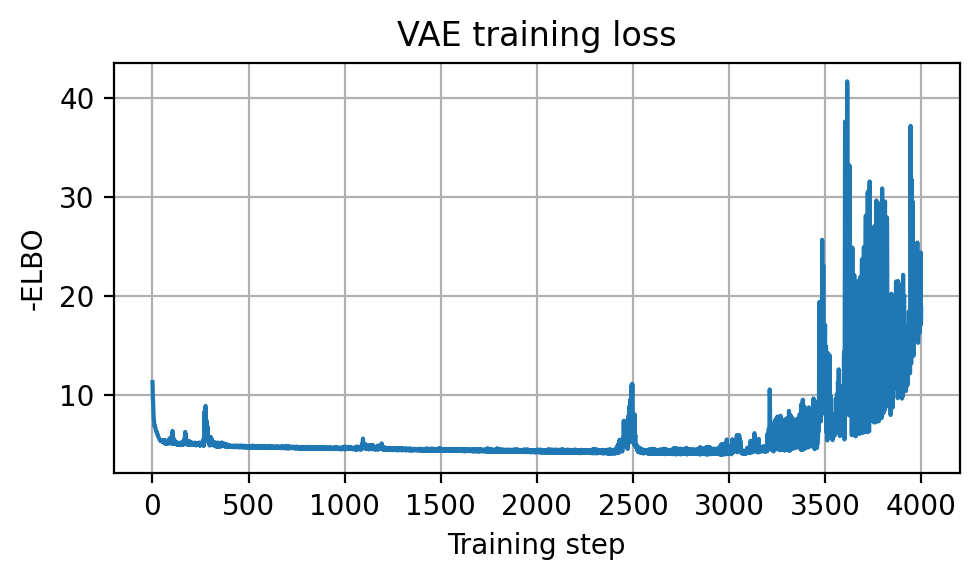

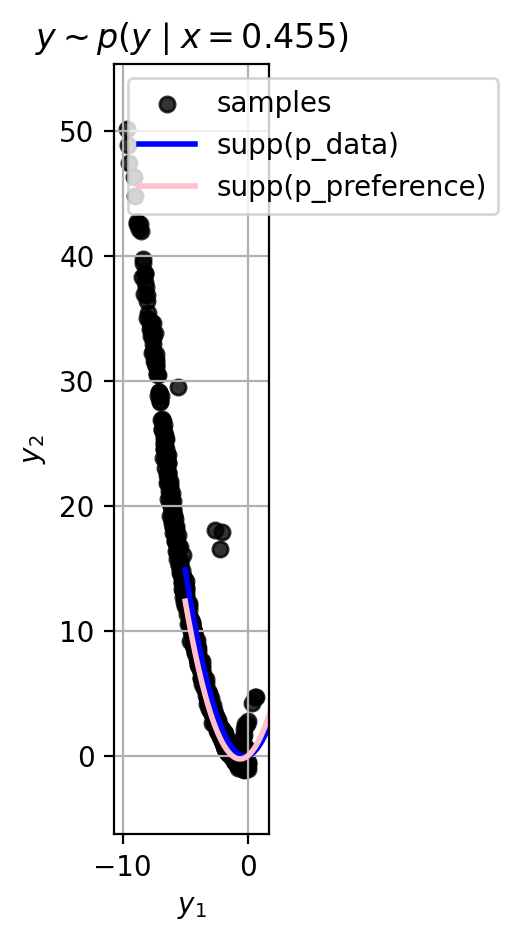

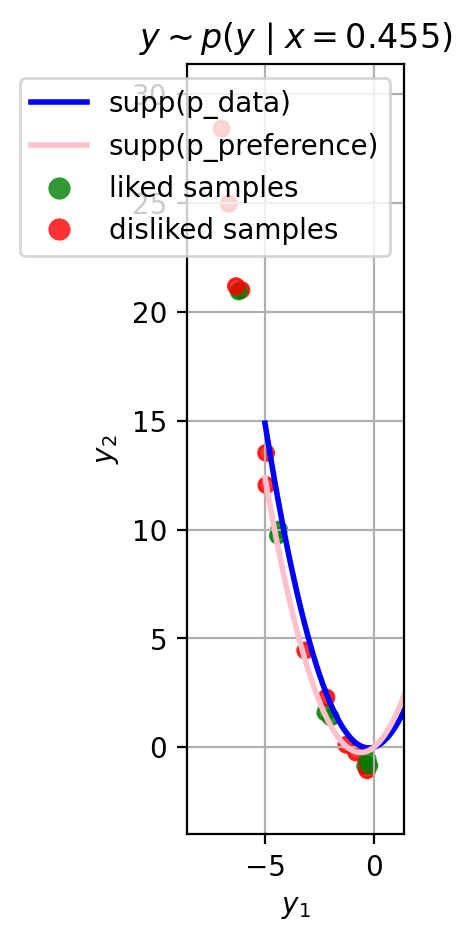

[1/2000] NLL = 0.8762
[2/2000] NLL = 1.1342
[3/2000] NLL = 0.6796
[4/2000] NLL = 0.5268
[5/2000] NLL = 0.5462
[6/2000] NLL = 0.5225
[7/2000] NLL = 0.4377
[8/2000] NLL = 0.4665
[9/2000] NLL = 0.4830
[10/2000] NLL = 0.5782
[11/2000] NLL = 0.3935
[12/2000] NLL = 0.4165
[13/2000] NLL = 0.4726
[14/2000] NLL = 0.4120
[15/2000] NLL = 0.4436
[16/2000] NLL = 0.4420
[17/2000] NLL = 0.5468
[18/2000] NLL = 0.3961
[19/2000] NLL = 0.3576
[20/2000] NLL = 0.3815
[21/2000] NLL = 0.4252
[22/2000] NLL = 0.4107
[23/2000] NLL = 0.4026
[24/2000] NLL = 0.3988
[25/2000] NLL = 0.6044
[26/2000] NLL = 0.4613
[27/2000] NLL = 0.3957
[28/2000] NLL = 0.3698
[29/2000] NLL = 0.4088
[30/2000] NLL = 0.4574
[31/2000] NLL = 0.3930
[32/2000] NLL = 0.4928
[33/2000] NLL = 0.5042
[34/2000] NLL = 0.4089
[35/2000] NLL = 0.5160
[36/2000] NLL = 0.3978
[37/2000] NLL = 0.4349
[38/2000] NLL = 0.4287
[39/2000] NLL = 0.5248
[40/2000] NLL = 0.4053
[41/2000] NLL = 0.4085
[42/2000] NLL = 0.3709
[43/2000] NLL = 0.4174
[44/2000] NLL = 0.39

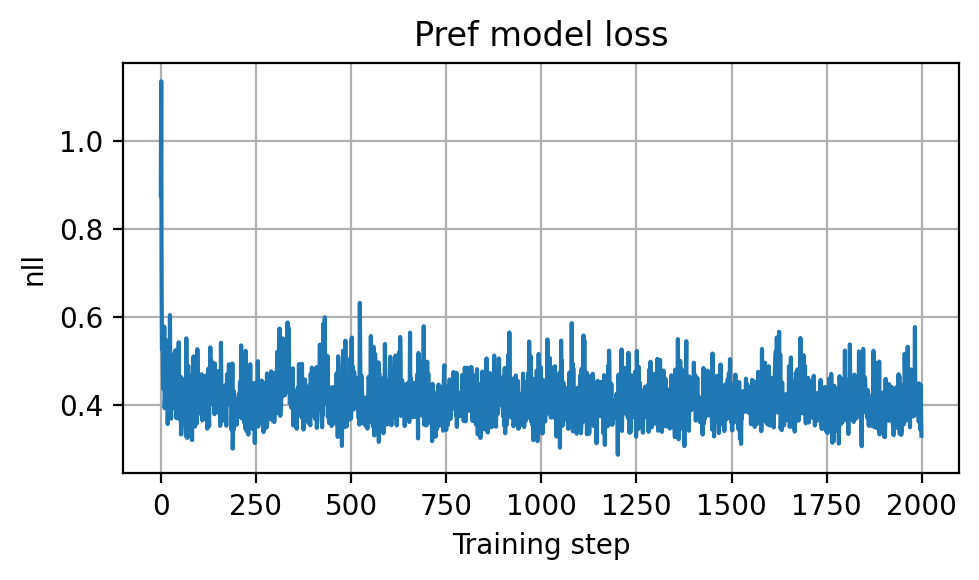

Dataset composition (likes/dislikes):   0.6744199991226196 / 0.32558000087738037
ACC(learned vs GT):   0.9147699475288391 / 0.7931749820709229


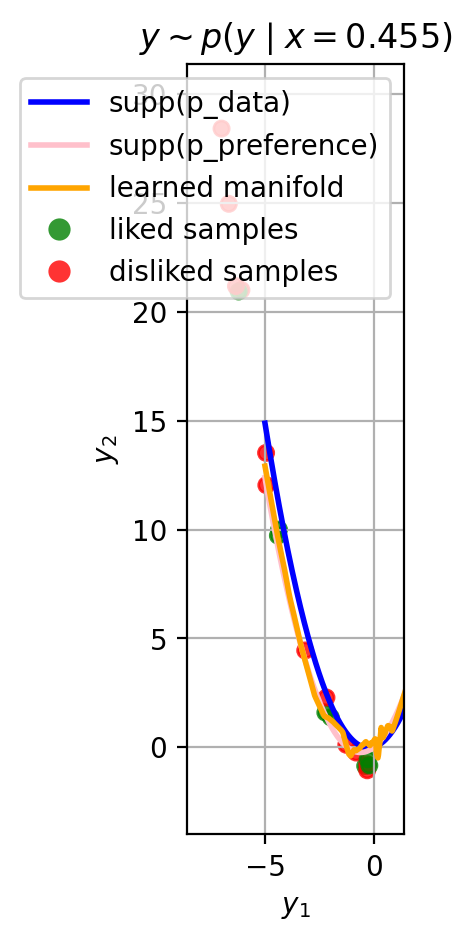

[1/1000] loss = -47.7041
[2/1000] loss = -50.8938
[3/1000] loss = -54.3147
[4/1000] loss = -54.2206
[5/1000] loss = -53.5788
[6/1000] loss = -56.0317
[7/1000] loss = -56.1478
[8/1000] loss = -56.5764
[9/1000] loss = -57.7820
[10/1000] loss = -59.7374
[11/1000] loss = -58.9268
[12/1000] loss = -58.2983
[13/1000] loss = -59.9239
[14/1000] loss = -61.1685
[15/1000] loss = -60.7719
[16/1000] loss = -60.3449
[17/1000] loss = -60.0800
[18/1000] loss = -61.5427
[19/1000] loss = -62.0667
[20/1000] loss = -62.1944
[21/1000] loss = -62.5402
[22/1000] loss = -62.6753
[23/1000] loss = -63.0136
[24/1000] loss = -62.2489
[25/1000] loss = -62.3144
[26/1000] loss = -63.0756
[27/1000] loss = -63.0560
[28/1000] loss = -62.5065
[29/1000] loss = -62.7396
[30/1000] loss = -63.6293
[31/1000] loss = -63.4496
[32/1000] loss = -63.0963
[33/1000] loss = -63.6863
[34/1000] loss = -63.9912
[35/1000] loss = -63.6298
[36/1000] loss = -63.4151
[37/1000] loss = -63.5875
[38/1000] loss = -64.4883
[39/1000] loss = -64.

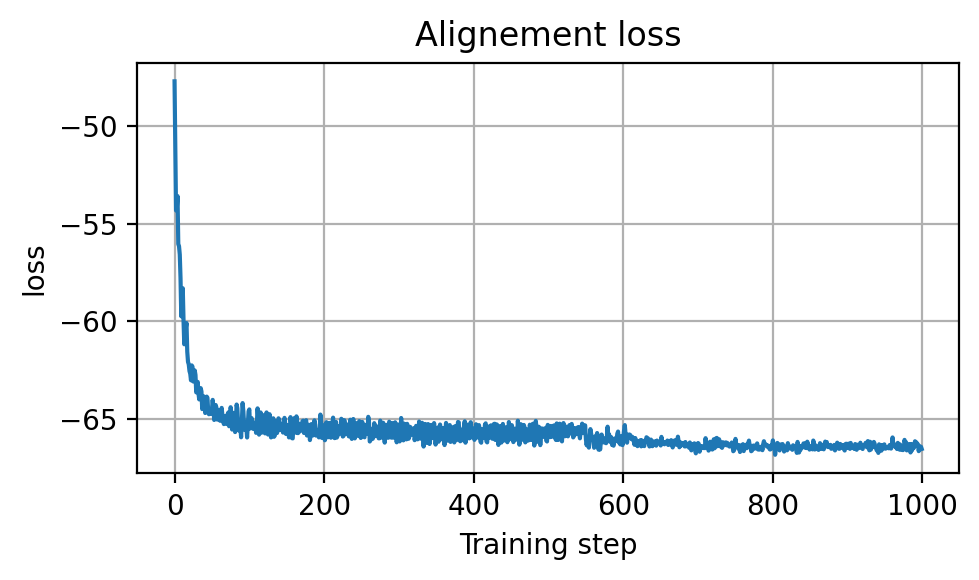

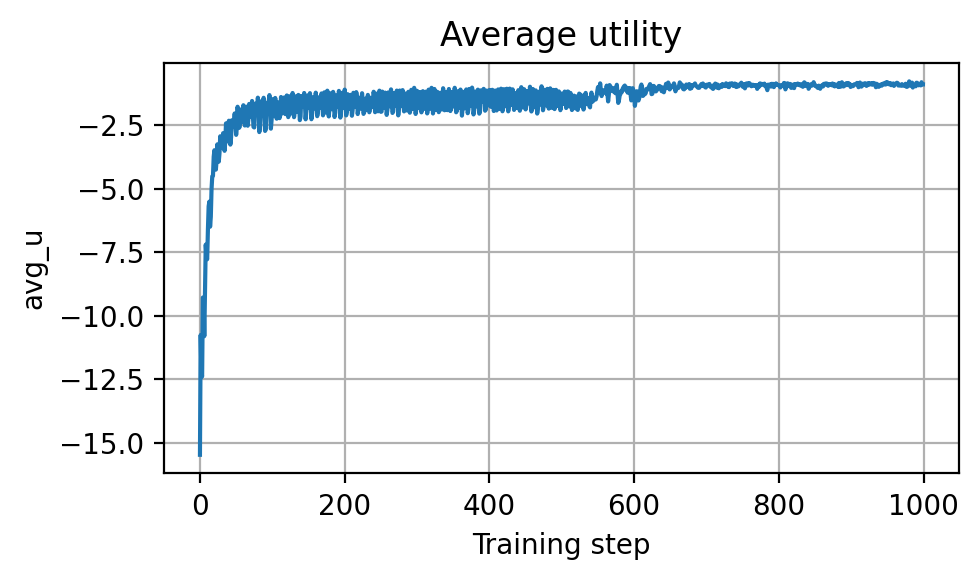

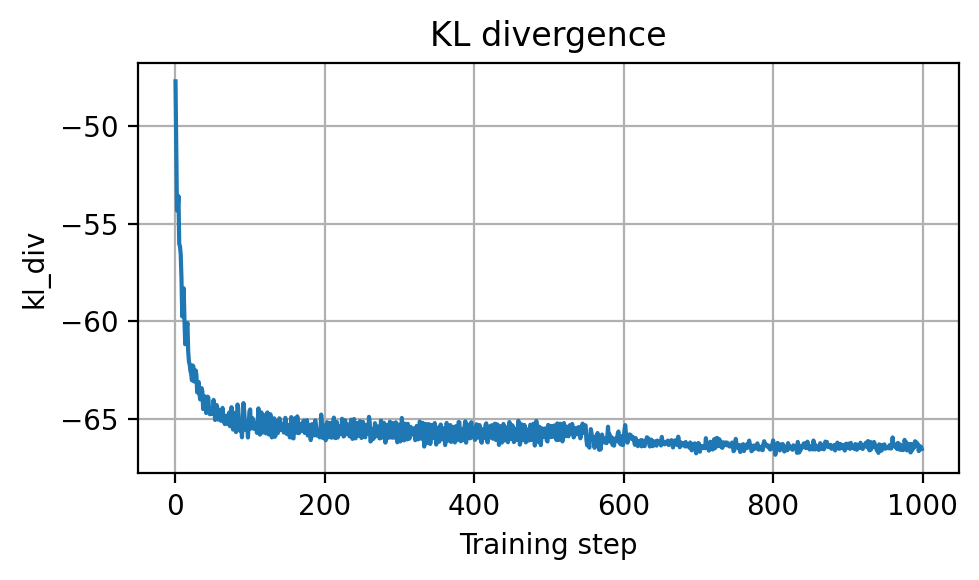

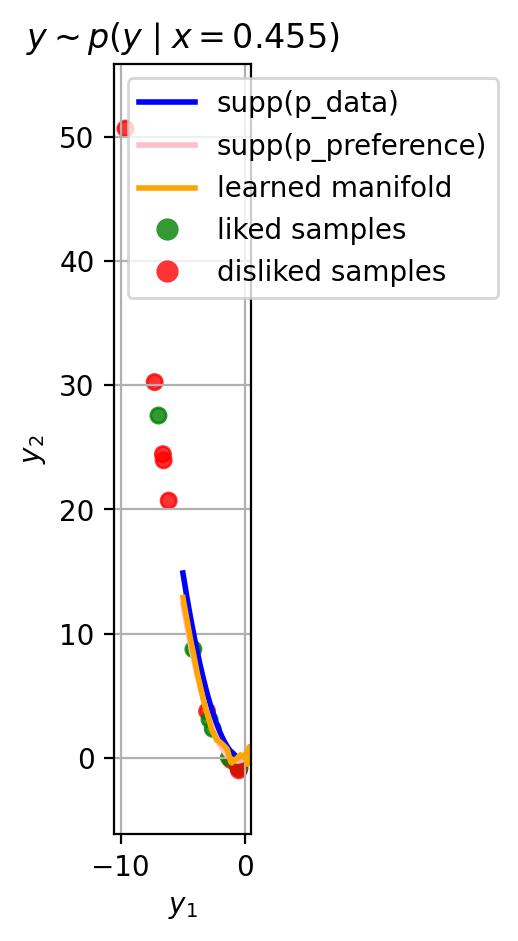

[1/4000] -ELBO = 10.10145378112793
[2/4000] -ELBO = 8.002279281616211
[3/4000] -ELBO = 7.877549648284912
[4/4000] -ELBO = 6.786481857299805
[5/4000] -ELBO = 6.913832664489746
[6/4000] -ELBO = 7.125805377960205
[7/4000] -ELBO = 6.888540267944336
[8/4000] -ELBO = 6.075591564178467
[9/4000] -ELBO = 6.05159854888916
[10/4000] -ELBO = 6.477726459503174
[11/4000] -ELBO = 6.486903190612793
[12/4000] -ELBO = 5.946367263793945
[13/4000] -ELBO = 5.557101249694824
[14/4000] -ELBO = 5.717646598815918
[15/4000] -ELBO = 5.901712894439697
[16/4000] -ELBO = 5.6394219398498535
[17/4000] -ELBO = 5.416203022003174
[18/4000] -ELBO = 5.3015031814575195
[19/4000] -ELBO = 5.313021659851074
[20/4000] -ELBO = 5.170594692230225
[21/4000] -ELBO = 5.073477268218994
[22/4000] -ELBO = 5.0818376541137695
[23/4000] -ELBO = 5.038797378540039
[24/4000] -ELBO = 5.030930995941162
[25/4000] -ELBO = 5.050530910491943
[26/4000] -ELBO = 5.106760025024414
[27/4000] -ELBO = 5.056190490722656
[28/4000] -ELBO = 5.009948253631592

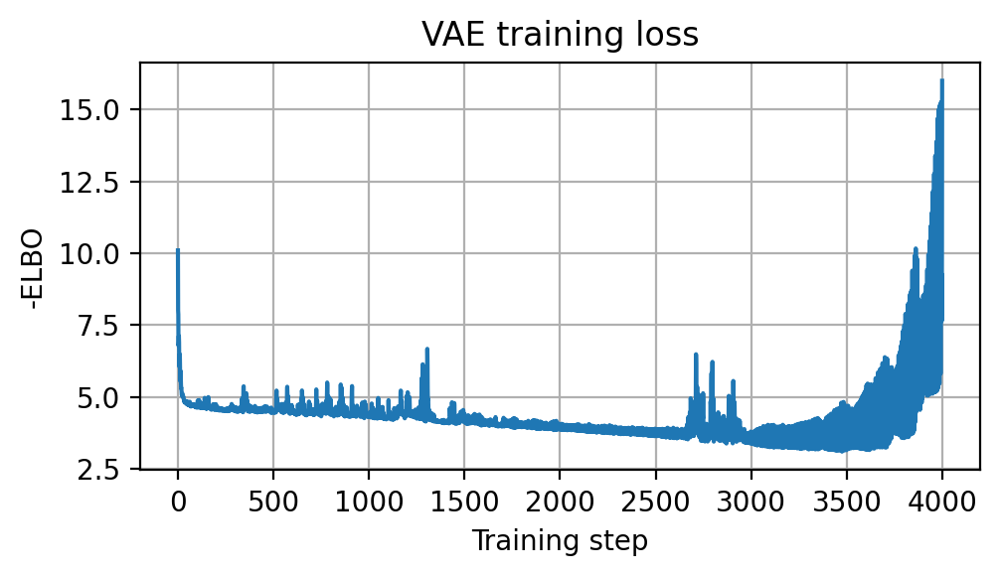

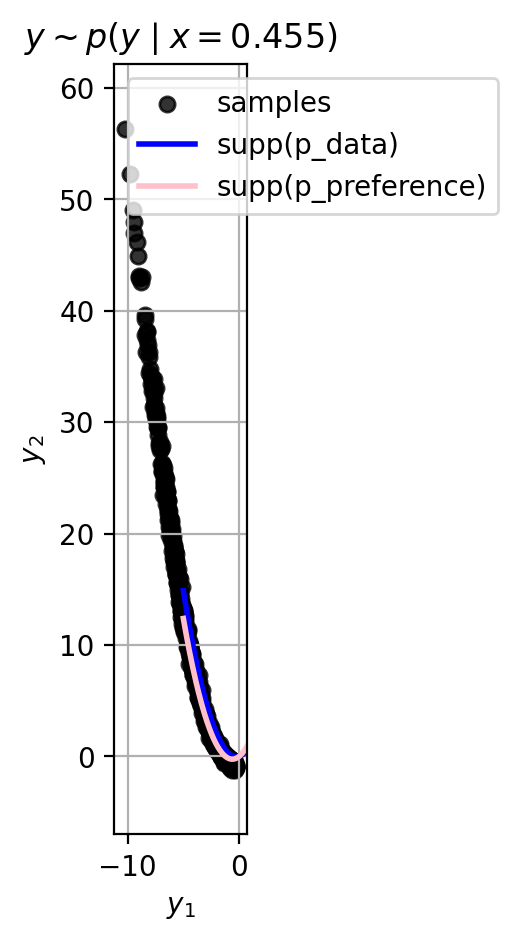

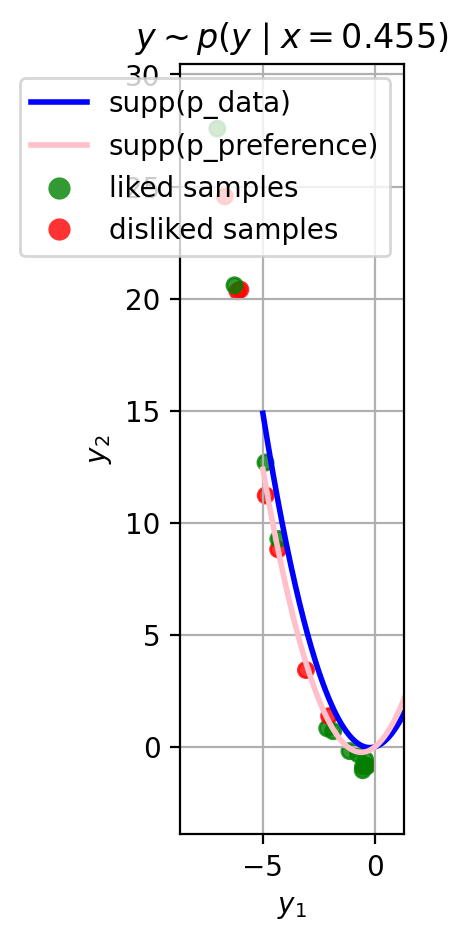

[1/2000] NLL = 0.4316
[2/2000] NLL = 0.8656
[3/2000] NLL = 0.5589
[4/2000] NLL = 0.5470
[5/2000] NLL = 0.5579
[6/2000] NLL = 0.4667
[7/2000] NLL = 0.7485
[8/2000] NLL = 0.7800
[9/2000] NLL = 0.6117
[10/2000] NLL = 0.5544
[11/2000] NLL = 0.5359
[12/2000] NLL = 0.7384
[13/2000] NLL = 0.6303
[14/2000] NLL = 0.5129
[15/2000] NLL = 0.4866
[16/2000] NLL = 0.5585
[17/2000] NLL = 0.5644
[18/2000] NLL = 0.6343
[19/2000] NLL = 0.4119
[20/2000] NLL = 0.4718
[21/2000] NLL = 0.4296
[22/2000] NLL = 0.4784
[23/2000] NLL = 0.4446
[24/2000] NLL = 0.4334
[25/2000] NLL = 0.4771
[26/2000] NLL = 0.4542
[27/2000] NLL = 0.4285
[28/2000] NLL = 0.4136
[29/2000] NLL = 0.5356
[30/2000] NLL = 0.5230
[31/2000] NLL = 0.5237
[32/2000] NLL = 0.5735
[33/2000] NLL = 0.4076
[34/2000] NLL = 0.4241
[35/2000] NLL = 0.5083
[36/2000] NLL = 0.4630
[37/2000] NLL = 0.4454
[38/2000] NLL = 0.4348
[39/2000] NLL = 0.4358
[40/2000] NLL = 0.4826
[41/2000] NLL = 0.3984
[42/2000] NLL = 0.4787
[43/2000] NLL = 0.5549
[44/2000] NLL = 0.50

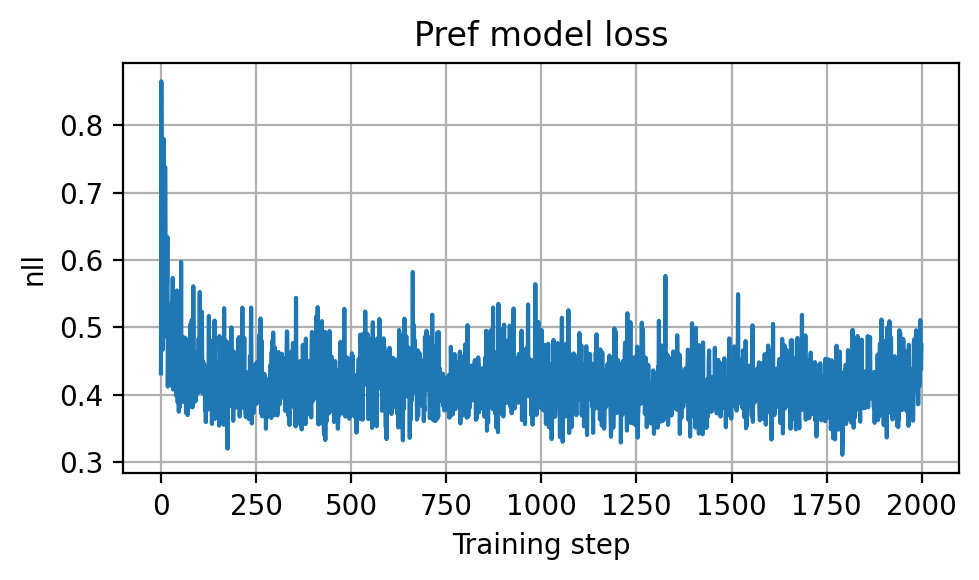

Dataset composition (likes/dislikes):   0.6545349955558777 / 0.3454650044441223
ACC(learned vs GT):   0.8927849531173706 / 0.7522299885749817


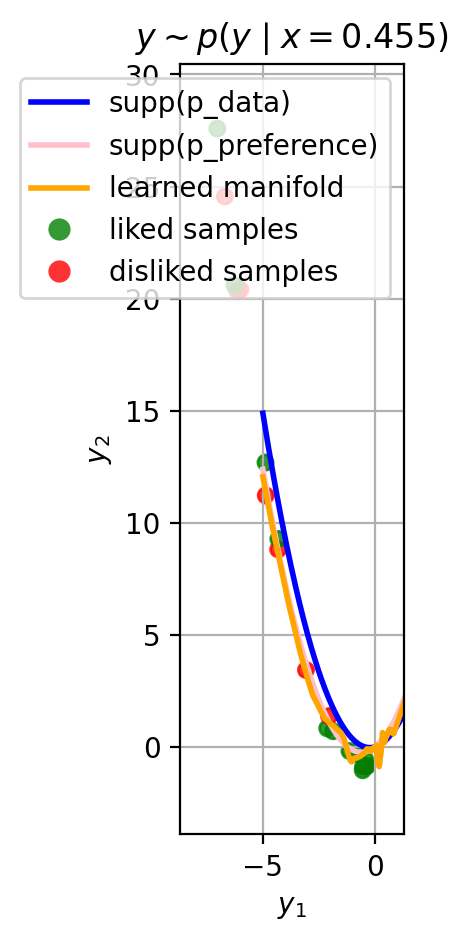

[1/1000] loss = -58.1129
[2/1000] loss = -54.6999
[3/1000] loss = -57.5096
[4/1000] loss = -62.2114
[5/1000] loss = -62.2307
[6/1000] loss = -61.1344
[7/1000] loss = -61.4338
[8/1000] loss = -63.3921
[9/1000] loss = -63.9965
[10/1000] loss = -63.6846
[11/1000] loss = -64.4655
[12/1000] loss = -65.5963
[13/1000] loss = -65.4205
[14/1000] loss = -64.9053
[15/1000] loss = -64.9176
[16/1000] loss = -65.8351
[17/1000] loss = -65.4605
[18/1000] loss = -65.4115
[19/1000] loss = -65.6782
[20/1000] loss = -66.3590
[21/1000] loss = -65.9515
[22/1000] loss = -65.5965
[23/1000] loss = -65.8278
[24/1000] loss = -66.3352
[25/1000] loss = -66.2824
[26/1000] loss = -66.0912
[27/1000] loss = -66.2068
[28/1000] loss = -66.5328
[29/1000] loss = -66.4993
[30/1000] loss = -66.0691
[31/1000] loss = -65.9994
[32/1000] loss = -66.3695
[33/1000] loss = -66.6726
[34/1000] loss = -66.3133
[35/1000] loss = -66.4981
[36/1000] loss = -66.8565
[37/1000] loss = -66.8301
[38/1000] loss = -66.6379
[39/1000] loss = -66.

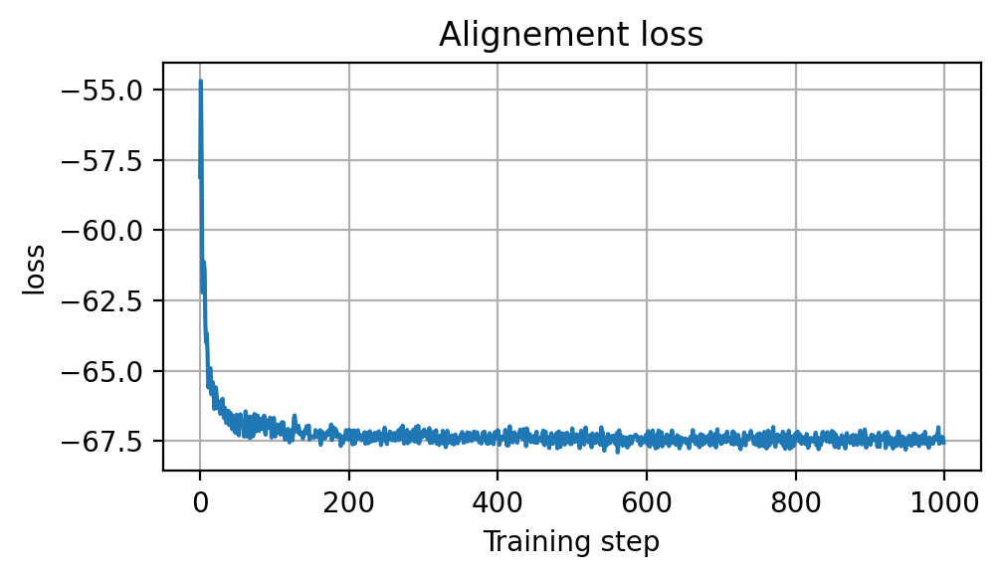

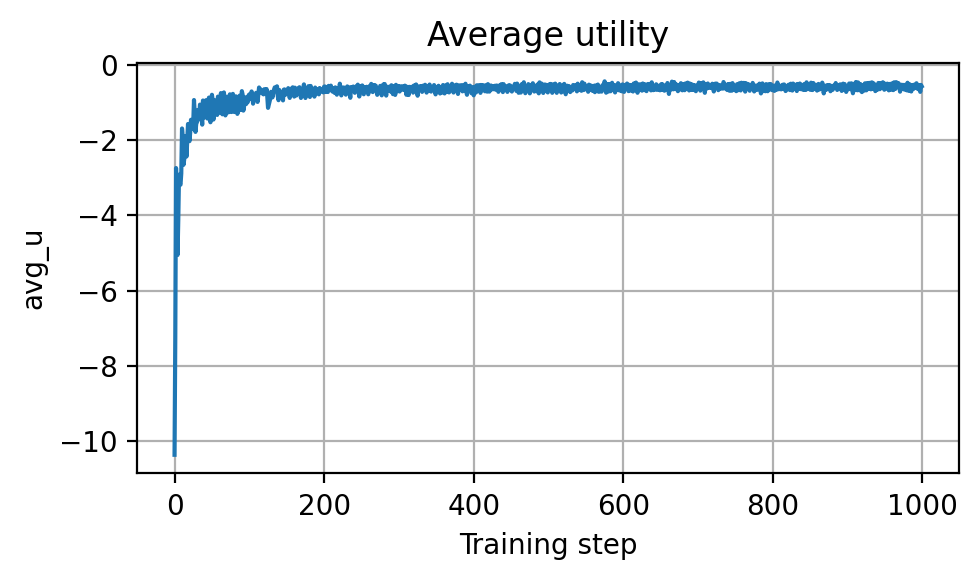

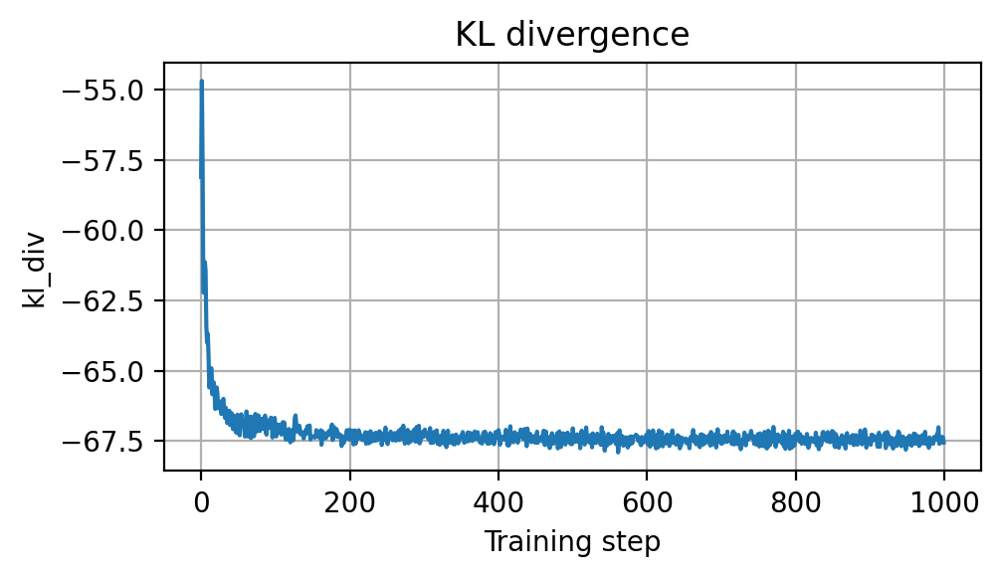

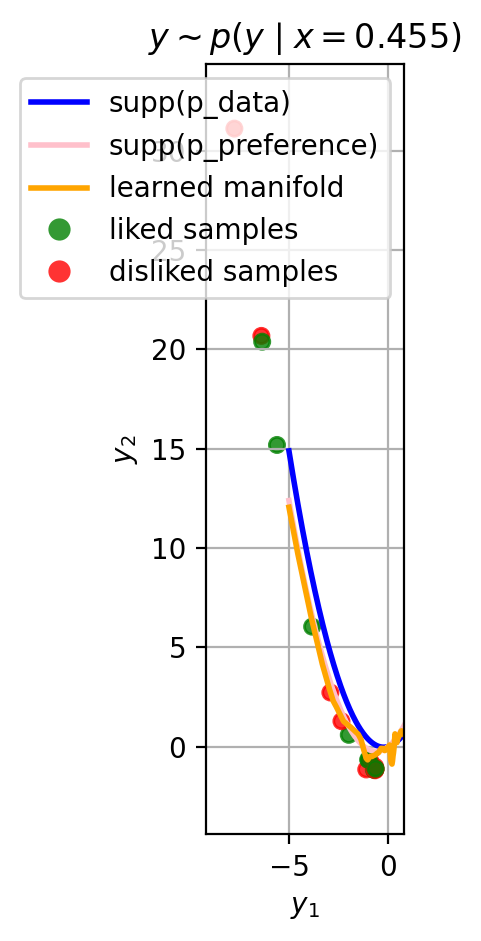

In [ ]:
for iter in range(num_iter):
    log_folder = Path(f"iter_{iter}")
    # Step 1: Pre-training
    #opt = optax.adam(pre_train_lr)
    opt = optax.chain(
        optax.clip_by_global_norm(clip_norm),
        optax.adam(pre_train_lr),
    )
    opt_state = opt.init(vae_params)

    loss_history = []

    for step in range(pre_train_epochs):
        key, subkey = jax.random.split(key)
        vae_params, opt_state, loss = pre_train_step(
            vae_params, step, opt_state, subkey, xs[:,0], jax.lax.stop_gradient(ys[:,0])
        )
        loss_val = float(loss)          # convert from JAX scalar
        loss_history.append(loss_val)

        print(f"[{step+1}/{pre_train_epochs}] -ELBO = {loss_val}")

    logger.log_data(vae_params, log_folder / "vae_params.npz")

    # Plot loss
    fig = plt.figure(figsize=(5, 3), dpi=200)
    plt.plot(loss_history)
    plt.xlabel("Training step")
    plt.ylabel("-ELBO")
    plt.title("VAE training loss")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    logger.log_data(fig, log_folder / "vae_pre_training_loss.png")

    ys = sample_many(vae_params, ys_key, xs[:,0], m)
    ys_query = ys[:n_queries]
    y_history.append(ys_query)   # ys for queries

    logits = logpdf_labels(
        xs,
        ys,
        alpha=target_p.alpha,
        beta=target_p.beta,
        gamma=target_p.gamma,
        tau=tau,
    )
    gt_labels = jax.random.categorical(
        l_key,
        logits,
        axis=-1,
    )
    ls = gt_labels[:n_queries]
    l_history.append(ls)   # labels used for queries

    if ys_tot is None:
        ys_tot = ys_query
        l_tot = ls
        xs_tot = xs[:n_queries]
    else:
        ys_tot = jnp.concatenate([ys_tot, ys_query], axis=0)
        l_tot = jnp.concatenate([l_tot, ls], axis=0)
        xs_tot = jnp.concatenate([xs_tot, xs[:n_queries]], axis=0)

    # TODO: Generate samples for visualization
    ys_vis = sample_many(vae_params, ys_key, xs[:10,0], config["vis_m"])

    u = utility_vmapped(
        xs,
        ys,
        target_p.alpha,
        target_p.beta,
        target_p.gamma,
    )

    task_vis.visualize(
        xs[0, 0, 0],
        ys_vis[0],
        base_manifold=base_p,
        target_manifold=target_p,
        #labels=gt_labels[0],
        scale="free"
    )

    mean_u = jnp.mean(u)
    gt_u_history.append(float(mean_u))

    fig = task_vis.visualize(
        xs[0, 0, 0],
        ys[0],
        base_manifold=base_p,
        target_manifold=target_p,
        labels=gt_labels[0],
        scale="free"
    )
    logger.log_data(fig, log_folder / "pre_trained_samples.png")


    # Step 2: Learn preference model
    #opt = optax.adam(pref_lr)
    opt = optax.chain(
        optax.clip_by_global_norm(clip_norm),
        optax.adam(pref_lr),
    )
    opt_state = opt.init(pref_params)

    loss_history = []

    n_tot = xs_tot.shape[0]
    for step in range(pref_train_epochs):
        key, subkey = jax.random.split(key)
        idx = jax.random.randint(
            subkey,
            (pref_batch_dim,),
            minval=0,
            maxval=n_tot
        )
        xs_batch = xs_tot[idx]
        ys_batch = ys_tot[idx]
        l_batch = l_tot[idx]
        pref_params, opt_state, loss = pref_train_step(
            pref_params,
            opt_state,
            xs_batch,        # (pref_batch_dim, m, 1)
            ys_batch,        # (pref_batch_dim, m, 2)
            l_batch,   # (pref_batch_dim, m)
        )

        loss_val = float(loss)
        loss_history.append(loss_val)

        print(f"[{step+1}/{pref_train_epochs}] NLL = {loss_val:.4f}")

    logger.log_data(pref_params, log_folder / "pref_params.npz")

    # Plot loss
    fig = plt.figure(figsize=(5, 3), dpi=200)
    plt.plot(loss_history)
    plt.xlabel("Training step")
    plt.ylabel("nll")
    plt.title("Pref model loss")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    logger.log_data(fig, log_folder / "pref_training_loss.png")

    pred_logits = pref_model.logpdf(
        pref_params,
        xs,
        ys,
        tau=tau
    )

    pred_labels = jax.random.categorical(
        l_key,
        pred_logits,
        axis=-1,
    )

    gt_logits = logpdf_labels(
        xs,
        ys,
        alpha=target_p.alpha,
        beta=target_p.beta,
        gamma=target_p.gamma,
        tau=tau,
    )

    gt_new_labels = jax.random.categorical(
        gt_l_key,
        gt_logits,
        axis=-1,
    )

    acc_gt = jnp.mean(gt_new_labels == gt_labels)
    acc_learned = jnp.mean(pred_labels == gt_labels)

    perc_likes = jnp.mean(gt_labels == 1)

    print(f"Dataset composition (likes/dislikes):   {perc_likes} / {1 - perc_likes}")

    print(f"ACC(learned vs GT):   {acc_learned} / {acc_gt}")

    #y2_fn = lambda x, y: y2_learned(pref_params["y2_fn"], x, y) / (jax.nn.softplus(pref_params["log_tau"]) + 1e-6)
    y2_fn = lambda x, y: y2_learned(pref_params["y2_fn"], x, y)

    fig = task_vis.visualize(
        xs[0, 0, 0],
        ys[0],
        base_manifold=base_p,
        target_manifold=target_p,
        learned_manifold=y2_fn,
        labels=gt_labels[0],
        scale="free"
    )
    logger.log_data(fig, log_folder / "learned_manifold.png")


    # Step 3: Improve VAE

    base_vae_params = jax.lax.stop_gradient(vae_params)

    #y2_fn = lambda x, y: y2_learned(pref_params["y2_fn"], x, y) / (jax.nn.softplus(pref_params["log_tau"]) + 1e-6)
    y2_fn = lambda x, y: y2_learned(pref_params["y2_fn"], x, y)
    """ y2_fn = lambda x, y1: manifold(
        x,
        y1,
        target_p.alpha,
        target_p.beta,
        target_p.gamma,
    ) """

    #opt = optax.adam(align_lr)
    opt = optax.chain(
        optax.clip_by_global_norm(clip_norm),
        optax.adam(align_lr),
    )
    opt_state = opt.init(vae_params)

    loss_history = []
    u_history = []
    kl_history = []

    for step in range(align_epochs):
        key, subkey = jax.random.split(key, 2)
        vae_params, opt_state, loss = align_train_step(
            vae_params,
            base_vae_params,
            pref_params["y2_fn"],
            opt_state,
            subkey,
            xs[:,0],        # (B, 1)
            sigma_y_T
        )

        loss_val = float(loss)
        u_val = float(
            avg_u(
                vae_params,
                key,
                pref_params["y2_fn"],
                xs[:,0],
                sigma_y_T
            )
        )
        kl_val = float(
            kl_div(
                vae_params,
                base_vae_params,
                key,
                xs[:,0],
                sigma_y_T
            )
        )
        loss_history.append(loss_val)
        u_history.append(u_val)
        kl_history.append(kl_val)

        print(f"[{step+1}/{align_epochs}] loss = {loss_val:.4f}")

    logger.log_data(vae_params, log_folder / "improved_vae_params.npz")

    # Plot loss
    loss_fig = plt.figure(figsize=(5, 3), dpi=200)
    plt.plot(loss_history)
    plt.xlabel("Training step")
    plt.ylabel("loss")
    plt.title("Alignement loss")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot utility
    u_fig = plt.figure(figsize=(5, 3), dpi=200)
    plt.plot(u_history)
    plt.xlabel("Training step")
    plt.ylabel("avg_u")
    plt.title("Average utility")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot KL divergence
    d_kl_fig = plt.figure(figsize=(5, 3), dpi=200)
    plt.plot(loss_history)
    plt.xlabel("Training step")
    plt.ylabel("kl_div")
    plt.title("KL divergence")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    logger.log_data(fig, log_folder / "vae_alignement_loss.png")
    logger.log_data(fig, log_folder / "align_u.png")
    logger.log_data(fig, log_folder / "align_d_kl.png")

    (
        key,
        y_key,
        l_key,
        gt_l_key
    ) = jax.random.split(key, 4)

    ys = vmapped_vae_sample(
        vae_params,
        xs,
        jax.random.split(y_key, (m,))
    )

    gt_logits = logpdf_labels(
        xs,
        ys,
        alpha=target_p.alpha,
        beta=target_p.beta,
        gamma=target_p.gamma,
        tau=tau,
    )

    gt_new_labels = jax.random.categorical(
        gt_l_key,
        gt_logits,
        axis=-1,
    )

    #y2_fn = lambda x, y: y2_learned(pref_params["y2_fn"], x, y) / (jax.nn.softplus(pref_params["log_tau"]) + 1e-6)
    y2_fn = lambda x, y: y2_learned(pref_params["y2_fn"], x, y)

    fig = task_vis.visualize(
        xs[0, 0, 0],
        ys[0],
        base_manifold=base_p,
        target_manifold=target_p,
        learned_manifold=y2_fn,
        labels=gt_new_labels[0],
        scale="free"
    )
    logger.log_data(fig, log_folder / "aligned_samples.png")

[1/4000] -ELBO = 7.9649529457092285
[2/4000] -ELBO = 7.213715553283691
[3/4000] -ELBO = 6.470212936401367
[4/4000] -ELBO = 5.818627834320068
[5/4000] -ELBO = 5.714997291564941
[6/4000] -ELBO = 5.511541366577148
[7/4000] -ELBO = 5.41461706161499
[8/4000] -ELBO = 5.392141819000244
[9/4000] -ELBO = 5.2241363525390625
[10/4000] -ELBO = 5.210051536560059
[11/4000] -ELBO = 5.188480377197266
[12/4000] -ELBO = 5.058267116546631
[13/4000] -ELBO = 5.069777965545654
[14/4000] -ELBO = 5.051620006561279
[15/4000] -ELBO = 4.9229326248168945
[16/4000] -ELBO = 4.903115272521973
[17/4000] -ELBO = 4.90606689453125
[18/4000] -ELBO = 4.8096232414245605
[19/4000] -ELBO = 4.7948832511901855
[20/4000] -ELBO = 4.8370137214660645
[21/4000] -ELBO = 4.744839668273926
[22/4000] -ELBO = 4.752834320068359
[23/4000] -ELBO = 4.79522180557251
[24/4000] -ELBO = 4.733358383178711
[25/4000] -ELBO = 4.689667701721191
[26/4000] -ELBO = 4.742024898529053
[27/4000] -ELBO = 4.691784381866455
[28/4000] -ELBO = 4.65065050125122

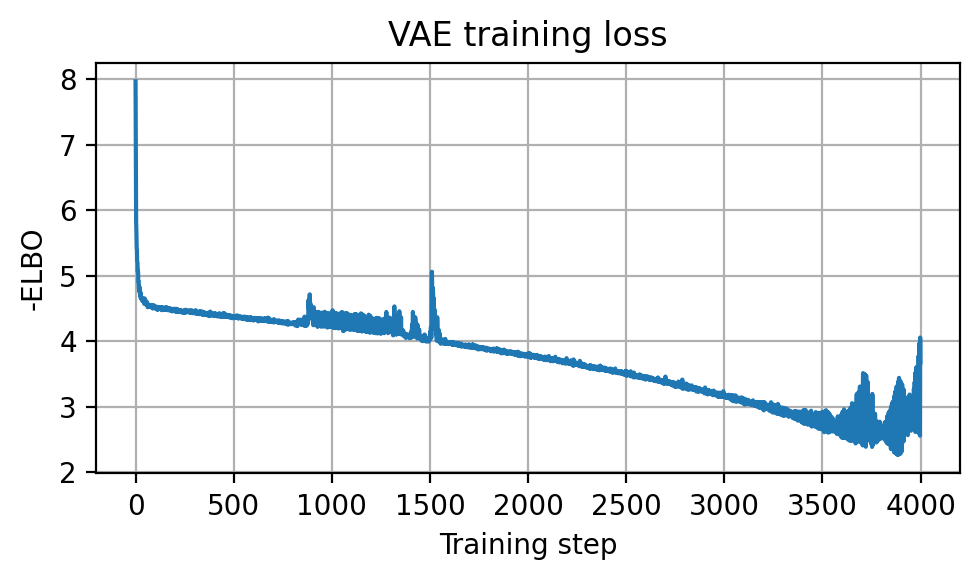

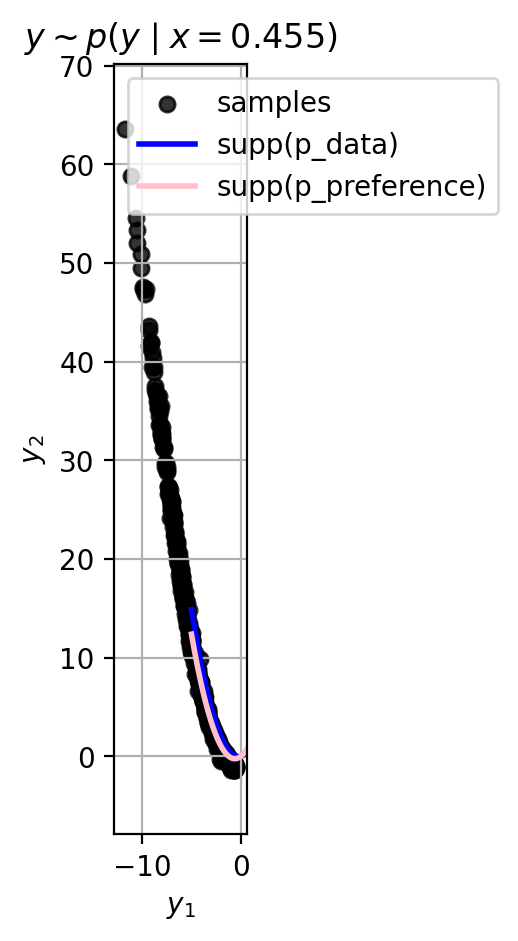

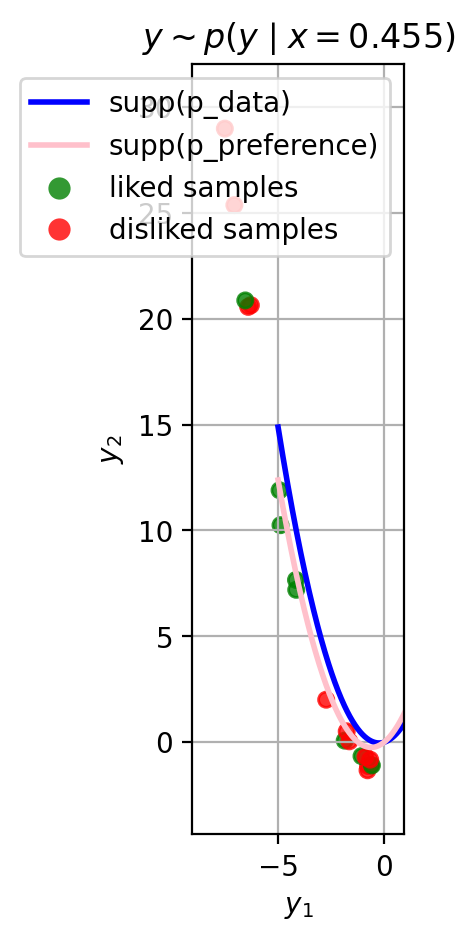

In [ ]:
# Step 1: Pre-training
#opt = optax.adam(pre_train_lr)
opt = optax.chain(
    optax.clip_by_global_norm(clip_norm),
    optax.adam(pre_train_lr),
)
opt_state = opt.init(vae_params)

loss_history = []

for step in range(pre_train_epochs):
    key, subkey = jax.random.split(key)
    vae_params, opt_state, loss = pre_train_step(
        vae_params, step, opt_state, subkey, xs[:,0], ys[:,0]
    )
    loss_val = float(loss)          # convert from JAX scalar
    loss_history.append(loss_val)

    print(f"[{step+1}/{pre_train_epochs}] -ELBO = {loss_val}")

logger.log_data(vae_params, Path("final") / "vae_params.npz")

# Plot loss
fig = plt.figure(figsize=(5, 3), dpi=200)
plt.plot(loss_history)
plt.xlabel("Training step")
plt.ylabel("-ELBO")
plt.title("VAE training loss")
plt.grid(True)
plt.tight_layout()
plt.show()
logger.log_data(fig, Path("final") / "samples.png")

ys = sample_many(vae_params, ys_key, xs[:,0], m)

ys_vis = sample_many(vae_params, ys_key, xs[:10,0], config["vis_m"])

u = utility_vmapped(
    xs,
    ys,
    target_p.alpha,
    target_p.beta,
    target_p.gamma,
)

task_vis.visualize(
    xs[0, 0, 0],
    ys_vis[0],
    base_manifold=base_p,
    target_manifold=target_p,
    #labels=labels[0],
    scale="free"
)

mean_u = jnp.mean(u)
gt_u_history.append(float(mean_u))

logits = logpdf_labels(
    xs,
    ys,
    alpha=target_p.alpha,
    beta=target_p.beta,
    gamma=target_p.gamma,
    tau=tau,
)

labels = jax.random.categorical(
    l_key,
    logits,
    axis=-1,
)

l_history.append(labels)   # labels used for queries

fig = task_vis.visualize(
    xs[0, 0, 0],
    ys[0],
    base_manifold=base_p,
    target_manifold=target_p,
    labels=labels[0],
    scale="free"
)
logger.log_data(fig, Path("final") / "samples.png")

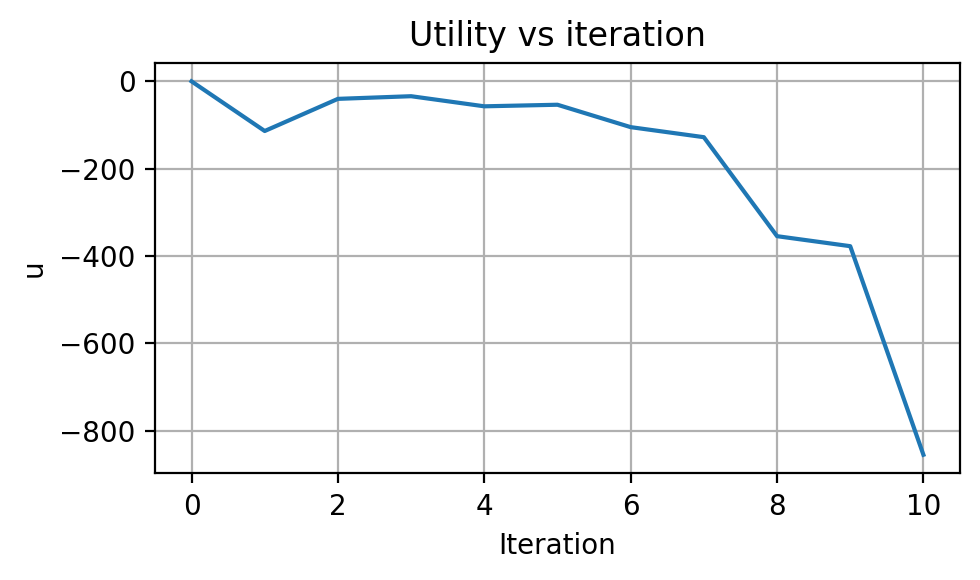

In [ ]:
fig = plt.figure(figsize=(5, 3), dpi=200)
plt.plot(gt_u_history)
plt.xlabel("Iteration")
plt.ylabel("u")
plt.title("Utility vs iteration")
plt.grid(True)
plt.tight_layout()
plt.show()
logger.log_data(fig, "gt_u_vs_iter.png")

In [ ]:
print("gt_u_history = ", gt_u_history)

gt_u_history =  [-0.26546066999435425, -114.01339721679688, -40.39127731323242, -34.31425857543945, -57.451290130615234, -53.856971740722656, -105.14236450195312, -128.1449432373047, -354.81219482421875, -377.7373352050781, -855.4036865234375]
